# Code for performing the Dominant Balance analysis in the spatio-temporal and spatio-spectral domains

### Optical wave breaking:

$i\psi_{\xi} - \delta \psi_{\tau \tau} + |\psi|^2 \psi = 0$

###### Andrei V. Ermolaev 25 March 2024 
Code includes: 
1. Dimensionless code to simulate the dynamics (produces the spatio-temporal and spatio-spectral maps)
- for both spatio-temporal and spatio-spectral maps:
2. Piece of code to compute the equation terms in the dimensionless form in time and spectral domains
3. Pointwise dominant balance approach
4. Module to perform the Gaussian Mixture Modeling in the corresponding equation space
5. Clusterwise hypothesis selecion procedure
6. Other pieces to display the results

## I Numerical simulation of the field propagation

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import randint
import scipy.io as sio
import findiff as fd
import cmath as cmt


import matplotlib as mpl
mpl.rc('text', usetex=False)
mpl.rc('font', family='serif')
mpl.rc('xtick', labelsize=14)
mpl.rc('ytick', labelsize=14)
mpl.rc('axes', labelsize=20)
mpl.rc('axes', titlesize=20)
%config InlineBackend.figure_format = 'retina'

from sklearn.mixture import GaussianMixture
from sklearn.decomposition import SparsePCA

# Optionally, set cluster zero to white
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cm = plt.get_cmap('Set1')
new_cm = cm(np.arange(cm.N))
new_cm[0, :] = [1, 1, 1, 1]
cm_white = ListedColormap(new_cm)

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette('deep').as_hex()
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_cmap = ListedColormap(sns_list)

cm = sns_cmap

### 1 Parameters for simulation & propagation

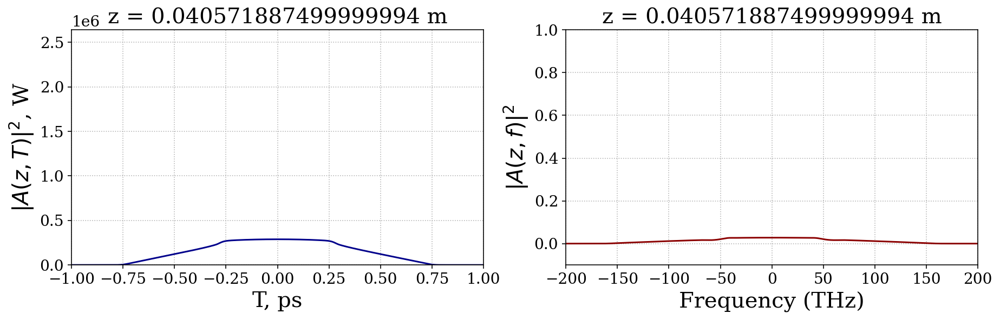

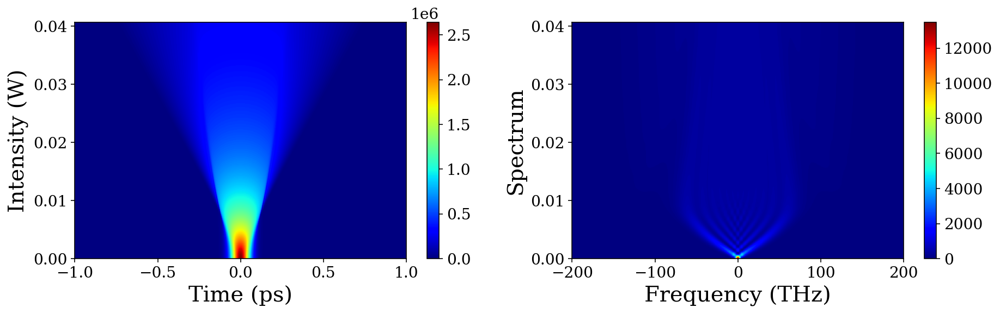

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from IPython import display
import findiff as fd


# lambda0 = 1550e-9
lambda0 = 850e-9
c = 299792458
F0 = c / lambda0

# Time and Frequency Grids

Npts = 2 * 2048
Tmax = 1e-12
dT = 2 * Tmax / (Npts - 1)
TT = np.arange(-Npts / 2, Npts / 2) * dT
FF = np.arange(-Npts / 2, Npts / 2) / (2 * Tmax)
WW = 2 * np.pi * FF
lambda_val = c / (FF + F0)

# Fibre Parameters
# beta2 = 0.5 * 0.8397e-27
beta2 = 20e-27
# gamma = 11.7e-3
gamma = 2.1e-3

# Pulse duration and power
# T0 = 2.7e-12
T0 = 57e-15
# P0 = 0.89
P0 = 2.64 * 10**(6)


# Characteristic Length Scales
L_D = T0**2 / abs(beta2)
L_NL = 1 / (gamma * P0)

print('Dispersion length =', L_D)
print('Nonlinear length =', L_NL)


# Initial Pulse - create Riemann profile
A0 = np.sqrt(P0) * np.exp(-TT**2 / (2 * T0**2))
# A0 = np.sqrt(P0) * (1/np.cosh(TT/T0))

# phi = 2 * np.sqrt(gamma / beta2) * np.cumsum(np.abs(A0) * dT)
# A0 = A0 * np.exp(-1j * phi)

# ----------------------- Propagation --------------------------

Nz = 3000
# Lz = 1000
Lz = 0.25 * L_D
dz = Lz / Nz
Nplots = 1000

# Operators
sel = round(Nz / (Nplots - 1))
ZZ = np.linspace(0, Lz, Nplots)
Ip = np.zeros((Nplots, Npts))
Ip_TF = np.zeros((Nplots, Npts))
AAt = np.zeros((Nplots, Npts), dtype = 'complex')
AAf = np.zeros((Nplots, Npts), dtype = 'complex')


Ip[0, :] = np.abs(A0)**2
Ip_TF[0, :] = np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(A0))))**2
S_norm = np.max(Ip_TF[0, :])
Ip_TF[0, :] = Ip_TF[0, :] / S_norm

AAt[0, :] = A0
AAf[0, :] = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(A0)))
# print(f'Courbe No. 1 de {Nplots}')

A1 = A0

for ii in range(1, Nz):
    A_TF = np.fft.fftshift(np.fft.ifft(A1)) * np.exp(1j * beta2 / 2 * WW**2 * dz)
    A1 = np.fft.fft(np.fft.fftshift(A_TF))
    A1 = A1 * np.exp(1j * gamma * dz * np.abs(A1)**2)

    if (ii / sel) == round(ii / sel):
      #  print(f'Courbe No. {1 + ii // sel} de {Nplots}')
        Ip[ii // sel, :] = np.abs(A1)**2
        Ip_TF[ii // sel, :] = np.abs(A_TF)**2 / S_norm
        
        AAt[ii // sel, :] = A1 
        AAf[ii // sel, :] = A_TF
        
        # ----------------------- Display --------------------------

        display.clear_output(wait = True)
        
        plt.figure(figsize=(15, 4));
        plt.subplot(121)
        plt.plot(TT * 10**12, np.abs(AAt[ii // sel, :])**2, color = 'darkblue')
        plt.ylim(-100,P0)
        plt.xlim(-1, 1)
        plt.xlabel('T, ps')
        plt.ylabel('$|A(z,T)|^2$, W')
        plt.title(f'z = {ii * dz} m')
        plt.grid('True',linestyle = ':')
        
        plt.subplot(122)
        plt.plot(FF * 1e-12, np.abs(AAf[ii // sel, :])**2 / S_norm, color = 'darkred')
        plt.ylim(-0.1, 1)
        plt.xlim(-200, 200)
        plt.xlabel('Frequency (THz)')
        plt.ylabel('$|A(z,f)|^2$')
        plt.title(f'z = {ii * dz} m')
        plt.grid('True',linestyle = ':')
        
        plt.show()

# ----------------------- Display --------------------------

plt.figure(figsize=(15, 4));
# plt.figure(1)
plt.subplot(122)
a = plt.pcolormesh(1e-12 * FF, ZZ, np.abs(AAf)**2, shading='auto', cmap='jet')
xl = plt.xlabel('Frequency (THz)')
yl = plt.ylabel('Distance z (m)')
zl = plt.ylabel('Spectrum')
plt.xlim([-200, 200])
plt.colorbar(a)

plt.figure(1)
plt.subplot(121)
plt.pcolormesh(1e12 * TT, ZZ, np.abs(AAt)**2, shading='auto', cmap='jet')
xl = plt.xlabel('Time (ps)')
yl = plt.ylabel('Distance z (m)')
zl = plt.ylabel('Intensity (W)')
plt.xlim([-1, 1])
plt.colorbar()
plt.show()

### 2. Converting to dimensionless form / Evaluating individual terms and verifying the total balance in equation (SOLITONIC SCALE)

In [3]:
t = TT * np.sqrt(2) / T0
# x = ZZ / L_NL
x = ZZ / L_D
# u = AAt * T0 * np.sqrt(gamma / np.abs(beta2))
u = np.sqrt(L_D/L_NL) * AAt / np.sqrt(P0)
s = (AAf / np.sqrt(S_norm))
# f = FF * 1e### 2. Converting to dimensionless form / Evaluating individual terms and verifying the total balance in equation -12
f = np.arange(-Npts / 2, Npts / 2) / (2 * max(t))
d = 1

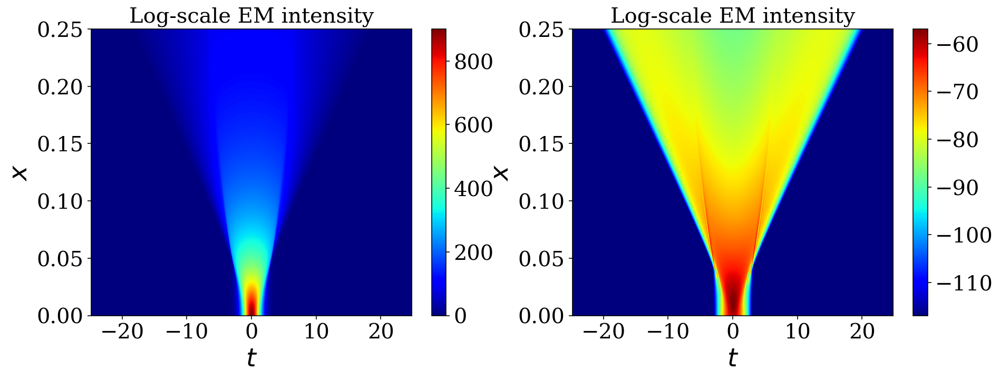

Error order =  0.002294078426522943
Error order =  1.1830826030181444e-05


In [4]:
# Compute log scale intensity
# it = lambda field: 10*np.log10(abs(field)**2) 
it = lambda field: abs(field)**2


dt = t[1] - t[0]
dx = x[1] - x[0]
n = len(t) # grid size
ACC = 8

#Computing the terms in the eqquation
d_dx = fd.FinDiff(0, dx, 1, acc = ACC)
ux = 1j * d_dx(u)

d2_dt2 = fd.FinDiff(1, dt, 2, acc = ACC)
utt = - d2_dt2(u)

uuu = u * np.abs(u)**2

colc = 'jet'
## Plot energy content in temporal domain
plt.figure(figsize=(15, 5))

lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot

plt.subplot(1,2,1)
plt.imshow(lIT, cmap=colc, origin='lower', vmin=0, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
plt.xlabel('Delay')
plt.ylabel('Distance')
plt.title('Log-scale EM intensity')
cb = plt.colorbar()
cb.ax.tick_params(labelsize=20)
plt.xlabel('$t$', fontsize=24)
plt.ylabel('$x$', fontsize=24)
plt.gca().tick_params(labelsize=20)


#Plotting the error
it = lambda field: 10*np.log10(abs(field)**2) 
lIT = it((ux + utt + uuu) / (L_D / L_NL)**(3/2)); # log scale temporal intensity
mlIT = max(lIT.flatten())       # max value, for scaling plot

plt.subplot(1,2,2)
plt.imshow(lIT, cmap=colc, origin='lower', vmin=mlIT-60, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
plt.xlabel('Delay')
plt.ylabel('Distance')
plt.title('Log-scale EM intensity')
cb = plt.colorbar()
cb.ax.tick_params(labelsize=20)
plt.xlabel('$t$', fontsize=24)
plt.ylabel('$x$', fontsize=24)
plt.gca().tick_params(labelsize=20)
plt.show()

#Total abs sum of the terms across the space normalised to the field
print('Error order = ', np.sum(np.abs(ux + utt + uuu)) / np.sum(np.abs(u) * np.abs(u)**2))
print('Error order = ', (np.sum(np.abs(ux + utt + uuu)))**(1/3) / np.sum(np.abs(u)))
# print('Error order = ', np.sum(np.abs(ux + utt + uuu)**2) / np.sum(np.abs(u))**2)

### 2. Converting to dimensionless form / Evaluating individual terms and verifying the total balance in equation (OWB SCALE)

### 2.1 Converting to dimensionless form

In [5]:
t = TT * np.sqrt(2) / T0
# t = TT * np.sqrt(2) * np.sqrt(gamma * P0 / np.abs(beta2))
x = ZZ * gamma * P0
u = AAt / np.sqrt(P0)
s = (AAf / np.sqrt(S_norm))
# f = FF * 1e-12
f = np.arange(-Npts / 2, Npts / 2) / (2 * max(t))
d = beta2 / (T0**2 * gamma * P0)
# d = 1

### 2.2 Evaluating individual terms and verifying the total balance in equation 

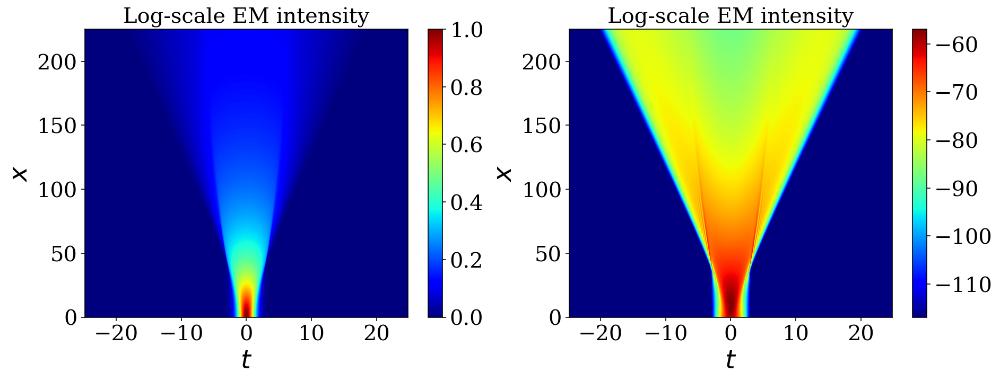

Error order =  0.0022940784265232
Error order =  1.1830826030181888e-05


In [6]:
dt = t[1] - t[0]
dx = x[1] - x[0]
n = len(t) # grid size
ACC = 8

# Compute log scale intensity
# it = lambda field: 10*np.log10(abs(field)**2) 
it = lambda field: abs(field)**2


#Computing the terms in the eqquation
d_dx = fd.FinDiff(0, dx, 1, acc = ACC)
ux = 1j * d_dx(u)

d2_dt2 = fd.FinDiff(1, dt, 2, acc = ACC)
utt = -d * d2_dt2(u)
uuu = u * np.abs(u)**2

colc ='jet'
## Plot energy content in temporal domain
plt.figure(figsize=(15, 5))

lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot

plt.subplot(1,2,1)
plt.imshow(lIT, cmap=colc, origin='lower', vmin=0, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
plt.xlabel('Delay')
plt.ylabel('Distance')
plt.title('Log-scale EM intensity')
cb = plt.colorbar()
cb.ax.tick_params(labelsize=20)
plt.xlabel('$t$', fontsize=24)
plt.ylabel('$x$', fontsize=24)
plt.gca().tick_params(labelsize=20)


#Plotting the error
it = lambda field: 10*np.log10(abs(field)**2) 
lIT = it(ux + utt + uuu); # log scale temporal intensity
mlIT = max(lIT.flatten())       # max value, for scaling plot

plt.subplot(1,2,2)
plt.imshow(lIT, cmap=colc, origin='lower', vmin=mlIT-60, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
plt.xlabel('Delay')
plt.ylabel('Distance')
plt.title('Log-scale EM intensity')
cb = plt.colorbar()
cb.ax.tick_params(labelsize=20)
plt.xlabel('$t$', fontsize=24)
plt.ylabel('$x$', fontsize=24)
plt.gca().tick_params(labelsize=20)
plt.show()

#Total abs sum of the terms across the space normalised to the field
print('Error order = ', np.sum(np.abs(ux + utt + uuu)) / np.sum(np.abs(u) * np.abs(u)**2))
print('Error order = ', (np.sum(np.abs(ux + utt + uuu)))**(1/3) / np.sum(np.abs(u)))

In [7]:
from IPython import display

U = np.empty_like(u)
Ux = np.empty_like(ux)
Utt = np.empty_like(utt)
UUU = np.empty_like(uuu)

for ii in range(0,len(x), 1):
    display.clear_output(wait = True)
#     plt.figure(figsize=(16, 6));
#     plt.subplot(1,2,1)
#     plt.semilogy(t, np.abs(u[ii,:]), color ='black',linestyle = ':', label = 'field')
#     plt.semilogy(t, np.abs(ux[ii,:]), color ='red', label = 'propagation term')
#     plt.semilogy(t, np.abs(utt[ii,:]), color ='gray', label = 'dispersion')
#     plt.semilogy(t, np.abs(uuu[ii,:]), color ='purple', label = 'Kerr')
#     plt.semilogy(t, np.abs(ux[ii,:] + utt[ii,:] + uuu[ii,:]), color ='green',linestyle = ':', label = 'error')
#     plt.xlim(-30,30)
#     plt.ylim(10**(-5), 1)
#     plt.legend()


    U[ii,:] = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(u[ii,:])))
    Ux[ii,:] = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(ux[ii,:])))
    Utt[ii,:] = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(utt[ii,:])))
    UUU[ii,:] = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(uuu[ii,:])))
    
#     plt.subplot(1,2,2)
#     plt.semilogy(f, np.abs(U[ii,:]), color ='black',linestyle = ':', label = 'field')
#     # plt.semilogy(f, np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(ux[ii,:])))), color ='red', label = 'propagation term')
#     # plt.semilogy(f, np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(utt[ii,:])))), color ='gray', label = 'dispersion')
#     # plt.semilogy(f, np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(uuu[ii,:])))), color ='purple', label = 'Kerr')
#     plt.semilogy(f, np.abs(Ux[ii,:]), color ='red', label = 'propagation term')
#     plt.semilogy(f, np.abs(Utt[ii,:]), color ='gray', label = 'dispersion')
#     plt.semilogy(f, np.abs(UUU[ii,:]), color ='purple', label = 'Kerr')
#     plt.semilogy(f, np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(ux[ii,:] + utt[ii,:] + uuu[ii,:])))), color ='green',linestyle = ':', label = 'error')
#     plt.xlim(-10,10)
#     plt.ylim(10**(-5), 0.1)
#     plt.legend()
#     plt.show()

### 3. Plotting the individual contributions (modulus squared) of all the terms across the space

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in log10


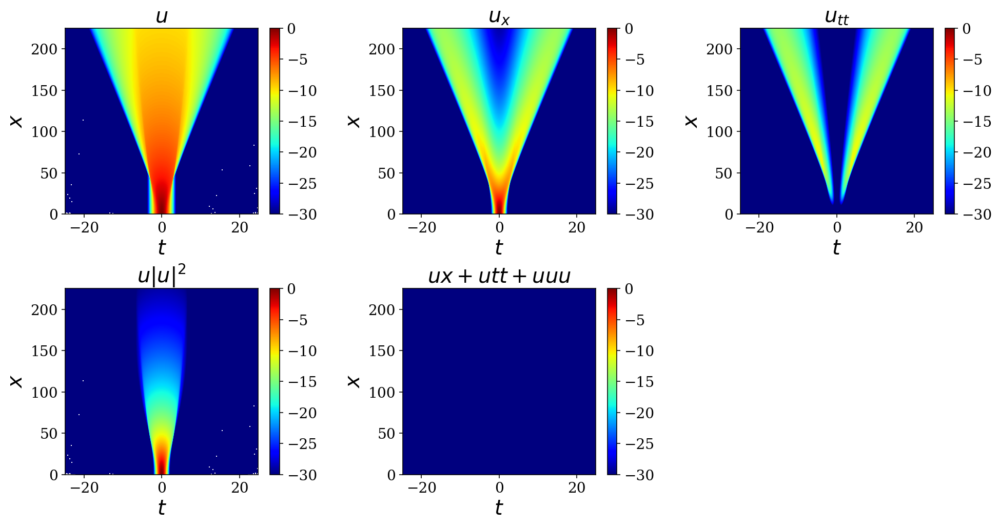

In [8]:
## Plot colormaps of different RHS terms in library
# delta_x = 50;  # Spatial window
# delta_t = 150; # Temporal window 
# shift_x = 5;   # How far to slide the window
# shift_t = 20;  # 

#x0 = np.arange(delta_x//2, len(x)-delta_x//2, shift_x)  # Centers of window, in index coordinates
#t0 = np.arange(tmin, length(t)-delta_t//2, shift_t)

# mlIT = 10
TRS = 30
x0 = np.arange(len(x))
t0 = np.arange(len(t));  # No downsampling

plt.figure(figsize=(16, 8));

plt.subplot(2, 3, 1)
# Plot full field intensity
C = it(u);
mlIT = max(C.flatten())

plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$t$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u$')

plt.subplot(2, 3, 2);
# LHS
C = it(ux);
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$t$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u_x$')

plt.subplot(2, 3, 3);
C = it( utt );
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$t$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u_{tt}$')

plt.subplot(2, 3, 4);
C = it( uuu );
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$t$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u|u|^2$')

plt.subplot(2, 3, 5);
C = it(+ux + utt + uuu );
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$t$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$ux + utt + uuu$')


# plt.subplot(2, 3, 5);
# C = it( du_dt[4] );
# plt.imshow(C, cmap='bone_r', origin='lower', vmin=mlIT-50.0, vmax=mlIT,
#           extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
# plt.xlim(trange);
# plt.xlabel('$t$')
# plt.ylabel('$x$');
# plt.colorbar()
# plt.title('$u_{tttt}$')


# plt.subplot(2, 3, 6);
# C = it( raman ); 
# plt.imshow(C, cmap='bone_r', origin='lower', vmin=mlIT-50.0, vmax=mlIT,
#           extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
# plt.xlim(trange);
# plt.xlabel('$t$')
# plt.ylabel('$x$');
# plt.colorbar()
# plt.title('Raman (w/ Kerr)')

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
plt.show()

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in log10


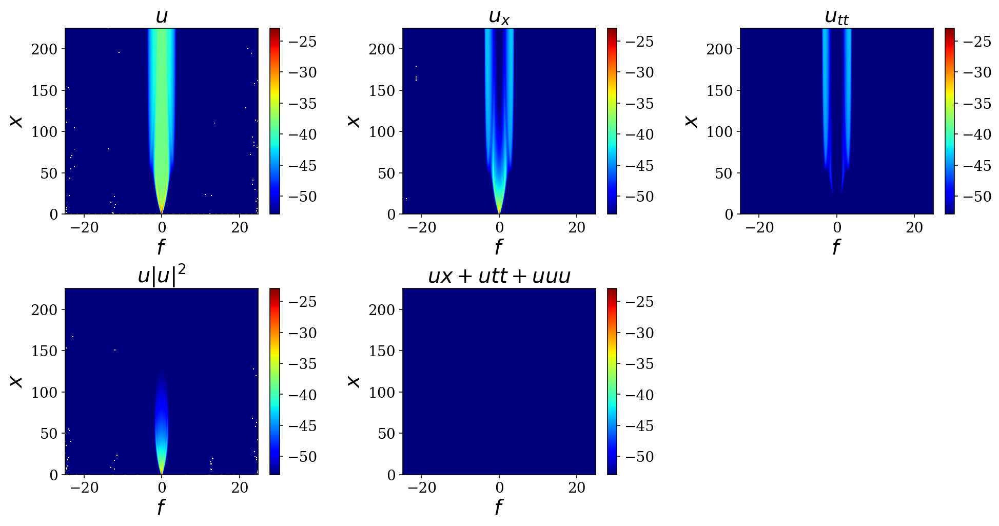

In [9]:
## Plot colormaps of different RHS terms in library
# delta_x = 50;  # Spatial window
# delta_t = 150; # Temporal window 
# shift_x = 5;   # How far to slide the window
# shift_t = 20;  # 

#x0 = np.arange(delta_x//2, len(x)-delta_x//2, shift_x)  # Centers of window, in index coordinates
#t0 = np.arange(tmin, length(t)-delta_t//2, shift_t)

# mlIT = 10
TRS = 30
x0 = np.arange(len(x))
t0 = np.arange(len(t));  # No downsampling

plt.figure(figsize=(16, 8));

plt.subplot(2, 3, 1)
# Plot full field intensity
C = it(U);
mlIT = max(C.flatten())

plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$f$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u$')

plt.subplot(2, 3, 2);
# LHS
C = it(Ux);
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$f$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u_x$')

plt.subplot(2, 3, 3);
C = it( Utt );
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$f$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u_{tt}$')

plt.subplot(2, 3, 4);
C = it( UUU );
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$f$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$u|u|^2$')

plt.subplot(2, 3, 5);
C = it(+Ux + Utt + UUU);
plt.imshow(C, cmap=colc, origin='lower', vmin=mlIT-TRS, vmax=mlIT,
          extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
plt.xlabel('$f$')
plt.ylabel('$x$');
plt.colorbar()
plt.title('$ux + utt + uuu$')


# plt.subplot(2, 3, 5);
# C = it( du_dt[4] );
# plt.imshow(C, cmap='bone_r', origin='lower', vmin=mlIT-50.0, vmax=mlIT,
#           extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
# plt.xlim(trange);
# plt.xlabel('$f$')
# plt.ylabel('$x$');
# plt.colorbar()
# plt.title('$u_{tttt}$')


# plt.subplot(2, 3, 6);
# C = it( raman ); 
# plt.imshow(C, cmap='bone_r', origin='lower', vmin=mlIT-50.0, vmax=mlIT,
#           extent=[min(t), max(t), min(x), max(x)], aspect='auto');          # plot as pseudocolor map
# plt.xlim(trange);
# plt.xlabel('$f$')
# plt.ylabel('$x$');
# plt.colorbar()
# plt.title('Raman (w/ Kerr)')

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
plt.show()

# II Performing the dominant balance analysis in frequency domain

### 1. Constructing the feature matrix 

In [53]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = Ux
featuremap[:, :, -2] = Utt
featuremap[:, :, -1] = UUU

labels = ['$U_{x}$', '$U_{tt}$', '$UUU$']

# Downsample for building model
shift_x, shift_t = 1, 1
tmin = 0

x0 = np.arange(0, len(x), shift_x)
t0 = np.arange(tmin, len(t), shift_t)
featuremap = featuremap[x0, :, :]
featuremap = featuremap[:, t0, :]

# Leave out near-zero field values (numerical noise and essentially zero dynamics)
lIT = it(U)
lIT = lIT[x0, :]
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT - TRS

features = np.reshape(featuremap, [len(x0)*len(t0), nfeatures], order='F')
features = features[mask.flatten('F'), :]

# Treat real/imag as separate features
features = np.hstack((np.real(features), np.imag(features)))
# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in log10


In [146]:
# from sklearn.preprocessing import StandardScaler

# # Assuming your dataset is named 'features'
# # Instantiate StandardScaler
# scaler = StandardScaler()

# # Fit scaler to your data
# scaler.fit(features)

# # Transform your data
# features = scaler.transform(features)

In [54]:
from sklearn.preprocessing import RobustScaler

# Assuming your dataset is named 'features'
# Instantiate RobustScaler
scaler = RobustScaler()

# Fit scaler to your data
scaler.fit(features)

# Transform your data
features = scaler.transform(features)

### 2. Visualising the dynamical patterns in equation space 

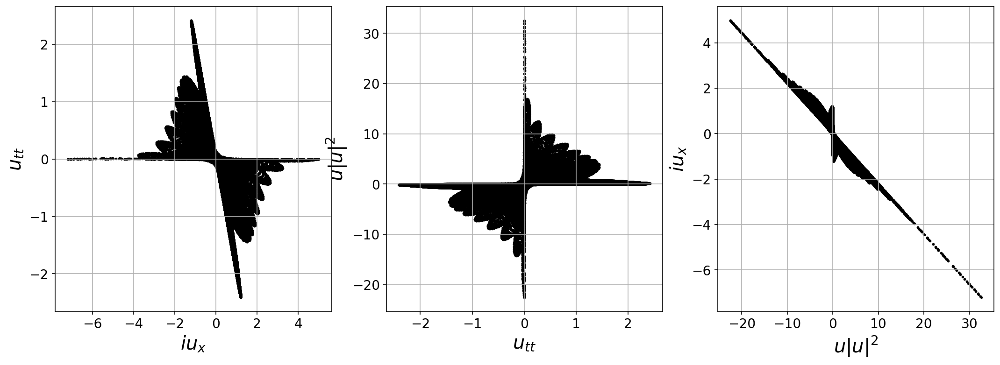

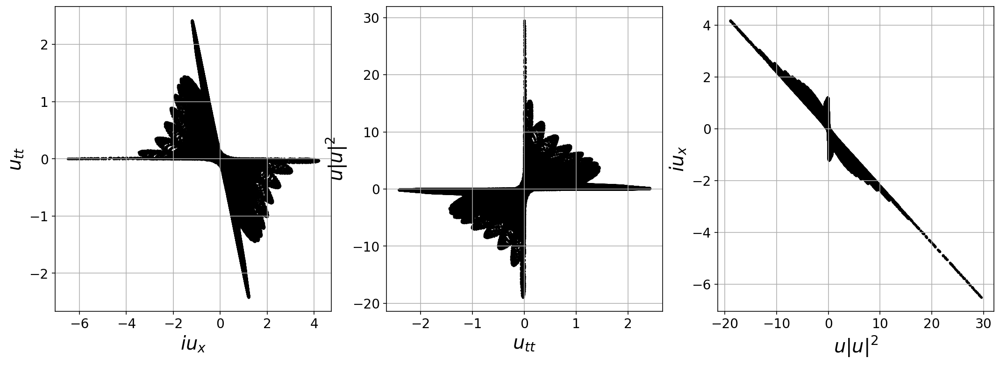

In [55]:
labels = ['$iu_x$', '$u_{tt}$', '$u|u|^2}$']

plt.figure(figsize=(18, 6))
plt.subplot(131)
plt.scatter(features[:, 0], features[:,1], 3, 'k')
plt.xlabel(labels[0])
plt.ylabel(labels[1])
plt.grid()

plt.subplot(132)
plt.scatter(features[:, 1], features[:,2], 3, 'k')
plt.xlabel(labels[1])
plt.ylabel(labels[2])
plt.grid()

plt.subplot(133)
plt.scatter(features[:, 2], features[:,0], 3, 'k')
plt.xlabel(labels[2])
plt.ylabel(labels[0])
plt.grid()

plt.show()

plt.figure(figsize=(18, 6))
plt.subplot(131)
plt.scatter(features[:, 3], features[:,4], 3, 'k')
plt.xlabel(labels[0])
plt.ylabel(labels[1])
plt.grid()

plt.subplot(132)
plt.scatter(features[:, 4], features[:,5], 3, 'k')
plt.xlabel(labels[1])
plt.ylabel(labels[2])
plt.grid()

plt.subplot(133)
plt.scatter(features[:, 5], features[:,3], 3, 'k')
plt.xlabel(labels[2])
plt.ylabel(labels[0])
plt.grid()

plt.show()

### 3. Performing the GMM 

In [56]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import SparsePCA

# Fit to GMM and plot covariance matrices
nc = 8
#nc = 15 - works
seed = np.random.randint(2**20)

# GaussianMixture(n_components=14, random_state=502082) for TRS = 40
# GaussianMixture(n_components=14, random_state=24328)


#  Keep a random seed for plot reproducibility
# seed = 261912
# random_state=847636 WHEN NC = 5 - NICE REPRESENTATION
# GaussianMixture(n_components=5, random_state=508257)
# GaussianMixture(n_components=10, random_state=777341)
# GaussianMixture(n_components=15, random_state=180373)
# GaussianMixture(n_components=8, random_state=960637)
# GaussianMixture(n_components=6, random_state=987061)
# GaussianMixture(n_components=10, random_state=102230)
# GaussianMixture(n_components=18, random_state=254470) STD
# GaussianMixture(n_components=16, random_state=40838) STD - really good
# GaussianMixture(n_components=16, random_state=105186) Robust scaler
# GaussianMixture(n_components=16, random_state=137467) RS
# GaussianMixture(n_components=8, random_state=977799) RS - close to the pointwise

seed = 977799
model = GaussianMixture(n_components=nc, random_state=seed)
model.fit(features)

GaussianMixture(n_components=8, random_state=977799)

### 4. Recomputing for the full domain (if needed) 

In [57]:
# # Recompute features for full domain

nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = Ux
featuremap[:, :, -2] = Utt
# featuremap[:, :, -2] = uttt
featuremap[:, :, -1] = UUU

labels = ['$iU_{x}$', '$U_{tt}$', '$UUU$']

tmin = 0

t0 = np.arange(tmin, len(t))
featuremap = featuremap[:, t0, :];

# Mask by nonzero field values
lIT = it(U)
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT-TRS  # Get rid of tiny values in the field

features = np.reshape(featuremap, [len(x)*len(t0), nfeatures], order='F');
features = features[mask.flatten('F'), :]

features = np.hstack((np.real(features), np.imag(features))) # Treat real/imag as separate features
# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5 # Treat real/imag as separate features
features = scaler.transform(features)

# Cluster domain based on previously trained GMM
cluster_idx = model.predict(features)

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in log10


### 5. Plot the covariance matrices 

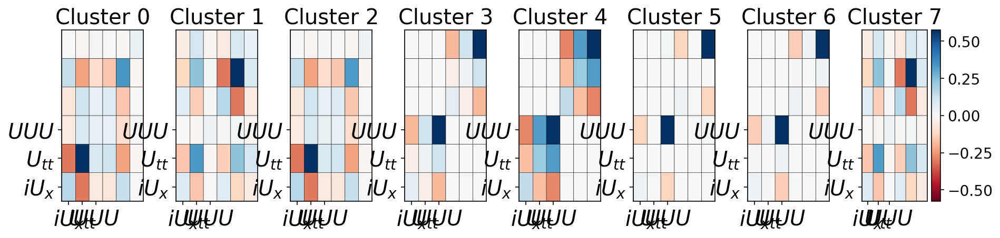

In [58]:
# Plot covariance matrices
plt.figure(figsize=(15, 3))
for i in range(nc):
    plt.subplot(1, nc, i + 1)
    C = model.covariances_[i, :, :]
    plt.pcolor(C, vmin=-max(abs(C.flatten())), vmax=max(abs(C.flatten())), cmap='RdBu', edgecolors='k')
    plt.gca().set_xticks(np.arange(0.5, nfeatures + 0.5))
    plt.gca().set_xticklabels(labels, fontsize=20)
    plt.gca().set_yticks(np.arange(0.5, nfeatures + 0.5))
    plt.gca().set_yticklabels(labels, fontsize=20)
    plt.gca().set_title('Cluster {0}'.format(i))

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
plt.colorbar()
plt.show()

### 6. Visualise the initial clusterisation of the dynamical space

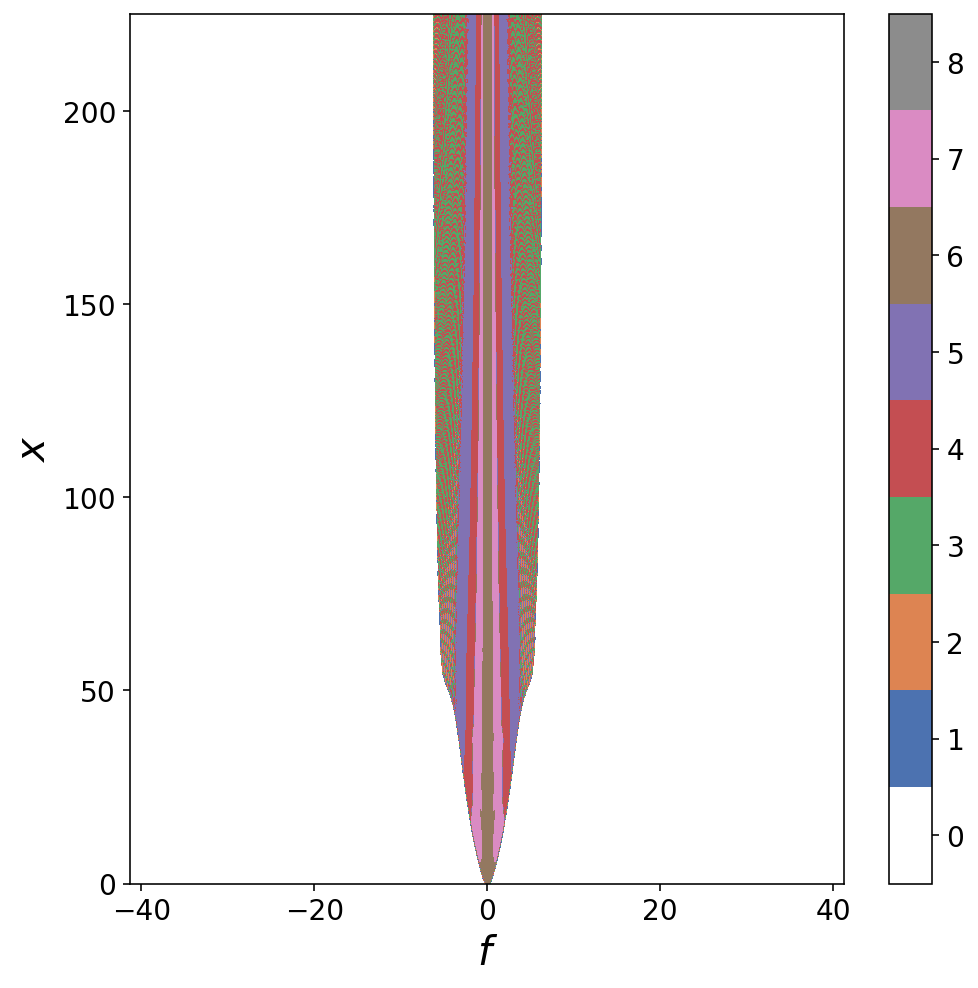

In [59]:
# Optionally, set cluster zero to white
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cm = plt.get_cmap('Set1')
new_cm = cm(np.arange(cm.N))
new_cm[0, :] = [1, 1, 1, 1]
cm_white = ListedColormap(new_cm)

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette('deep').as_hex()
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_cmap = ListedColormap(sns_list)

cm = sns_cmap

# Colormap of clusters
clustermap = np.zeros([len(x)*len(f)])
clustermap[mask.flatten('F')] = cluster_idx+1  # Index into unmasked regions
clustermap = np.reshape(clustermap, [len(x), len(f)], order='F')

plt.figure(figsize=(8, 8))
plt.imshow(clustermap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(f), max(f), min(x), max(x)], aspect='auto'); 

plt.xlabel('$f$')
plt.ylabel('$x$')
plt.colorbar(boundaries=np.arange(-0.5, nc+1.5), ticks=np.arange(0, nc+1))
plt.show()

## III Hypothesis seletion procedure 

### 1. Building the full feature matrix

In [60]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = Ux
featuremap[:, :, -2] = Utt
featuremap[:, :, -1] = UUU

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))

(1000, 4096, 6)


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


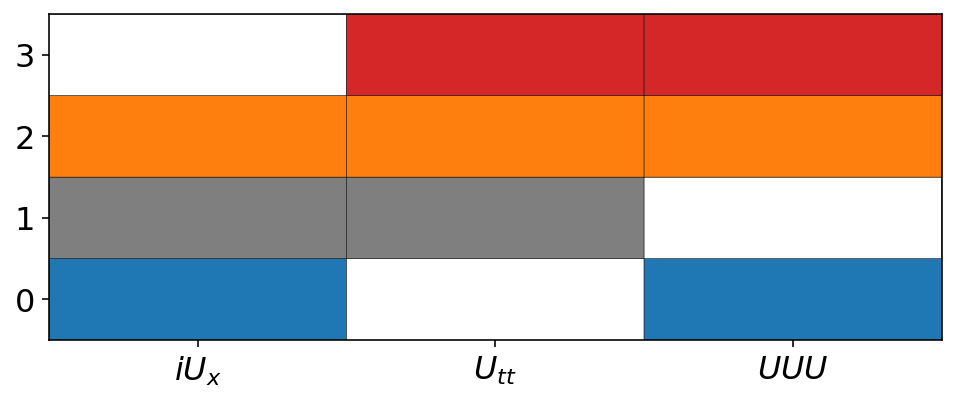

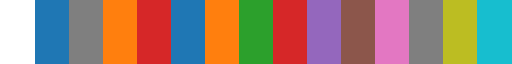

In [61]:
import matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#1f77b4')  # Insert white at zero position
sns_list.insert(2, '#7f7f7f')  # Insert white at zero position
sns_list.insert(3, '#ff7f0e')  # Insert white at zero position
sns_list.insert(4, '#d62728')  # Insert white at zero position

sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,0,1],[1,1,0],[1,1,1],[0,1,1]])
nmodels = 4
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

idx_empty = 0
idx_empty = 1
idx_empty = 2
idx_empty = 3
idx_empty = 4
idx_empty = 5
idx_empty = 6
idx_empty = 7
idx_empty = 8
idx_empty = 9
idx_empty = 10
idx_empty = 11
idx_empty = 12
idx_empty = 13
idx_empty = 14
idx_empty = 15
idx_empty = 16
idx_empty = 17
idx_empty = 18
idx_empty = 19
idx_empty = 20
idx_empty = 21
idx_empty = 22
idx_empty = 23
idx_empty = 24
idx_empty = 25
idx_empty = 26
idx_empty = 27
idx_empty = 28
idx_empty = 29
idx_empty = 30
idx_empty = 31
idx_empty = 32
idx_empty = 33
idx_empty = 34
idx_empty = 35
idx_empty = 36
idx_empty = 37
idx_empty = 38
idx_empty = 39
idx_empty = 40
idx_empty = 41
idx_empty = 42
idx_empty = 43
idx_empty = 44
idx_empty = 45
idx_empty = 46
idx_empty = 47
idx_empty = 48
idx_empty = 49
idx_empty = 50
idx_empty = 51
idx_empty = 52
idx_empty = 53
idx_empty = 54
idx_empty = 55
idx_empty = 56
idx_empty = 57
idx_empty = 58
idx_empty = 59
idx_empty = 60
idx_empty = 61
idx_empty = 62
idx_empty = 63
idx_empty = 64
idx_empty = 65
idx_empty = 66
idx_e

idx_empty = 148
idx_empty = 149
idx_empty = 150
idx_empty = 151
idx_empty = 152
idx_empty = 153
idx_empty = 154
idx_empty = 155
idx_empty = 156
idx_empty = 157
idx_empty = 158
idx_empty = 159
idx_empty = 160
idx_empty = 161
idx_empty = 162
idx_empty = 163
idx_empty = 164
idx_empty = 165
idx_empty = 166
idx_empty = 167
idx_empty = 168
idx_empty = 169
idx_empty = 170
idx_empty = 171
idx_empty = 172
idx_empty = 173
idx_empty = 174
idx_empty = 175
idx_empty = 176
idx_empty = 177
idx_empty = 178
idx_empty = 179
idx_empty = 180
idx_empty = 181
idx_empty = 182
idx_empty = 183
idx_empty = 184
idx_empty = 185
idx_empty = 186
idx_empty = 187
idx_empty = 188
idx_empty = 189
idx_empty = 190
idx_empty = 191
idx_empty = 192
idx_empty = 193
idx_empty = 194
idx_empty = 195
idx_empty = 196
idx_empty = 197
idx_empty = 198
idx_empty = 199
idx_empty = 200
idx_empty = 201
idx_empty = 202
total score for NLSE DB= 0.4650941748181229
total score for DISP DB= 0.8577784701232593
total score for NONL DB= 0.0
tot

total score for NLSE DB= 0.46551959526585146
total score for DISP DB= 0.8569455720318815
total score for NONL DB= 0.0
total score for LAST DB= 0.0
Best possble score (pointwise)= 0.8687015735095026
total score for the selected DB= 0.8098516691456406


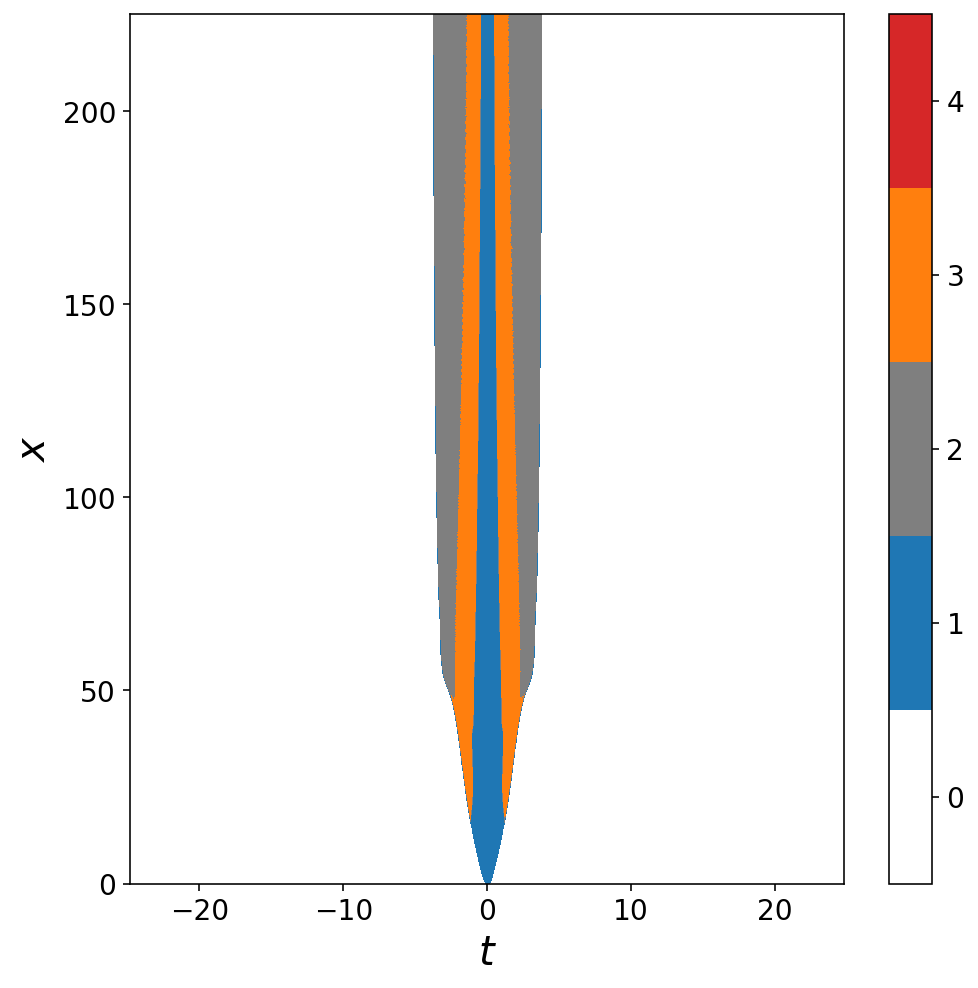

OBTAINED SCORE = 0.8098516691456406
MAXIMUM POSSIBLE SCORE = 0.8152701657032594


In [62]:
S = 5
balancemap = np.empty_like(clustermap)
M_BEST_POITWISE = []
M_SEL = []

for cluster_ind in range(1, nc+1, 1):
#     print(cluster_ind)
    CLUSTERMAP = clustermap * 0
    for i in range(len(f)):
        for j in range(len(x)):
            if clustermap[j,i] == cluster_ind:
                CLUSTERMAP[j,i] = cluster_ind
            else:
                CLUSTERMAP[j,i] = 0

#     # CLUSTERMAP = clustermap
#     plt.figure(figsize=(8, 8))
#     plt.imshow(CLUSTERMAP, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
#               extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
#     plt.xlabel('$t$')
#     plt.ylabel('$x$')
#     plt.show()

    MAP2D = []
    MGN2D = []

    M_NLSE = []
    M_DISP = []
    M_NONL = []
    M_LAST = []

    #Check the first cluster
    for ind in range(0, 1000, 1): #SCAN THROUGH ALL X
#         print(ind)
#         display.clear_output(wait = True)
    #     time.sleep(0)
    #     print(ind)
        MAP1D = []
        MGN = []
        map1d = np.zeros(len(t))
        mgn1d = np.zeros(len(t))



        MGN1 = []
        SIGMA1 = []
        GN1 = []

        MGN2 = []
        SIGMA2 = []
        GN2 = []

        MGN3 = []
        SIGMA3 = []
        GN3 = []

        MGN4 = []
        SIGMA4 = []
        GN4 = []

        cc = np.where(clustermap[ind, :]==cluster_ind)
        if np.shape(cc)[1] == 0:
            print('idx_empty =', ind)

        #Constructing the corresponding matix at given x
        M1 =  np.vstack([np.sqrt(features_full[ind,cc, 0]**2 + features_full[ind,cc, 3]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 1]**2 + features_full[ind,cc, 4]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 2]**2 + features_full[ind,cc, 5]**2).flatten()])
        #Normalise the data
    #     minval = np.min(M1[np.nonzero(M1)])
    #     M = M1 / minval
        M = M1 / M1.min(axis=0)
        l = np.shape(M)[1]

        #How well a point corresponds to a particular dynamics?
        for i in range(l):
            #FULL
            gn = 1
            sigma = np.log10(max(M[:,i])) - np.log10(min(M[:,i]))
            mgn1 = gn / (1 + sigma)
            MGN1 = np.append(MGN1, mgn1)
            SIGMA1 = np.append(SIGMA1, sigma)
            GN1 = np.append(GN1, gn)

            #DISP
            if min(M[0:2:1,i]) - M[2,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:2:1,i])-M[2,i])/np.log10(min(M[0:2:1,i])+M[2,i])
    #             gn = math.log(min(M1[0:2:1,i])-M1[2,i] , min(M1[0:2:1,i])+M1[2,i])
            sigma = np.log10(max(M[0:2,i]))-np.log10(min(M[0:2,i]))
            sigma = np.log10(max(M1[0:2,i]))-np.log10(min(M1[0:2,i]))
            mgn2 = gn / (1 + sigma)
            MGN2 =  np.append(MGN2, mgn2)
            SIGMA2 = np.append(SIGMA2, sigma)
            GN2 = np.append(GN2, gn)

            #NONL
            if min(M[0:3:2,i]) - M[1,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:3:2,i]) - M[1,i]) / np.log10(min(M[0:3:2,i]) + M[1,i])
            sigma = np.log10(max(M[0:3:2,i])) - np.log10(min(M[0:3:2,i]))
            mgn3 = gn / (1 + sigma)
            MGN3 =  np.append(MGN3, mgn3)
            SIGMA3 = np.append(SIGMA3, sigma)
            GN3 = np.append(GN3, gn)

            #LAST
            if min(M[1:3:1,i]) - M[0,i] < 1:
                gn = 0
            else:
                 gn = np.log10(min(M[1:3:1,i]) - M[0,i]) / np.log10(min(M[1:3:1,i]) + M[0,i])
            sigma = np.log10(max(M[1:3:1,i])) - np.log10(min(M[1:3:1,i]))
            mgn4 = gn / (1 + sigma)
            MGN4 =  np.append(MGN4, mgn4)
            SIGMA4 = np.append(SIGMA4, sigma)
            GN4 = np.append(GN4, gn)

            if mgn1 > mgn2 and mgn1 > mgn3 and mgn1 > mgn4:
                MAP1D = np.append(MAP1D, 3)
                MGN = np.append(MGN, mgn1)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn1)

            if mgn2 > mgn1 and mgn2 > mgn3 and mgn2 > mgn4:
                MAP1D = np.append(MAP1D, 2)
                MGN = np.append(MGN, mgn2)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn2)

            if mgn3 > mgn1 and mgn3 > mgn2 and mgn3 > mgn4:
                MAP1D = np.append(MAP1D, 1)
                MGN = np.append(MGN, mgn3)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn3)

            if mgn4 > mgn1 and mgn4 > mgn2 and mgn4 > mgn3:
                MAP1D = np.append(MAP1D, 4)
                MGN = np.append(MGN, mgn4)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn4)

        M_NLSE = np.append(M_NLSE, MGN1)
        M_DISP = np.append(M_DISP, MGN2)
        M_NONL = np.append(M_NONL, MGN3)
        M_LAST = np.append(M_LAST, MGN4)
        
        map1d[cc] = MAP1D
        mgn1d[cc] = MGN
        MAP2D = np.append(MAP2D, map1d)
        MGN2D = np.append(MGN2D, mgn1d)
        
        


#         plt.figure(figsize=(12, 12));
#         plt.subplot(3,1,3)
#         plt.plot(t[cc], np.abs(u[ind, cc].flatten())**2, color = 'black', linestyle = ':')
#         scatter = plt.scatter(t[cc], np.abs(u[ind, cc])**2, c = MAP1D, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
#         plt.grid('True')
#         plt.ylabel('$|\u03C8|^{2}$')
#         plt.xlim(-5,20)
#         plt.xlabel('t')
#     #     plt.legend(handles=scatter.legend_elements()[0], labels=classes)

#         plt.subplot(3,1,1)
#         plt.semilogy(t[cc], np.asarray(M[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
#         plt.semilogy(t[cc], np.asarray(M[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
#         plt.semilogy(t[cc], np.asarray(M[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     #     plt.ylim((10**(-4), 1))
#         plt.xlim(-5,20)
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('Abs individual contributions')

#         plt.subplot(3,1,2)
#         plt.plot(t[cc], MGN1, color = 'orange', label = 'NLSE DB')
#         plt.plot(t[cc], MGN2, color = 'gray', label = 'DISP DB')
#         plt.plot(t[cc], MGN3, color = 'blue', label = 'NONL DB')
#         plt.plot(t[cc], MGN4, color = 'red', label = '- DB')
#         plt.plot(t[cc], MGN, color = 'black', linestyle = ':', label = 'BEST DB')
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('M')
#         plt.xlim(-5,20)
#         plt.show()

        
        
    n_total = len(M_NLSE)
    SCORE_NLSE = np.sum(M_NLSE) / n_total
    SCORE_DISP = np.sum(M_DISP) / n_total
    SCORE_NONL = np.sum(M_NONL) / n_total
    SCORE_LAST = np.sum(M_LAST) / n_total
    SCORE_BEST = np.sum(MGN2D[np.nonzero(MGN2D)])/len(MGN2D[np.nonzero(MGN2D)])

    print('total score for NLSE DB=',SCORE_NLSE)
    print('total score for DISP DB=',SCORE_DISP)
    print('total score for NONL DB=',SCORE_NONL)
    print('total score for LAST DB=',SCORE_LAST)
    print('Best possble score (pointwise)=',SCORE_BEST)

    if SCORE_NLSE >= SCORE_DISP and SCORE_NLSE >= SCORE_NONL and SCORE_NLSE >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NLSE)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 3

    if SCORE_DISP > SCORE_NLSE and SCORE_DISP >= SCORE_NONL and SCORE_DISP >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_DISP)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 2

    if SCORE_NONL > SCORE_NLSE and SCORE_NONL > SCORE_DISP and SCORE_NONL >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NONL)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 1

    if SCORE_LAST > SCORE_NLSE and SCORE_LAST > SCORE_DISP and SCORE_LAST > SCORE_NONL:
        M_SEL = np.append(M_SEL, M_LAST)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 4

    print('total score for the selected DB=', np.sum(M_SEL) / len(M_SEL))
    
plt.figure(figsize=(8, 8))
plt.imshow(balancemap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
plt.xlabel('$t$')
plt.ylabel('$x$')
plt.colorbar(boundaries=np.arange(-0.5, 5.5), ticks=np.arange(0, 5))
plt.show()

print('OBTAINED SCORE =', np.sum(M_SEL) / len(M_SEL))
print('MAXIMUM POSSIBLE SCORE =', np.sum(M_BEST_POITWISE) / len(M_BEST_POITWISE))

In [63]:
Sbalancemap = balancemap

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10
c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log10


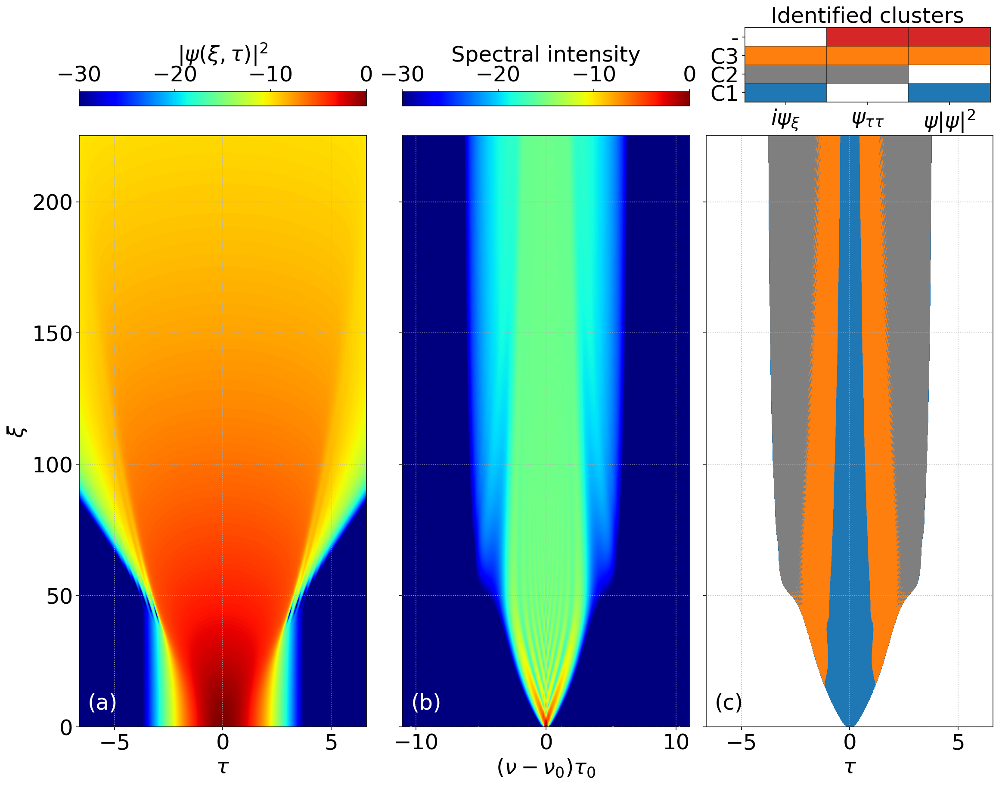

In [64]:
# s = data['Ip_TF']
edge = 1500

fs = 25
mpl.rc('font', family='sans serif')


def identify_axes(ax_dict, fontsize=60):
    """
    Helper to identify the Axes in the examples below.

    Draws the label in a large font in the center of the Axes.

    Parameters
    ----------
    ax_dict : dict[str, Axes]
        Mapping between the title / label and the Axes.
    fontsize : int, optional
        How big the label should be.
    """
    kw = dict(ha="center", va="center", fontsize=fontsize, color="darkgrey")
    for k, ax in ax_dict.items():
        ax.text(0.5, 0.5, k, transform=ax.transAxes, **kw)


from mpl_toolkits.axes_grid.inset_locator import inset_axes
import matplotlib.patches as patches

    

outer = [['long left', 'long center', 'long right'],
         ['long left', 'long center', 'long right']]

fig, axd = plt.subplot_mosaic(outer, layout="constrained")
# for k in axd:
#     annotate_axes(axd[k], f'axd["{k}"]')
fig.tight_layout
fig.set_figheight(12)
fig.set_figwidth(16)
# identify_axes(axd)
# fig.suptitle('(c) Spontaneous modulation instability', fontsize = fs)

it = lambda field: 10*np.log10(abs(field)**2) 
# it = lambda field: abs(field)**2

lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
# im1 = axd['long left'].imshow(lIT[:,5:len(t)-4], cmap=colc, origin='lower', vmin=0, vmax=mlIT,
#           extent=[min(t[5:len(t)-4]), max(t[5:len(t)-4]), min(x), max(x)], aspect='auto'); 
im1 = axd['long left'].imshow(lIT[:,edge:len(t)-edge], cmap=colc, origin='lower', vmin=mlIT - TRS, vmax=mlIT,
          extent=[min(t[edge:len(t)-edge]), max(t[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
# axd['long left'].set_ylabel('Distance')
axd['long left'].set_ylabel('$\u03BE$', fontsize=fs)
axd['long left'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long left'].tick_params(axis = 'both', labelsize=fs)
# axd['long left'].set_xticks([-15,-10,-5,0,5,10,15])


# ax1.set_xticks([], [])
# axd['long left'].tick_params(labelbottom = False)
axd['long left'].grid('True', linestyle = ':')
cb = fig.colorbar(im1, ax = axd['long left'], location = 'top')
cb.ax.tick_params(labelsize=fs)
cb.set_label(label = '$|\u03C8(\u03BE,\u03C4)|^2$', size=fs)
# cb.set_ticks([0,0.5,1])


it1 = lambda field: 10*np.log10(abs(field)**2) 
lIT = it1(s); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
#plt.pcolor(t, x, lIT, cmap='viridis');          # plot as pseudocolor map
# im3 = axd['long center'].imshow(s[:, 980:1068], cmap=colc, origin='lower', vmin=0, vmax=1,
#           extent=[min(f[1000:1048]), max(f[1000:1048]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
im3 = axd['long center'].imshow(lIT[:, edge:len(t)-edge], cmap=colc, origin='lower', vmin=mlIT - 30, vmax=mlIT,
          extent=[min(f[edge:len(t)-edge]), max(f[edge:len(t)-edge]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
# axd['long right'].set_xlim(frange);
axd['long center'].grid('True', linestyle = ':')
axd['long center'].tick_params(labelleft= False)
axd['long center'].set_xlabel('$(\u03BD - \u03BD_{0})\u03C4_{0}$', fontsize=fs)
axd['long center'].tick_params(labelleft= False)
axd['long center'].tick_params(axis = 'both', labelsize=fs)
# axd['long center'].set_xticks([-10,-5,0,5,10])
cb = fig.colorbar(im3, ax = axd['long center'], location = 'top')
cb.ax.tick_params(labelsize=fs)
# cb.set_ticks([0,0.5,1])
cb.set_label(label = 'Spectral intensity', size=fs)


im2 = axd['long right'].imshow(Sbalancemap[:, edge:len(t)-edge], cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t[edge:len(t)-edge]), max(t[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
axd['long right'].grid('True', linestyle = ':')
# axd['long right'].set_xlim(trange)
axd['long right'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long right'].tick_params(labelleft= False)
rect = patches.Rectangle((-13, 60), 26, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
rect1 = patches.Rectangle((-6.75, 75.5), 4, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
# axd['long center'].add_patch(rect)
# axd['long center'].add_patch(rect1)
# axd['long center'].text(-2.2, 75.8, 'PS', fontsize = fs)
# axd['long center'].text(11.5, 60.3, 'AB', fontsize = fs)
axd['long right'].tick_params(axis = 'both', labelsize=fs)
# axd['long right'].set_xticks([-15,-10,-5,0,5,10,15])



ax_ins = inset_axes(axd['long right'], width = '60%', height = 1.2, loc='upper left',
                   bbox_to_anchor=(0.12,1.14,1.425,0.05), bbox_transform=axd['long right'].transAxes)
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k'); 
plt.title('Identified clusters', fontsize=fs)
plt.xticks([0.5, 1.5, 2.5], ['$i \u03C8_{\u03BE}$','$\u03C8_{\u03C4 \u03C4}$', '$\u03C8|\u03C8|^2$'], fontsize=fs)
plt.yticks([0.5,1.5, 2.5, 3.5], ['C1','C2','C3','-'], fontsize=fs)

axd['long left'].text(0.03, 0.03, '(a)', transform=axd['long left'].transAxes, size=fs, color = 'white')
axd['long center'].text(0.03, 0.03, '(b)', transform=axd['long center'].transAxes, size=fs, color = 'white')
axd['long right'].text(0.03, 0.03, '(c)', transform=axd['long right'].transAxes, size=fs, color = 'black')


# plt.gca().set_xticks(np.arange(0, 1300, 400))
# plt.savefig('Modulation_Instability.png')
plt.savefig('OWB.png', dpi = 300)
plt.savefig('OWB.pdf', transparent = 'True')
plt.show()

## Pointwise hypothesis selection procedure in frequency domain

### 1. Building the full feature matrix

In [65]:
## Pointwise hypothesis selection procedure in frequency domain# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = Ux
featuremap[:, :, -2] = Utt### 1. Building the full feature matrix
# featuremap[:, :, -2] = uttt
featuremap[:, :, -1] = UUU

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))
labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

(1000, 4096, 6)


### 2. Constructing the candidate dominant balance models

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


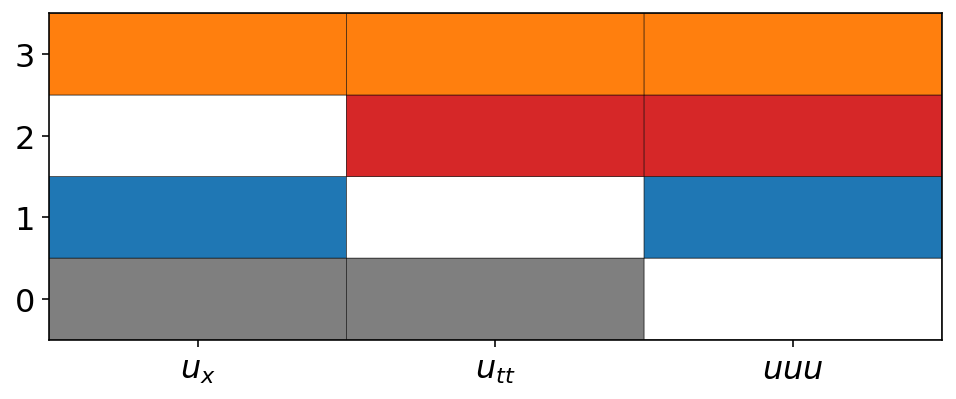

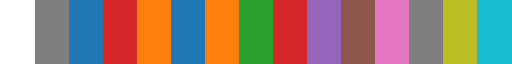

In [66]:
import matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#7f7f7f')  # Insert white at zero position
sns_list.insert(2, '#1f77b4')  # Insert white at zero position
sns_list.insert(3, '#d62728')  # Insert white at zero position
sns_list.insert(4, '#ff7f0e')  # Insert white at zero position
'#### 2. Constructing the candidate dominant balance models1f77b4'
sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,1,0],[1,0,1],[0,1,1],[1,1,1]])

nmodels = 4
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

### 3. Find the best suitable Dominant Balance at each point of the map

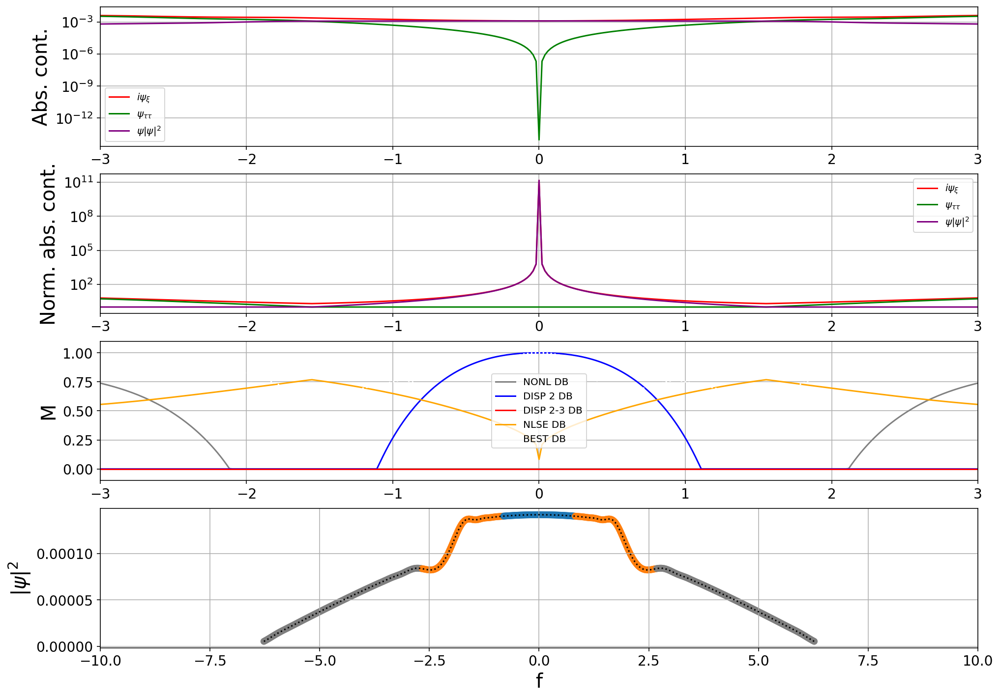

In [67]:
### 3. Find the best suitable Dominant Balance at each point of the mapfrom IPython import display
import time
import math 

S = 5
trs = max(np.abs(U.flatten())**2) / 10**3 #set up the field threshold value
num_models = len(balance_models) #number of considred dominant balance models
MAP2D = [] #allocating the array for balance_map
MGN2D = [] #allocating the array for M score for each point on the balance_map

for ind in range(0, 1000, 1): #SCAN THROUGH ALL z
    display.clear_output(wait = True)
#     print(ind)

    MAP1D = [] #1d balance_map for the best possible mgn at fixed z
    MGN = [] #array for the best possible mgn at fixed z
    map1d = np.zeros(len(t)) #zero 1d arrays over t to add te non-zero balance_map values
    mgn1d = np.zeros(len(t)) #zero 1d arrays over t to add te non-zero mgn values
    #These arrays serve to store mgn values for all the considered dominant balances:
    MGN1, MGN2, MGN3, MGN4 = [],[],[],[]

    cc = np.where(np.abs(U[ind])**2 > trs) #Find the indices of the spatio-teporal map where the field is above the trs
    
    #Constructing the corresponding matix at given z for the terms in the region where the field > trs:
    M1 =  np.vstack([np.sqrt(features_full[ind,cc, 0]**2 + features_full[ind,cc, 3]**2).flatten(), 
                     np.sqrt(features_full[ind,cc, 1]**2 + features_full[ind,cc, 4]**2).flatten(), 
                     np.sqrt(features_full[ind,cc, 2]**2 + features_full[ind,cc, 5]**2).flatten()])
    M = M1 / M1.min(axis=0) #Normalise the data
    l = np.shape(M)[1] #Length of the 1d array in t at fixed z where the field > trs
        
    #How well a point corresponds to a particular dominant balance?
    for i in range(l):
        MGN_dict = {}
        for model_index in range(num_models-1):
            slc = M[:, i] * balance_models[model_index]
            trc = M[:, i] * (1 - balance_models[model_index])
            maxS = np.max(slc[np.nonzero(slc)])
            minS = np.min(slc[np.nonzero(slc)])
            maxT = np.max(trc[np.nonzero(trc)])

            if minS - maxT < 1:
                gn = 0
            else:
                gn = np.log10(minS - maxT) / np.log10(minS + maxT)
            sigma = np.log10(maxS) - np.log10(minS)
            mgn = gn / (1 + sigma)

            MGN_dict[f'MGN{model_index + 1}'] = np.append(MGN_dict.get(f'MGN{model_index + 1}', []), mgn)
            
        #The full dynamical cluster is computed separately
        gn = 1
        sigma = np.log10(max(M[:,i])) - np.log10(min(M[:,i]))
        mgn4 = gn / (1 + sigma)
        MGN4 = np.append(MGN4, mgn4)

        # Add the following lines to create separate variables for each mgn
        mgn_array = np.append(np.array([float(value) for value in MGN_dict.values()]), mgn4)
        #Add mgn values to the arrays MGN
        MGN1 =  np.append(MGN1, mgn_array[0])
        MGN2 =  np.append(MGN2, mgn_array[1])
        MGN3 =  np.append(MGN3, mgn_array[2])
#         MGN4 =  np.append(MGN4, mgn_array[3])
#         MGN5 =  np.append(MGN5, mgn_array[4])
#         MGN6 =  np.append(MGN6, mgn_array[5])  
        
        #FINDING THE INDEX OF THE HIGHEST mgn in a list and add this to the MGN - the best possible db
        max_index = np.argmax(mgn_array) + 1  # Adding 1 to match index starting from 1
        MAP1D = np.append(MAP1D, max_index)
        MGN = np.append(MGN, mgn_array[max_index - 1])  # Subtracting 1 to get the correct index in the array
        
        
####################### DISPLAY #######################     
            
        
    plt.figure(figsize=(16, 12));
    plt.subplot(4,1,4)
    plt.plot(f[cc], np.abs(U[ind, cc].flatten())**2, color = 'black', linestyle = ':')
    scatter = plt.scatter(f[cc], np.abs(U[ind, cc])**2, c = MAP1D, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
    plt.grid('True')
    plt.ylabel('$|\u03C8|^{2}$')
    plt.xlim(-10,10)
    plt.xlabel('f')
    
    plt.subplot(4,1,1)
    plt.semilogy(f[cc], np.asarray(M1[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
    plt.semilogy(f[cc], np.asarray(M1[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
    plt.semilogy(f[cc], np.asarray(M1[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     plt.ylim((10**(-4), 1))
    plt.xlim(-3,3)
    plt.legend()
    plt.grid('True')
    plt.ylabel('Abs. cont.')

    plt.subplot(4,1,2)
    plt.semilogy(f[cc], np.asarray(M[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
    plt.semilogy(f[cc], np.asarray(M[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
    plt.semilogy(f[cc], np.asarray(M[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     plt.ylim((10**(-4), 1))
    plt.xlim(-3,3)
    plt.legend()
    plt.grid('True')
    plt.ylabel('Norm. abs. cont.')
    
    plt.subplot(4,1,3)
    plt.plot(f[cc], MGN1, color = 'gray', label = 'NONL DB')
    plt.plot(f[cc], MGN2, color = 'blue', label = 'DISP 2 DB')
    plt.plot(f[cc], MGN3, color = 'red', label = 'DISP 2-3 DB')
    plt.plot(f[cc], MGN4, color = 'orange', label = 'NLSE DB')
#     plt.plot(t[cc], MGN5, color = 'aqua', label = 'nonsense#1')
#     plt.plot(t[cc], MGN6, color = 'brown', label = 'nonsense#2')
#     plt.plot(t[cc], MGN7, color = 'red', label = 'FULL DB')
#     plt.plot(t[cc], MGN8, color = 'purple', label = 'nonsense#3')
#     plt.plot(t[cc], MGN9, color = 'black', label = 'nonsense#4')
#     plt.plot(t[cc], MGN10, color = 'black', label = 'nonsense#5')
#     plt.plot(t[cc], MGN11, color = 'black', label = 'nonsense#4')
    plt.plot(t[cc], MGN, color = 'white', linestyle = ':', label = 'BEST DB')
    plt.legend()
    plt.grid('True')
    plt.ylabel('M')
    plt.xlim(-3,3)
    plt.ylim(-0.1,1.1)
    plt.show()
    
    map1d[cc] = MAP1D
    mgn1d[cc] = MGN
    MAP2D = np.append(MAP2D, map1d)
    MGN2D = np.append(MGN2D, mgn1d)

### 4. Displaying the obtained map

0.8152701659662825


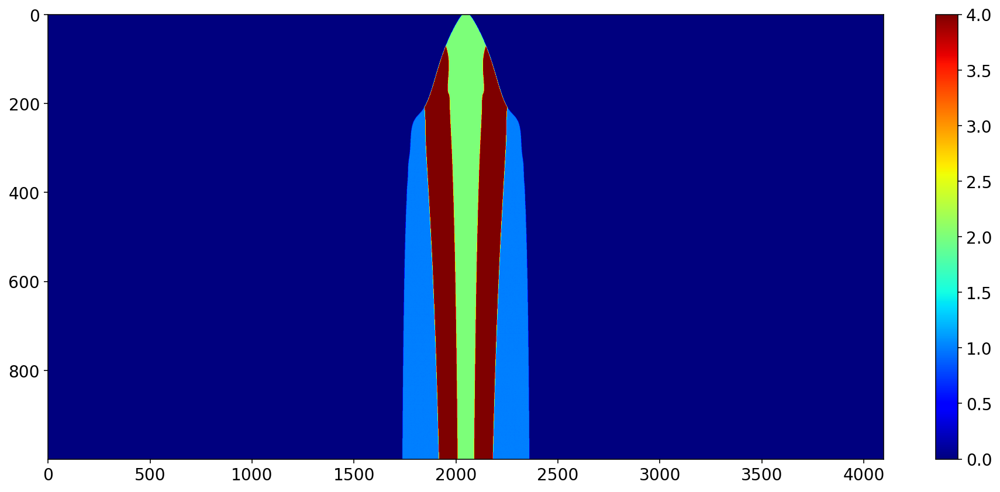

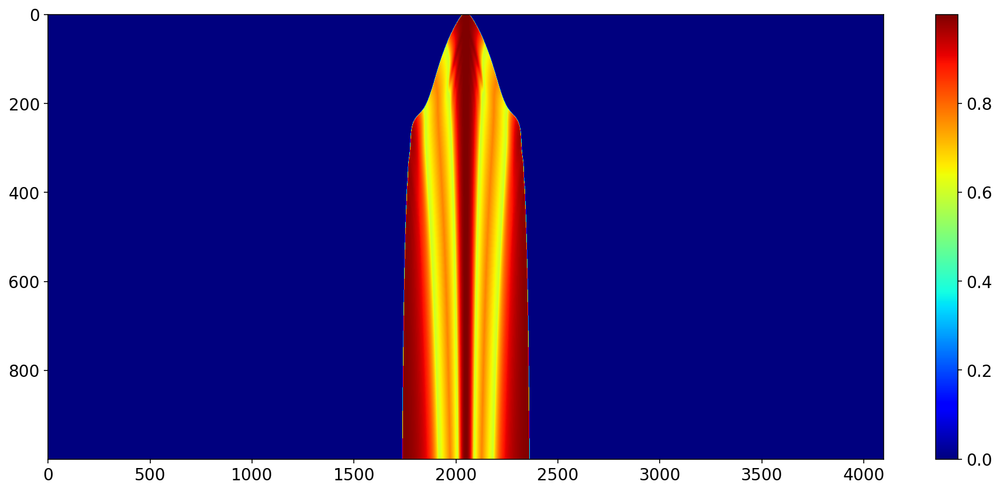

In [68]:
### 4. Displaying the obtained map#Computing the total score
print(np.sum(MGN2D[np.nonzero(MGN2D)])/len(MGN2D[np.nonzero(MGN2D)]))
# print(len(MGN2D))
MGN3D = np.reshape(MGN2D, (1000, 2048 * 2))
MAP3D = np.reshape(MAP2D, (1000, 2048 * 2))


plt.figure(figsize=(16, 7));
plt.imshow(MAP3D, cmap = 'jet', aspect = 'auto')
plt.colorbar()
plt.show()

plt.figure(figsize=(16, 7));
plt.imshow(MGN3D, cmap = 'jet', aspect = 'auto')
plt.colorbar()
plt.show()

In [69]:
balancemap1 = MAP3D

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: divide by zero encountered in log10
c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: divide by zero encountered in log10


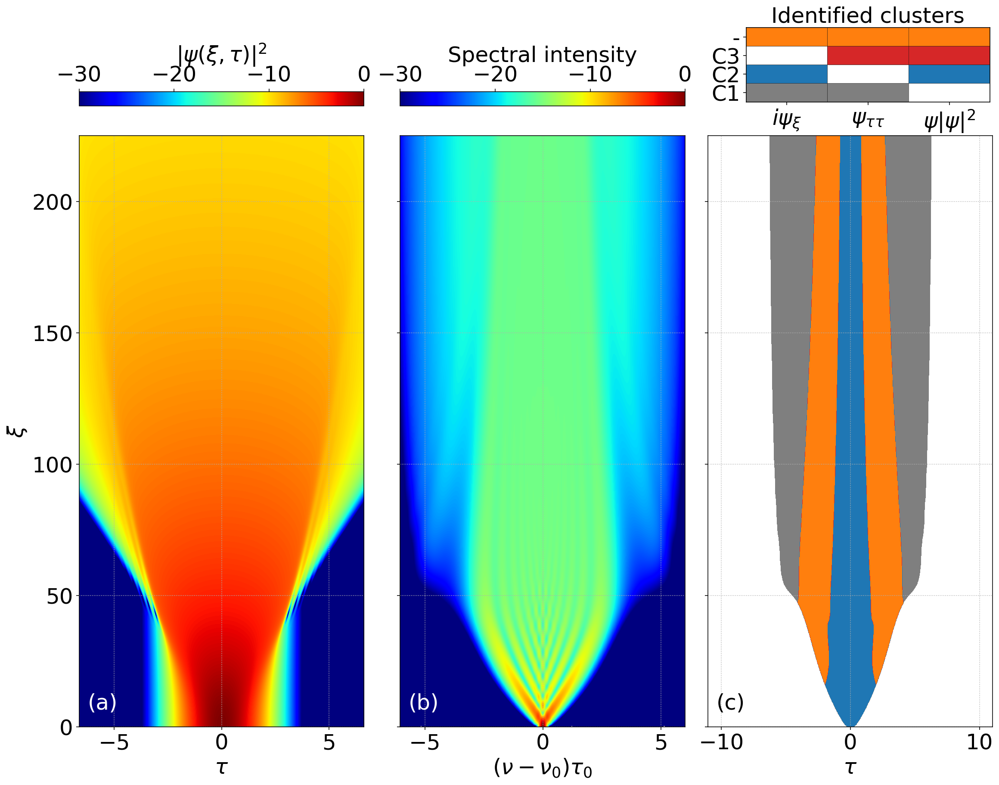

In [70]:
edge = 1500

fs = 25
mpl.rc('font', family='sans serif')


def identify_axes(ax_dict, fontsize=60):
    """
    Helper to identify the Axes in the examples below.

    Draws the label in a large font in the center of the Axes.

    Parameters
    ----------
    ax_dict : dict[str, Axes]
        Mapping between the title / label and the Axes.
    fontsize : int, optional
        How big the label should be.
    """
    kw = dict(ha="center", va="center", fontsize=fontsize, color="darkgrey")
    for k, ax in ax_dict.items():
        ax.text(0.5, 0.5, k, transform=ax.transAxes, **kw)


from mpl_toolkits.axes_grid.inset_locator import inset_axes
import matplotlib.patches as patches

    

outer = [['long left', 'long center', 'long right'],
         ['long left', 'long center', 'long right']]

fig, axd = plt.subplot_mosaic(outer, layout="constrained")
# for k in axd:
#     annotate_axes(axd[k], f'axd["{k}"]')
fig.tight_layout
fig.set_figheight(12)
fig.set_figwidth(16)
# identify_axes(axd)
# fig.suptitle('(c) Spontaneous modulation instability', fontsize = fs)

it = lambda field: 10*np.log10(abs(field)**2) 
# it = lambda field: abs(field)**2

lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
# im1 = axd['long left'].imshow(lIT[:,5:len(t)-4], cmap=colc, origin='lower', vmin=0, vmax=mlIT,
#           extent=[min(t[5:len(t)-4]), max(t[5:len(t)-4]), min(x), max(x)], aspect='auto'); 
im1 = axd['long left'].imshow(lIT[:,edge:len(t)-edge], cmap=colc, origin='lower', vmin=mlIT - TRS, vmax=mlIT,
          extent=[min(t[edge:len(t)-edge]), max(t[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
# axd['long left'].set_ylabel('Distance')
axd['long left'].set_ylabel('$\u03BE$', fontsize=fs)
axd['long left'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long left'].tick_params(axis = 'both', labelsize=fs)
# axd['long left'].set_xticks([-15,-10,-5,0,5,10,15])


# ax1.set_xticks([], [])
# axd['long left'].tick_params(labelbottom = False)
axd['long left'].grid('True', linestyle = ':')
cb = fig.colorbar(im1, ax = axd['long left'], location = 'top')
cb.ax.tick_params(labelsize=fs)
cb.set_label(label = '$|\u03C8(\u03BE,\u03C4)|^2$', size=fs)
# cb.set_ticks([0,0.5,1])


it1 = lambda field: 10*np.log10(abs(field)**2) 
lIT = it1(s); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
#plt.pcolor(t, x, lIT, cmap='viridis');          # plot as pseudocolor map
# im3 = axd['long center'].imshow(s[:, 980:1068], cmap=colc, origin='lower', vmin=0, vmax=1,
#           extent=[min(f[1000:1048]), max(f[1000:1048]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
im3 = axd['long center'].imshow(lIT[:, 1748:2348], cmap=colc, origin='lower', vmin=mlIT - 30, vmax=mlIT,
          extent=[min(f[1748:2348]), max(f[1748:2348]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
# axd['long right'].set_xlim(frange);
axd['long center'].grid('True', linestyle = ':')
axd['long center'].tick_params(labelleft= False)
axd['long center'].set_xlabel('$(\u03BD - \u03BD_{0})\u03C4_{0}$', fontsize=fs)
axd['long center'].tick_params(labelleft= False)
axd['long center'].tick_params(axis = 'both', labelsize=fs)
# axd['long center'].set_xticks([-10,-5,0,5,10])
cb = fig.colorbar(im3, ax = axd['long center'], location = 'top')
cb.ax.tick_params(labelsize=fs)
# cb.set_ticks([0,0.5,1])
cb.set_label(label = 'Spectral intensity', size=fs)


im2 = axd['long right'].imshow(balancemap1[:,edge:len(t)-edge], cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(f[edge:len(t)-edge]), max(f[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
axd['long right'].grid('True', linestyle = ':')
# axd['long right'].set_xlim(trange)
axd['long right'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long right'].tick_params(labelleft= False)
rect = patches.Rectangle((-13, 60), 26, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
rect1 = patches.Rectangle((-6.75, 75.5), 4, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
# axd['long center'].add_patch(rect)
# axd['long center'].add_patch(rect1)
# axd['long center'].text(-2.2, 75.8, 'PS', fontsize = fs)
# axd['long center'].text(11.5, 60.3, 'AB', fontsize = fs)
axd['long right'].tick_params(axis = 'both', labelsize=fs)
# axd['long right'].set_xticks([-15,-10,-5,0,5,10,15])



ax_ins = inset_axes(axd['long right'], width = '60%', height = 1.2, loc='upper left',
                   bbox_to_anchor=(0.12,1.14,1.425,0.05), bbox_transform=axd['long right'].transAxes)
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k'); 
plt.title('Identified clusters', fontsize=fs)
plt.xticks([0.5, 1.5, 2.5], ['$i \u03C8_{\u03BE}$','$\u03C8_{\u03C4 \u03C4}$', '$\u03C8|\u03C8|^2$'], fontsize=fs)
plt.yticks([0.5,1.5, 2.5, 3.5], ['C1','C2','C3','-'], fontsize=fs)

axd['long left'].text(0.03, 0.03, '(a)', transform=axd['long left'].transAxes, size=fs, color = 'white')
axd['long center'].text(0.03, 0.03, '(b)', transform=axd['long center'].transAxes, size=fs, color = 'white')
axd['long right'].text(0.03, 0.03, '(c)', transform=axd['long right'].transAxes, size=fs, color = 'black')


# plt.gca().set_xticks(np.arange(0, 1300, 400))
# plt.savefig('Modulation_Instability.png')
plt.savefig('OWB.png', dpi = 300)
plt.savefig('OWB.pdf', transparent = 'True')
plt.show()

### 5. Displaying the equation space clusters (if needed)

In [71]:
balance_idx = balancemap1.flatten()

In [72]:
np.unique(balance_idx)

array([0., 1., 2., 4.])

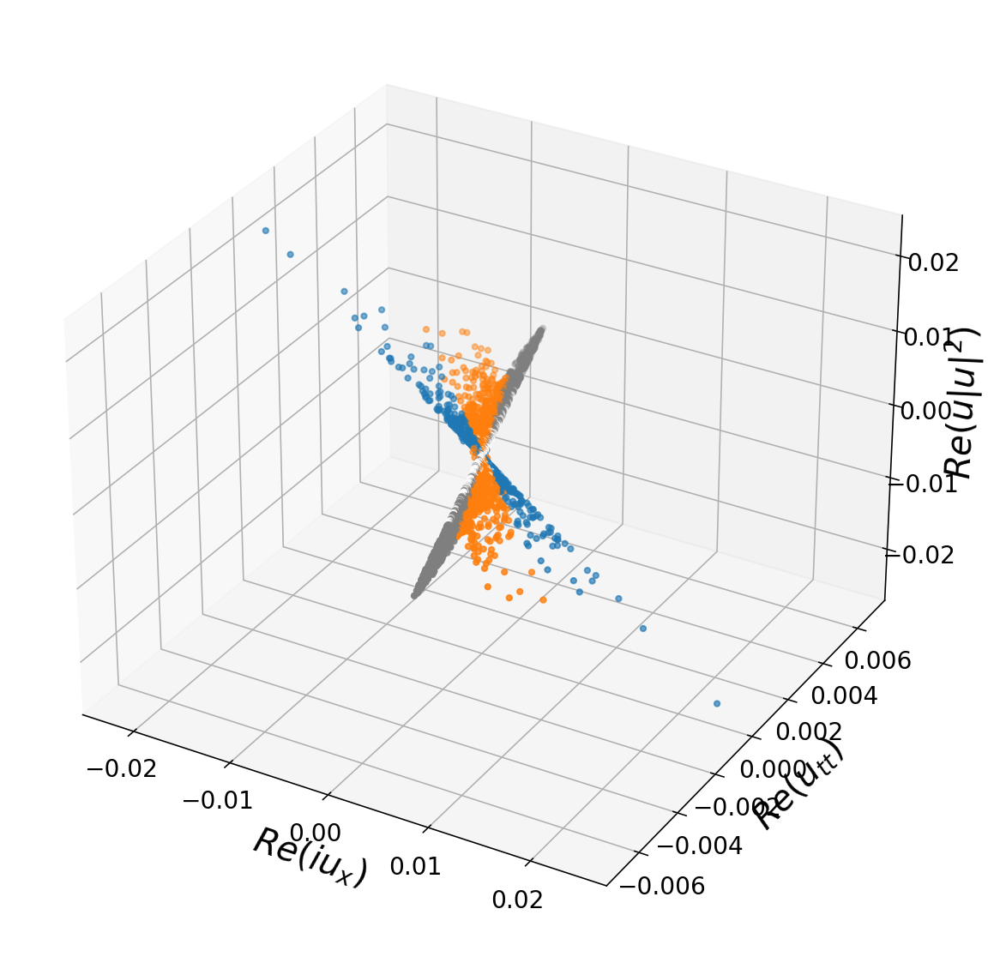

In [73]:
# %matplotlib notebook
# from mpl_toolkits.mplot3d import axes3d

import random
k = 250

# mu = np.vstack((np.tile([255, 0, 0], (50, 1)), np.tile([255, 1, 255], (50, 1))))
mu = []
MU = []
for i in range(0, int(len(balance_idx)/k)):
    if balance_idx[k * i]==0:
        mu = np.array([255, 255, 255])
    if balance_idx[k * i]==2:
        mu = np.array([31, 119, 180])
    if balance_idx[k * i]==1:
        mu = np.array([127, 127, 127])
    if balance_idx[k * i]==4:
        mu = np.array([255, 127, 14])
    MU = np.append(MU,mu)
MU = np.reshape(MU, (int(len(MU)/3) , 3))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features_full[:,:,0].flatten()[::k], features_full[:,:,1].flatten()[::k], features_full[:,:,2].flatten()[::k], c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
plt.show()

# Performing the dominant balance analysis in time domain

### 1. Constructing the feature matrix 

In [363]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt# Performing the dominant balance analysis in time domain### 1. Constructing the feature matrix 
featuremap[:, :, -1] = uuu

labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

# Downsample for building model
shift_x, shift_t = 1, 1
tmin = 0

x0 = np.arange(0, len(x), shift_x)
t0 = np.arange(tmin, len(t), shift_t)
featuremap = featuremap[x0, :, :]
featuremap = featuremap[:, t0, :]

# Leave out near-zero field values (numerical noise and essentially zero dynamics)
lIT = it(u)
lIT = lIT[x0, :]
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT - TRS

features = np.reshape(featuremap, [len(x0)*len(t0), nfeatures], order='F')
features = features[mask.flatten('F'), :]

# Treat real/imag as separate features
features = np.hstack((np.real(features), np.imag(features)))
# features = np.real(features)

print(np.shape(features))

# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10


(1568350, 6)


### 2. Visualising the dynamical patterns in the equation space

<IPython.core.display.Javascript object>


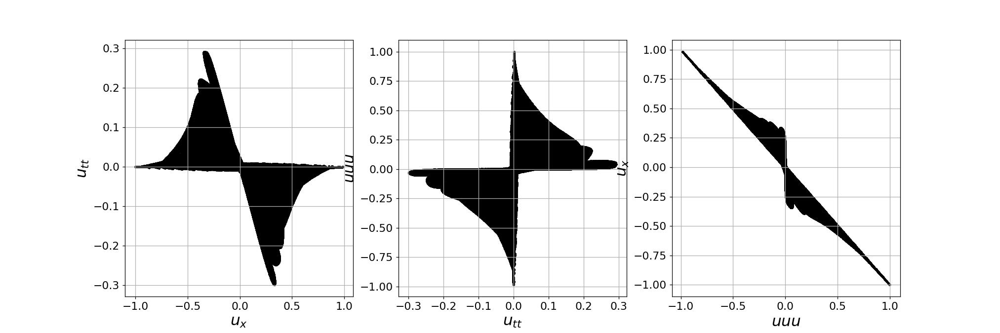

<IPython.core.display.Javascript object>


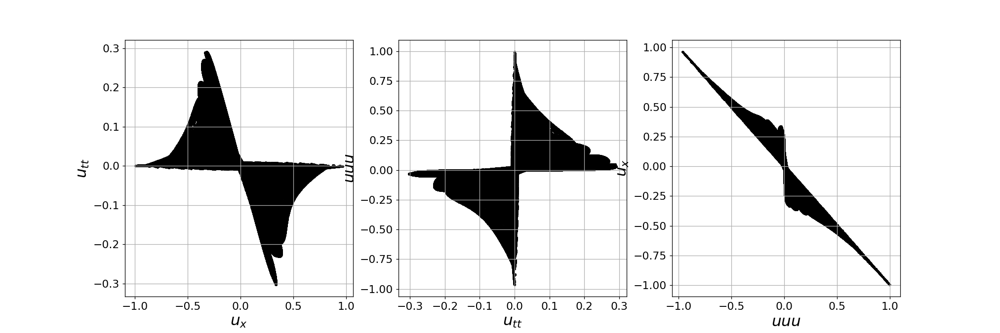

In [364]:
### 2. Visualising the dynamical patterns in the equation spacelabels = ['$iu_x$', '$u_{tt}$', '$u|u|^2}$']

plt.figure(figsize=(18, 6))
plt.subplot(131)
plt.scatter(features[:, 0], features[:,1], 3, 'k')
plt.xlabel(labels[0])
plt.ylabel(labels[1])
plt.grid()

plt.subplot(132)
plt.scatter(features[:, 1], features[:,2], 3, 'k')
plt.xlabel(labels[1])
plt.ylabel(labels[2])
plt.grid()

plt.subplot(133)
plt.scatter(features[:, 2], features[:,0], 3, 'k')
plt.xlabel(labels[2])
plt.ylabel(labels[0])
plt.grid()

plt.show()

plt.figure(figsize=(18, 6))
plt.subplot(131)
plt.scatter(features[:, 3], features[:,4], 3, 'k')
plt.xlabel(labels[0])
plt.ylabel(labels[1])
plt.grid()

plt.subplot(132)
plt.scatter(features[:, 4], features[:,5], 3, 'k')
plt.xlabel(labels[1])
plt.ylabel(labels[2])
plt.grid()

plt.subplot(133)
plt.scatter(features[:, 5], features[:,3], 3, 'k')
plt.xlabel(labels[2])
plt.ylabel(labels[0])
plt.grid()

plt.show()

### 3. GMM clustering

In [365]:
### 3. GMM clusteringfrom sklearn.mixture import GaussianMixture
from sklearn.decomposition import SparsePCA

# Fit to GMM and plot covariance matrices
nc = 3
#nc = 15 - works
seed = np.random.randint(2**20)

#  Keep a random seed for plot reproducibility
# seed = 261912
# random_state=847636 WHEN NC = 5 - NICE REPRESENTATION
# GaussianMixture(n_components=5, random_state=508257)
# GaussianMixture(n_components=10, random_state=777341)
# GaussianMixture(n_components=15, random_state=180373)
# GaussianMixture(n_components=8, random_state=960637)
# GaussianMixture(n_components=6, random_state=987061)
# GaussianMixture(n_components=10, random_state=102230)
# GaussianMixture(n_components=18, random_state=254470) STD
# GaussianMixture(n_components=16, random_state=40838) STD - really good
# GaussianMixture(n_components=16, random_state=105186) Robust scaler

seed = 102230
model = GaussianMixture(n_components=nc, random_state=seed)
model.fit(features)

GaussianMixture(n_components=3, random_state=102230)

### 4. Recomputing for the full domain (if needed) 

In [366]:
### 4. Recomputing for the full domain (if needed) # # Recompute features for full domain

nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt
# featuremap[:, :, -2] = uttt
featuremap[:, :, -1] = uuu

labels = ['$iu_{x}$', '$u_{tt}$', '$uuu$']

tmin = 0

t0 = np.arange(tmin, len(t))
featuremap = featuremap[:, t0, :];

# Mask by nonzero field values
lIT = it(u)
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT-TRS  # Get rid of tiny values in the field

features = np.reshape(featuremap, [len(x)*len(t0), nfeatures], order='F');
features = features[mask.flatten('F'), :]

features = np.hstack((np.real(features), np.imag(features))) # Treat real/imag as separate features
# features = np.real(features)
# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5 # Treat real/imag as separate features
# features = scaler.transform(features)

# Cluster domain based on previously trained GMM
cluster_idx = model.predict(features)

print(np.shape(features))

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10


(1568350, 6)


### 5. Plot the covariance matrices 

<IPython.core.display.Javascript object>


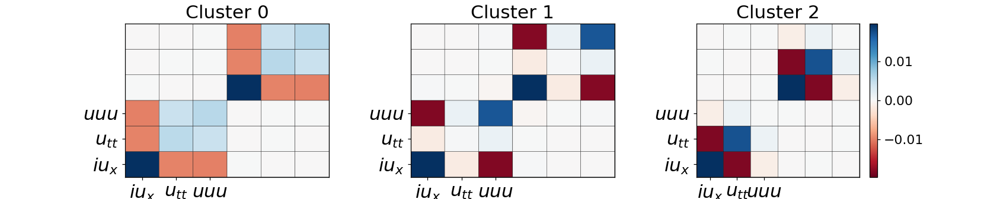

In [367]:
### 5. Plot the covariance matrices # Plot covariance matrices
plt.figure(figsize=(15, 3))
for i in range(nc):
    plt.subplot(1, nc, i + 1)
    C = model.covariances_[i, :, :]
    plt.pcolor(C, vmin=-max(abs(C.flatten())), vmax=max(abs(C.flatten())), cmap='RdBu', edgecolors='k')
    plt.gca().set_xticks(np.arange(0.5, nfeatures + 0.5))
    plt.gca().set_xticklabels(labels, fontsize=20)
    plt.gca().set_yticks(np.arange(0.5, nfeatures + 0.5))
    plt.gca().set_yticklabels(labels, fontsize=20)
    plt.gca().set_title('Cluster {0}'.format(i))

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
plt.colorbar()
plt.show()

### 6. Visualise the initial clusterisation of the dynamical space

<IPython.core.display.Javascript object>


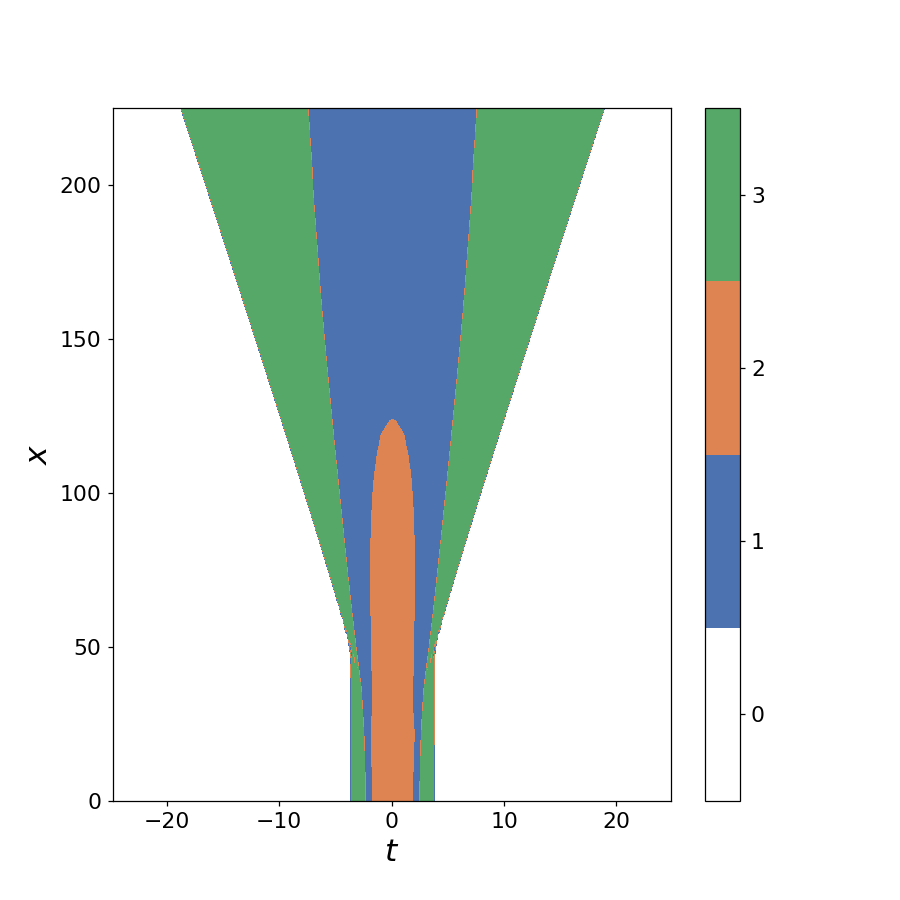

In [368]:
### 6. Visualise the initial clusterisation of the dynamical space# Optionally, set cluster zero to white
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cm = plt.get_cmap('Set1')
new_cm = cm(np.arange(cm.N))
new_cm[0, :] = [1, 1, 1, 1]
cm_white = ListedColormap(new_cm)

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette('deep').as_hex()
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_cmap = ListedColormap(sns_list)

cm = sns_cmap

# Colormap of clusters
clustermap = np.zeros([len(x)*len(t0)])
clustermap[mask.flatten('F')] = cluster_idx+1  # Index into unmasked regions
clustermap = np.reshape(clustermap, [len(x), len(t0)], order='F')

plt.figure(figsize=(8, 8))
plt.imshow(clustermap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 

plt.xlabel('$t$')
plt.ylabel('$x$')
plt.colorbar(boundaries=np.arange(-0.5, nc+1.5), ticks=np.arange(0, nc+1))
plt.show()

In [369]:
print(np.unique(clustermap))
print(np.shape(clustermap))

print(np.unique(balancemap))
print(np.shape(balancemap))

[0. 1. 2. 3.]
(1000, 4096)
[0. 1. 2. 3.]
(1000, 4096)


In [370]:
clustermap_idx = clustermap.flatten()

<IPython.core.display.Javascript object>


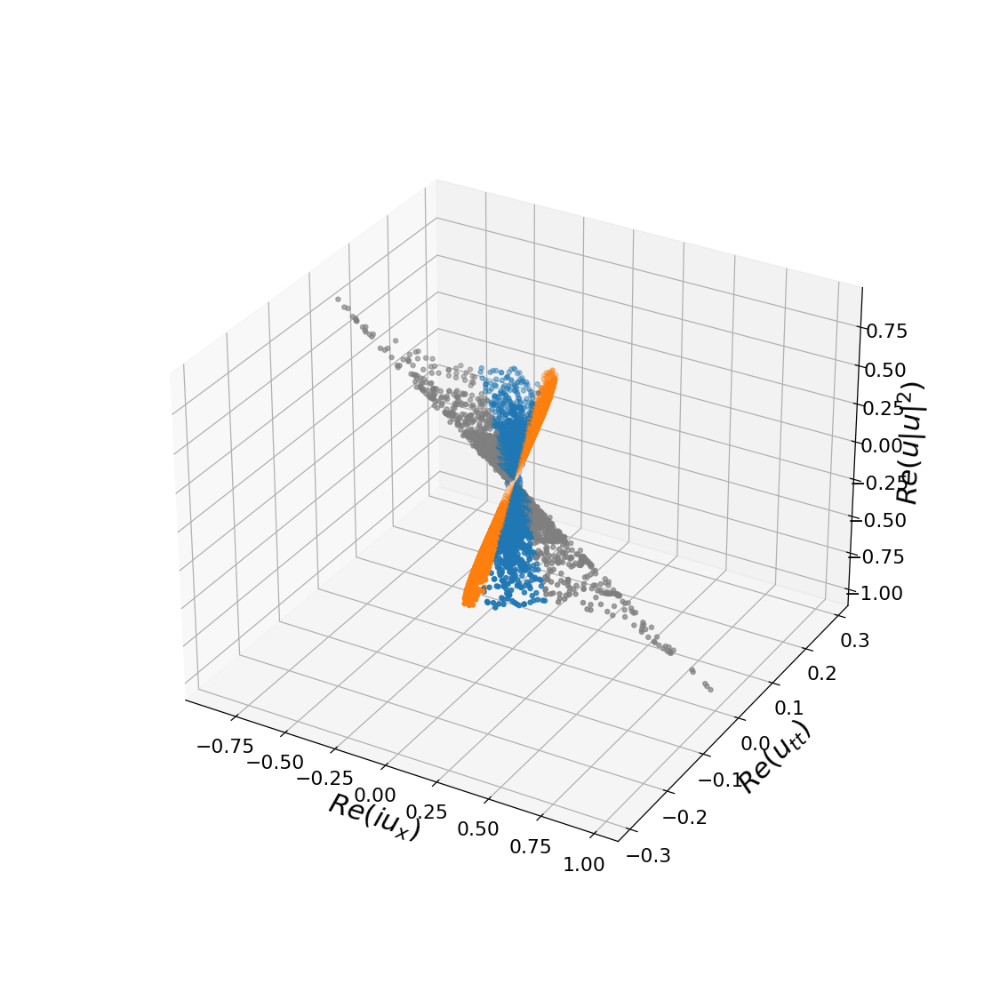

In [371]:
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d

import random
kk = 100

# mu = np.vstack((np.tile([255, 0, 0], (50, 1)), np.tile([255, 1, 255], (50, 1))))
mu = []
MU = []
for i in range(0, int(len(clustermap_idx)/kk)):
    if clustermap_idx[kk * i]==0:
        mu = np.array([255, 255, 255])
    if clustermap_idx[kk * i]==1:
        mu = np.array([31, 119, 180])
    if clustermap_idx[kk * i]==2:
        mu = np.array([127, 127, 127])
    if clustermap_idx[kk * i]==3:
        mu = np.array([255, 127, 14])
    if clustermap_idx[kk * i]==4:
        mu = np.array([173, 82, 240])
    if clustermap_idx[kk * i]==5:
        mu = np.array([45, 189, 237])
        
    if clustermap_idx[kk * i]==6:
        mu = np.array([102, 204, 0])
    if clustermap_idx[kk * i]==7:
        mu = np.array([255, 128, 0])
    if clustermap_idx[kk * i]==8:
        mu = np.array([72, 209, 204])
    if clustermap_idx[kk * i]==9:
        mu = np.array([255, 0, 255])
    if clustermap_idx[kk * i]==10:
        mu = np.array([150, 75, 0])
        
    if clustermap_idx[kk * i]==11:
        mu = np.array([0, 128, 128])
    if clustermap_idx[kk * i]==12:
        mu = np.array([255, 255, 0])
    if clustermap_idx[kk * i]==13:
        mu = np.array([0, 255, 0])
    if clustermap_idx[kk * i]==14:
        mu = np.array([128, 0, 128])
    if clustermap_idx[kk * i]==15:
        mu = np.array([255, 0, 0])
        
    MU = np.append(MU,mu)
MU = np.reshape(MU, (int(len(MU)/3) , 3))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features_full[:,:,0].flatten()[::kk], features_full[:,:,1].flatten()[::kk], features_full[:,:,2].flatten()[::kk], c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

<IPython.core.display.Javascript object>


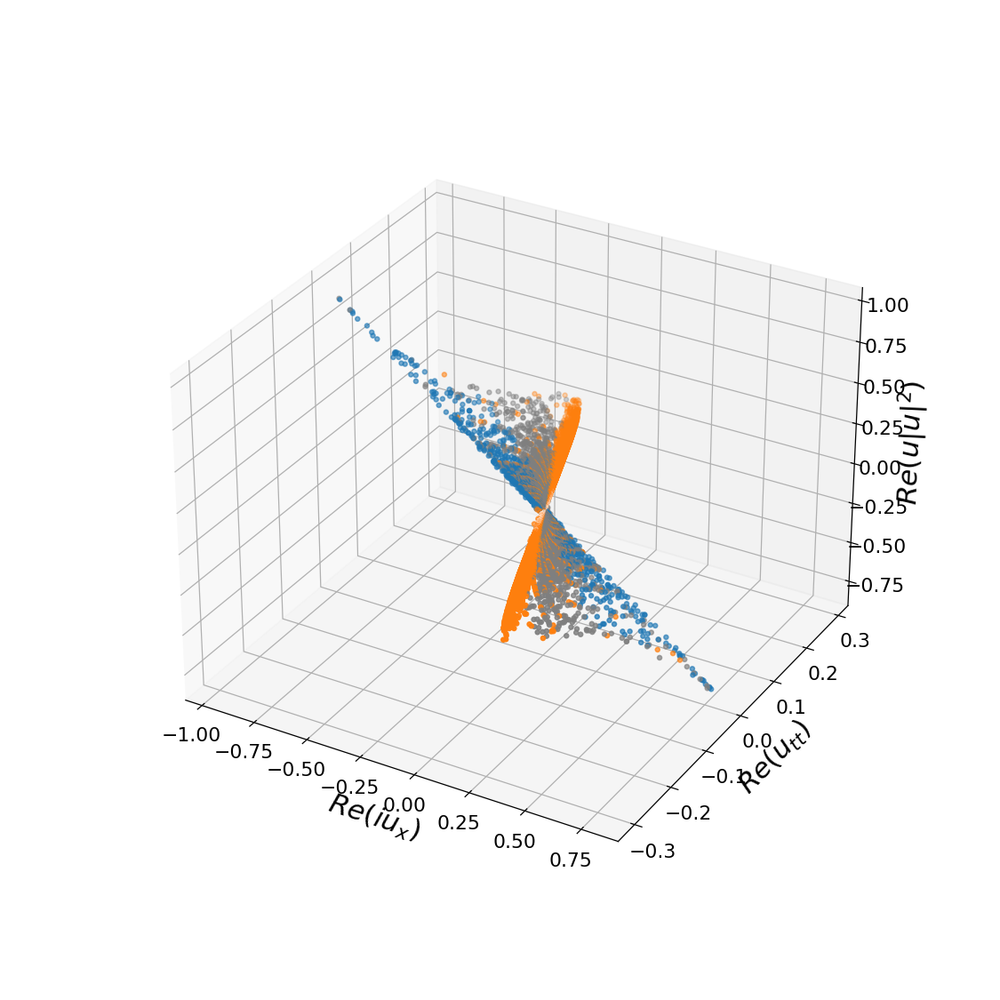

In [170]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features_full[:,:,3].flatten()[::kk], features_full[:,:,4].flatten()[::kk], features_full[:,:,5].flatten()[::kk], c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

<IPython.core.display.Javascript object>


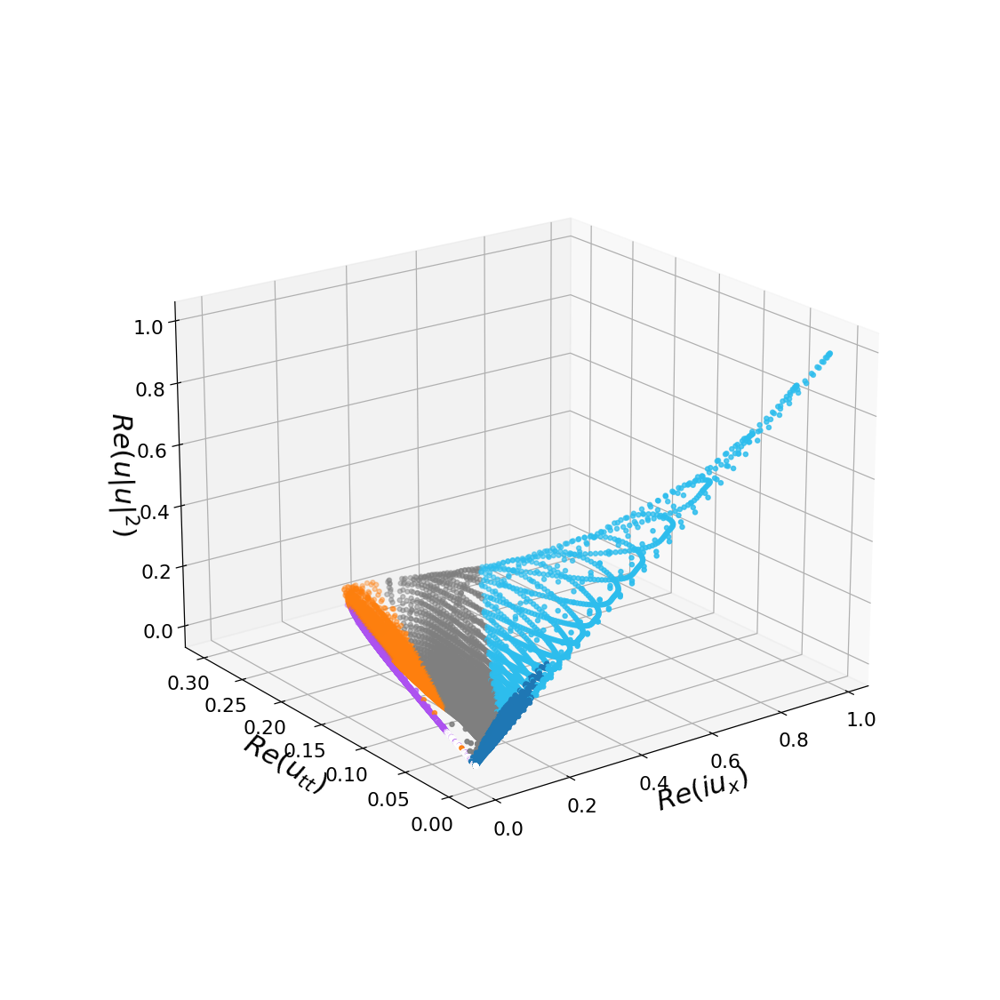

In [156]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(np.sqrt(features_full[:,:,0].flatten()[::kk]**2 + features_full[:,:,3].flatten()[::kk]**2),
                np.sqrt(features_full[:,:,1].flatten()[::kk]**2 + features_full[:,:,4].flatten()[::kk]**2),
                np.sqrt(features_full[:,:,2].flatten()[::kk]**2 + features_full[:,:,5].flatten()[::kk]**2), c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

## Hypothesis seletion procedure 

### 1. Building the full feature matrix

In [183]:
## Hypothesis seletion procedure ### 1. Building the full feature matrix# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt
featuremap[:, :, -1] = uuu

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))

(1000, 4096, 6)


### 2. Evaluate the best possible DB and display it

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


<IPython.core.display.Javascript object>


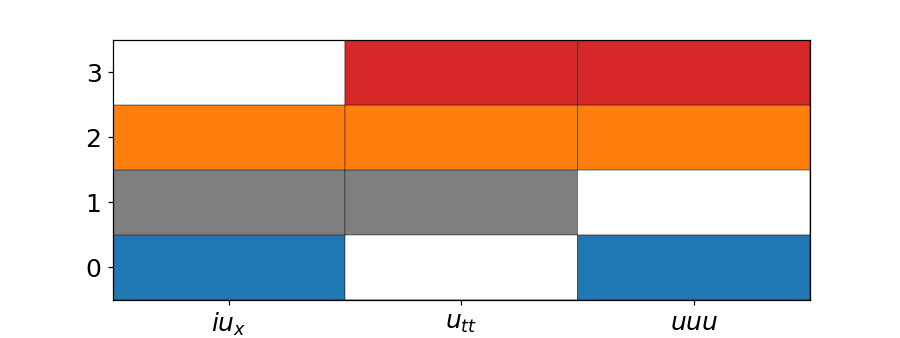

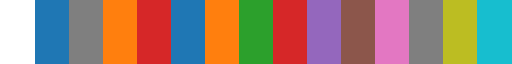

In [184]:
### 2. Evaluate the best possible DB and display itimport matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#1f77b4')  # Insert white at zero position
sns_list.insert(2, '#7f7f7f')  # Insert white at zero position
sns_list.insert(3, '#ff7f0e')  # Insert white at zero position
sns_list.insert(4, '#d62728')  # Insert white at zero position

sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,0,1],[1,1,0],[1,1,1],[0,1,1]])
nmodels = 4
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 150
idx_empty = 170
idx_empty = 180
idx_empty = 190
idx_empty = 200
idx_empty = 210
idx_empty = 220
idx_empty = 230
idx_empty = 240
idx_empty = 250
idx_empty = 260
idx_empty = 270
idx_empty = 280
idx_empty = 290
idx_empty = 300
idx_empty = 310
total score for NLSE DB= 0.6808919356005554
total score for DISP DB= 0.0
total score for NONL DB= 0.09992218097253915
total score for LAST DB= 0.0
Best possble score (pointwise)= 0.6808919356005554
total score for the selected DB= 0.6808919356005554
idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 100
idx_empty = 110
idx_empty = 120
idx_empty = 130
idx_empty = 140
total score for NLSE DB= 0.5735414053764949
total score for DISP DB= 0.6611780175532649
total score for NONL DB= 0.0

idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 100
idx_empty = 110
idx_empty = 120
idx_empty = 130
idx_empty = 140
idx_empty = 490
idx_empty = 500
idx_empty = 510
idx_empty = 520
idx_empty = 530
idx_empty = 540
idx_empty = 550
idx_empty = 560
idx_empty = 570
idx_empty = 580
idx_empty = 590
idx_empty = 600
idx_empty = 610
idx_empty = 620
idx_empty = 630
idx_empty = 640
idx_empty = 650
idx_empty = 660
idx_empty = 670
idx_empty = 680
idx_empty = 690
idx_empty = 700
idx_empty = 710
idx_empty = 720
idx_empty = 730
idx_empty = 740
idx_empty = 750
idx_empty = 760
idx_empty = 770
idx_empty = 780
idx_empty = 790
idx_empty = 800
idx_empty = 810
idx_empty = 820
idx_empty = 830
idx_empty = 840
idx_empty = 850
idx_empty = 860
idx_empty = 870
idx_empty = 880
idx_empty = 890
idx_empty = 900
idx_empty = 910
idx_empty = 920
idx_empty = 930
idx_empty = 940
idx_empty = 950
idx_empty = 960
idx

<IPython.core.display.Javascript object>


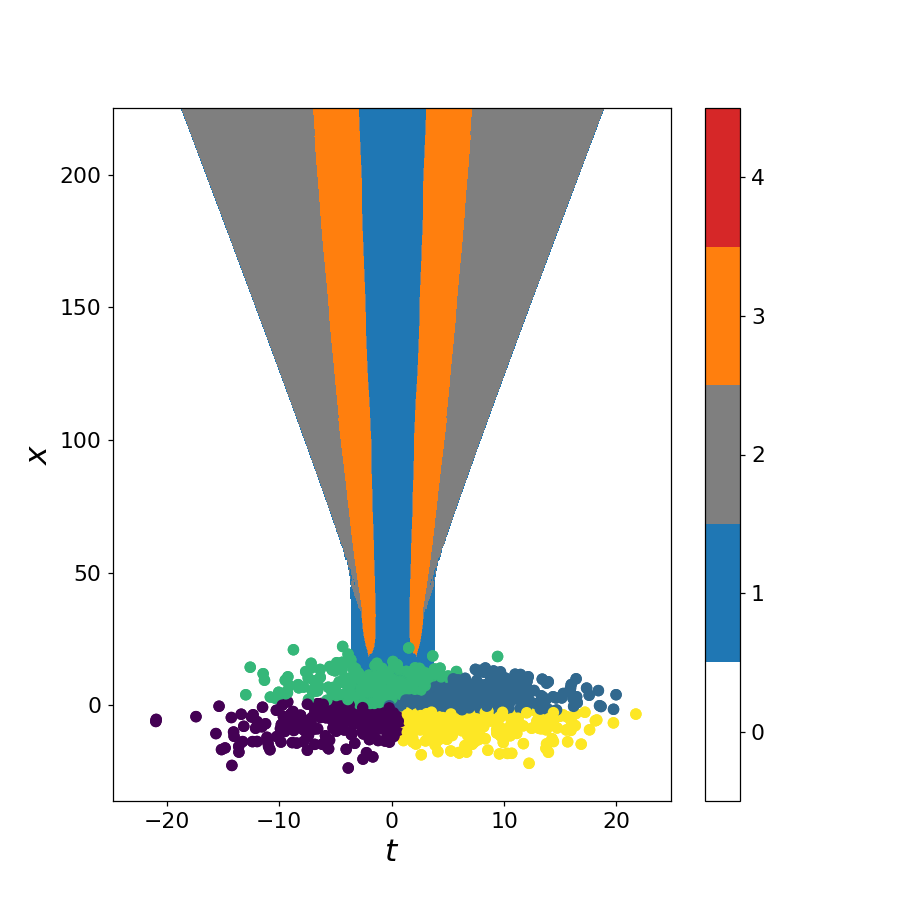

OBTAINED SCORE = 0.8142019473601454
MAXIMUM POSSIBLE SCORE = 0.8320725717172375


In [185]:
### DisplayS = 5
balancemap = np.empty_like(clustermap)
M_BEST_POITWISE = []
M_SEL = []

for cluster_ind in range(1, nc+1, 1):
#     print(cluster_ind)
    CLUSTERMAP = clustermap * 0
    for i in range(len(t)):
        for j in range(len(x)):
            if clustermap[j,i] == cluster_ind:
                CLUSTERMAP[j,i] = cluster_ind
            else:
                CLUSTERMAP[j,i] = 0

#     # CLUSTERMAP = clustermap
#     plt.figure(figsize=(8, 8))
#     plt.imshow(CLUSTERMAP, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
#               extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
#     plt.xlabel('$t$')
#     plt.ylabel('$x$')
#     plt.show()

    MAP2D = []
    MGN2D = []

    M_NLSE = []
    M_DISP = []
    M_NONL = []
    M_LAST = []

    #Check the first cluster
    for ind in range(0, 1000, 10): #SCAN THROUGH ALL X
#         print(ind)
#         display.clear_output(wait = True)
    #     time.sleep(0)
    #     print(ind)
        MAP1D = []
        MGN = []
        map1d = np.zeros(len(t))
        mgn1d = np.zeros(len(t))



        MGN1 = []
        SIGMA1 = []
        GN1 = []

        MGN2 = []
        SIGMA2 = []
        GN2 = []

        MGN3 = []
        SIGMA3 = []
        GN3 = []

        MGN4 = []
        SIGMA4 = []
        GN4 = []

        cc = np.where(clustermap[ind, :]==cluster_ind)
        if np.shape(cc)[1] == 0:
            print('idx_empty =', ind)

        #Constructing the corresponding matix at given x
        M1 =  np.vstack([np.sqrt(features_full[ind,cc, 0]**2 + features_full[ind,cc, 3]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 1]**2 + features_full[ind,cc, 4]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 2]**2 + features_full[ind,cc, 5]**2).flatten()])
        #Normalise the data
    #     minval = np.min(M1[np.nonzero(M1)])
    #     M = M1 / minval
        M = M1 / M1.min(axis=0)
        l = np.shape(M)[1]

        #How well a point corresponds to a particular dynamics?
        for i in range(l):
            #FULL
            gn = 1
            sigma = np.log10(max(M[:,i])) - np.log10(min(M[:,i]))
            mgn1 = gn / (1 + sigma)
            MGN1 = np.append(MGN1, mgn1)
            SIGMA1 = np.append(SIGMA1, sigma)
            GN1 = np.append(GN1, gn)

            #DISP
            if min(M[0:2:1,i]) - M[2,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:2:1,i])-M[2,i])/np.log10(min(M[0:2:1,i])+M[2,i])
    #             gn = math.log(min(M1[0:2:1,i])-M1[2,i] , min(M1[0:2:1,i])+M1[2,i])
            sigma = np.log10(max(M[0:2,i]))-np.log10(min(M[0:2,i]))
            sigma = np.log10(max(M1[0:2,i]))-np.log10(min(M1[0:2,i]))
            mgn2 = gn / (1 + sigma)
            MGN2 =  np.append(MGN2, mgn2)
            SIGMA2 = np.append(SIGMA2, sigma)
            GN2 = np.append(GN2, gn)

            #NONL
            if min(M[0:3:2,i]) - M[1,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:3:2,i]) - M[1,i]) / np.log10(min(M[0:3:2,i]) + M[1,i])
            sigma = np.log10(max(M[0:3:2,i])) - np.log10(min(M[0:3:2,i]))
            mgn3 = gn / (1 + sigma)
            MGN3 =  np.append(MGN3, mgn3)
            SIGMA3 = np.append(SIGMA3, sigma)
            GN3 = np.append(GN3, gn)

            #LAST
            if min(M[1:3:1,i]) - M[0,i] < 1:
                gn = 0
            else:
                 gn = np.log10(min(M[1:3:1,i]) - M[0,i]) / np.log10(min(M[1:3:1,i]) + M[0,i])
            sigma = np.log10(max(M[1:3:1,i])) - np.log10(min(M[1:3:1,i]))
            mgn4 = gn / (1 + sigma)
            MGN4 =  np.append(MGN4, mgn4)
            SIGMA4 = np.append(SIGMA4, sigma)
            GN4 = np.append(GN4, gn)

            if mgn1 > mgn2 and mgn1 > mgn3 and mgn1 > mgn4:
                MAP1D = np.append(MAP1D, 3)
                MGN = np.append(MGN, mgn1)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn1)

            if mgn2 > mgn1 and mgn2 > mgn3 and mgn2 > mgn4:
                MAP1D = np.append(MAP1D, 2)
                MGN = np.append(MGN, mgn2)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn2)

            if mgn3 > mgn1 and mgn3 > mgn2 and mgn3 > mgn4:
                MAP1D = np.append(MAP1D, 1)
                MGN = np.append(MGN, mgn3)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn3)

            if mgn4 > mgn1 and mgn4 > mgn2 and mgn4 > mgn3:
                MAP1D = np.append(MAP1D, 4)
                MGN = np.append(MGN, mgn4)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn4)

        M_NLSE = np.append(M_NLSE, MGN1)
        M_DISP = np.append(M_DISP, MGN2)
        M_NONL = np.append(M_NONL, MGN3)
        M_LAST = np.append(M_LAST, MGN4)
        
        map1d[cc] = MAP1D
        mgn1d[cc] = MGN
        MAP2D = np.append(MAP2D, map1d)
        MGN2D = np.append(MGN2D, mgn1d)
        
        


#         plt.figure(figsize=(12, 12));
#         plt.subplot(3,1,3)
#         plt.plot(t[cc], np.abs(u[ind, cc].flatten())**2, color = 'black', linestyle = ':')
#         scatter = plt.scatter(t[cc], np.abs(u[ind, cc])**2, c = MAP1D, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
#         plt.grid('True')
#         plt.ylabel('$|\u03C8|^{2}$')
#         plt.xlim(-5,20)
#         plt.xlabel('t')
#     #     plt.legend(handles=scatter.legend_elements()[0], labels=classes)

#         plt.subplot(3,1,1)
#         plt.semilogy(t[cc], np.asarray(M[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
#         plt.semilogy(t[cc], np.asarray(M[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
#         plt.semilogy(t[cc], np.asarray(M[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     #     plt.ylim((10**(-4), 1))
#         plt.xlim(-5,20)
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('Abs individual contributions')

#         plt.subplot(3,1,2)
#         plt.plot(t[cc], MGN1, color = 'orange', label = 'NLSE DB')
#         plt.plot(t[cc], MGN2, color = 'gray', label = 'DISP DB')
#         plt.plot(t[cc], MGN3, color = 'blue', label = 'NONL DB')
#         plt.plot(t[cc], MGN4, color = 'red', label = '- DB')
#         plt.plot(t[cc], MGN, color = 'black', linestyle = ':', label = 'BEST DB')
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('M')
#         plt.xlim(-5,20)
#         plt.show()

        
        
    n_total = len(M_NLSE)
    SCORE_NLSE = np.sum(M_NLSE) / n_total
    SCORE_DISP = np.sum(M_DISP) / n_total
    SCORE_NONL = np.sum(M_NONL) / n_total
    SCORE_LAST = np.sum(M_LAST) / n_total
    SCORE_BEST = np.sum(MGN2D[np.nonzero(MGN2D)])/len(MGN2D[np.nonzero(MGN2D)])

    print('total score for NLSE DB=',SCORE_NLSE)
    print('total score for DISP DB=',SCORE_DISP)
    print('total score for NONL DB=',SCORE_NONL)
    print('total score for LAST DB=',SCORE_LAST)
    print('Best possble score (pointwise)=',SCORE_BEST)

    if SCORE_NLSE >= SCORE_DISP and SCORE_NLSE >= SCORE_NONL and SCORE_NLSE >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NLSE)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 3

    if SCORE_DISP > SCORE_NLSE and SCORE_DISP >= SCORE_NONL and SCORE_DISP >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_DISP)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 2

    if SCORE_NONL > SCORE_NLSE and SCORE_NONL > SCORE_DISP and SCORE_NONL >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NONL)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 1

    if SCORE_LAST > SCORE_NLSE and SCORE_LAST > SCORE_DISP and SCORE_LAST > SCORE_NONL:
        M_SEL = np.append(M_SEL, M_LAST)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 4

    print('total score for the selected DB=', np.sum(M_SEL) / len(M_SEL))
    
plt.figure(figsize=(8, 8))
plt.imshow(balancemap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
plt.xlabel('$t$')
plt.ylabel('$x$')
plt.colorbar(boundaries=np.arange(-0.5, 5.5), ticks=np.arange(0, 5))
plt.show()

print('OBTAINED SCORE =', np.sum(M_SEL) / len(M_SEL))
print('MAXIMUM POSSIBLE SCORE =', np.sum(M_BEST_POITWISE) / len(M_BEST_POITWISE))

### Display

<IPython.core.display.Javascript object>


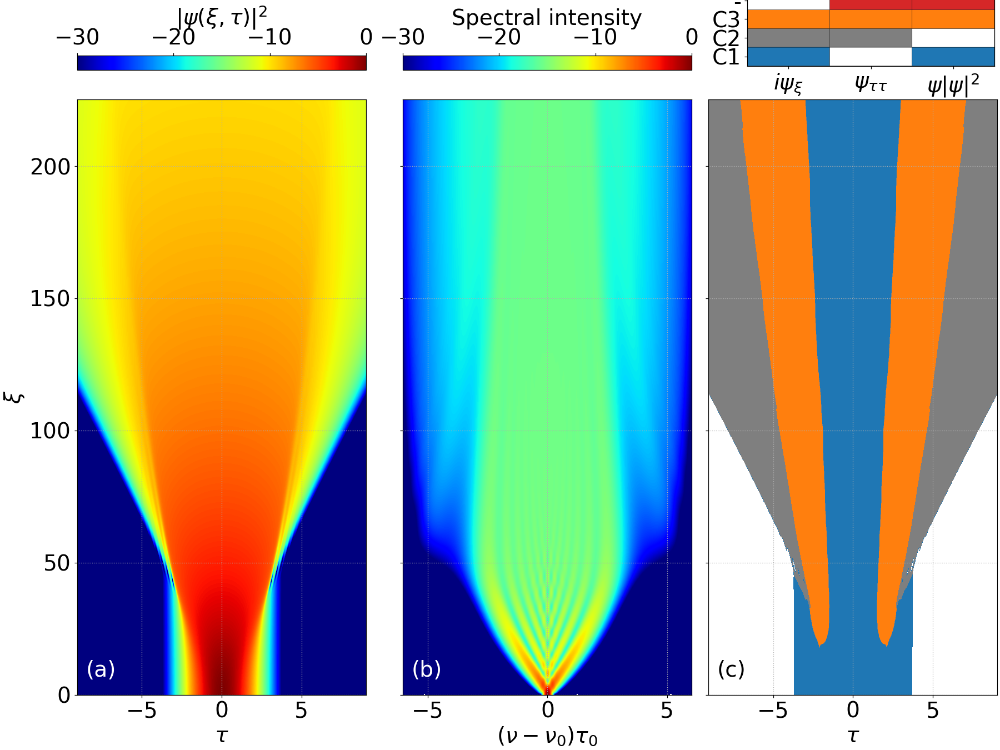

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10
c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log10


In [186]:
### Display# s = data['Ip_TF']
edge = 1300

fs = 25
mpl.rc('font', family='sans serif')


def identify_axes(ax_dict, fontsize=60):
    """
    Helper to identify the Axes in the examples below.

    Draws the label in a large font in the center of the Axes.

    Parameters
    ----------
    ax_dict : dict[str, Axes]
        Mapping between the title / label and the Axes.
    fontsize : int, optional
        How big the label should be.
    """
    kw = dict(ha="center", va="center", fontsize=fontsize, color="darkgrey")
    for k, ax in ax_dict.items():
        ax.text(0.5, 0.5, k, transform=ax.transAxes, **kw)


from mpl_toolkits.axes_grid.inset_locator import inset_axes
import matplotlib.patches as patches

    

outer = [['long left', 'long center', 'long right'],
         ['long left', 'long center', 'long right']]

fig, axd = plt.subplot_mosaic(outer, layout="constrained")
# for k in axd:
#     annotate_axes(axd[k], f'axd["{k}"]')
fig.tight_layout
fig.set_figheight(12)
fig.set_figwidth(16)
# identify_axes(axd)
# fig.suptitle('(c) Spontaneous modulation instability', fontsize = fs)

it = lambda field: 10*np.log10(abs(field)**2) 
# it = lambda field: abs(field)**2

lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
# im1 = axd['long left'].imshow(lIT[:,5:len(t)-4], cmap=colc, origin='lower', vmin=0, vmax=mlIT,
#           extent=[min(t[5:len(t)-4]), max(t[5:len(t)-4]), min(x), max(x)], aspect='auto'); 
im1 = axd['long left'].imshow(lIT[:,edge:len(t)-edge], cmap=colc, origin='lower', vmin=mlIT - TRS, vmax=mlIT,
          extent=[min(t[edge:len(t)-edge]), max(t[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
# axd['long left'].set_ylabel('Distance')
axd['long left'].set_ylabel('$\u03BE$', fontsize=fs)
axd['long left'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long left'].tick_params(axis = 'both', labelsize=fs)
# axd['long left'].set_xticks([-15,-10,-5,0,5,10,15])


# ax1.set_xticks([], [])
# axd['long left'].tick_params(labelbottom = False)
axd['long left'].grid('True', linestyle = ':')
cb = fig.colorbar(im1, ax = axd['long left'], location = 'top')
cb.ax.tick_params(labelsize=fs)
cb.set_label(label = '$|\u03C8(\u03BE,\u03C4)|^2$', size=fs)
# cb.set_ticks([0,0.5,1])


it1 = lambda field: 10*np.log10(abs(field)**2) 
lIT = it1(s); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
#plt.pcolor(t, x, lIT, cmap='viridis');          # plot as pseudocolor map
# im3 = axd['long center'].imshow(s[:, 980:1068], cmap=colc, origin='lower', vmin=0, vmax=1,
#           extent=[min(f[1000:1048]), max(f[1000:1048]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
im3 = axd['long center'].imshow(lIT[:, 1748:2348], cmap=colc, origin='lower', vmin=mlIT - 30, vmax=mlIT,
          extent=[min(f[1748:2348]), max(f[1748:2348]), min(x), max(x)], aspect='auto')          # plot as pseudocolor map
# axd['long right'].set_xlim(frange);
axd['long center'].grid('True', linestyle = ':')
axd['long center'].tick_params(labelleft= False)
axd['long center'].set_xlabel('$(\u03BD - \u03BD_{0})\u03C4_{0}$', fontsize=fs)
axd['long center'].tick_params(labelleft= False)
axd['long center'].tick_params(axis = 'both', labelsize=fs)
# axd['long center'].set_xticks([-10,-5,0,5,10])
cb = fig.colorbar(im3, ax = axd['long center'], location = 'top')
cb.ax.tick_params(labelsize=fs)
# cb.set_ticks([0,0.5,1])
cb.set_label(label = 'Spectral intensity', size=fs)


im2 = axd['long right'].imshow(balancemap[:,edge:len(t)-edge], cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t[edge:len(t)-edge]), max(t[edge:len(t)-edge]), min(x), max(x)], aspect='auto'); 
axd['long right'].grid('True', linestyle = ':')
# axd['long right'].set_xlim(trange)
axd['long right'].set_xlabel('$\u03C4$', fontsize=fs)
axd['long right'].tick_params(labelleft= False)
rect = patches.Rectangle((-13, 60), 26, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
rect1 = patches.Rectangle((-6.75, 75.5), 4, 4, linewidth=2, edgecolor='w', facecolor='none', linestyle = '--')
# axd['long center'].add_patch(rect)
# axd['long center'].add_patch(rect1)
# axd['long center'].text(-2.2, 75.8, 'PS', fontsize = fs)
# axd['long center'].text(11.5, 60.3, 'AB', fontsize = fs)
axd['long right'].tick_params(axis = 'both', labelsize=fs)
# axd['long right'].set_xticks([-15,-10,-5,0,5,10,15])



ax_ins = inset_axes(axd['long right'], width = '60%', height = 1.2, loc='upper left',
                   bbox_to_anchor=(0.12,1.14,1.425,0.05), bbox_transform=axd['long right'].transAxes)
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k'); 
plt.title('Identified clusters', fontsize=fs)
plt.xticks([0.5, 1.5, 2.5], ['$i \u03C8_{\u03BE}$','$\u03C8_{\u03C4 \u03C4}$', '$\u03C8|\u03C8|^2$'], fontsize=fs)
plt.yticks([0.5,1.5, 2.5, 3.5], ['C1','C2','C3','-'], fontsize=fs)

axd['long left'].text(0.03, 0.03, '(a)', transform=axd['long left'].transAxes, size=fs, color = 'white')
axd['long center'].text(0.03, 0.03, '(b)', transform=axd['long center'].transAxes, size=fs, color = 'white')
axd['long right'].text(0.03, 0.03, '(c)', transform=axd['long right'].transAxes, size=fs, color = 'black')


# plt.gca().set_xticks(np.arange(0, 1300, 400))
# plt.savefig('Modulation_Instability.png')
plt.savefig('OWB.png', dpi = 300)
plt.savefig('OWB.pdf', transparent = 'True')
plt.show()

In [187]:
balance_idx = balancemap.flatten()

<IPython.core.display.Javascript object>


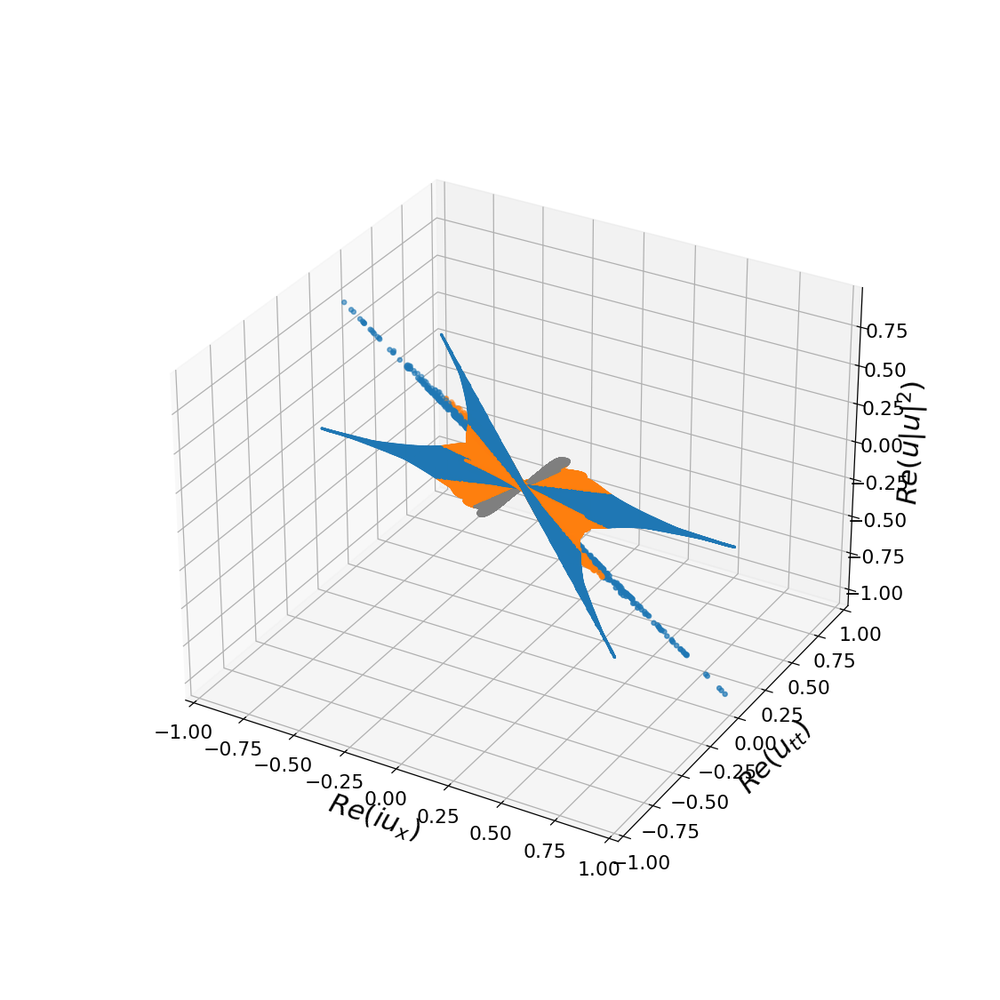

In [188]:
# %matplotlib notebook
# from mpl_toolkits.mplot3d import axes3d

import random
kk = 100

# mu = np.vstack((np.tile([255, 0, 0], (50, 1)), np.tile([255, 1, 255], (50, 1))))
mu = []
MU = []
for i in range(0, int(len(balance_idx)/kk)):
    if balance_idx[kk * i]==0:
        mu = np.array([255, 255, 255])
    if balance_idx[kk * i]==1:
        mu = np.array([31, 119, 180])
    if balance_idx[kk * i]==2:
        mu = np.array([127, 127, 127])
    if balance_idx[kk * i]==3:
        mu = np.array([255, 127, 14])
    MU = np.append(MU,mu)
MU = np.reshape(MU, (int(len(MU)/3) , 3))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features_full[:,:,0].flatten()[::kk], features_full[:,:,1].flatten()[::kk], features_full[:,:,2].flatten()[::kk], c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
plt.show()

In [189]:
S = 1
k = 1
idx_1 = [k * i for i, val in enumerate(balance_idx[::k]) if val == 1]
idx_2 = [k * i for i, val in enumerate(balance_idx[::k]) if val == 2]
idx_3 = [k * i for i, val in enumerate(balance_idx[::k]) if val == 3]


plt.scatter(features_full[:,:,2].flatten()[idx_1], features_full[:,:,1].flatten()[idx_1], color = '#1f77b4', s = S)
plt.scatter(features_full[:,:,2].flatten()[idx_3], features_full[:,:,1].flatten()[idx_3], color = '#ff7f0e', s = S)
plt.scatter(features_full[:,:,2].flatten()[idx_2], features_full[:,:,1].flatten()[idx_2], color = '#7f7f7f', s = S)
plt.xlabel('$Re(u|u|^2)$')
plt.ylabel('$Re(u_{tt})$')
plt.grid('True', linestyle = ':')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

plt.scatter(features_full[:,:,0].flatten()[idx_1], features_full[:,:,2].flatten()[idx_1], color = '#1f77b4', s = S)
plt.scatter(features_full[:,:,0].flatten()[idx_3], features_full[:,:,2].flatten()[idx_3], color = '#ff7f0e', s = S)
plt.scatter(features_full[:,:,0].flatten()[idx_2], features_full[:,:,2].flatten()[idx_2], color = '#7f7f7f', s = S)
plt.xlabel('$Re(iu_{x})$')
plt.ylabel('$Re(u|u|^2)$')
plt.grid('True', linestyle = ':')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

plt.scatter(features_full[:,:,0].flatten()[idx_1], features_full[:,:,1].flatten()[idx_1], color = '#1f77b4', s = S)
plt.scatter(features_full[:,:,0].flatten()[idx_3], features_full[:,:,1].flatten()[idx_3], color = '#ff7f0e', s = S)
plt.scatter(features_full[:,:,0].flatten()[idx_2], features_full[:,:,1].flatten()[idx_2], color = '#7f7f7f', s = S)
plt.xlabel('$Re(iu_{x})$')
plt.ylabel('$Re(u_{tt})$')
plt.grid('True', linestyle = ':')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

## IV Representation of dynamics

### 1. Output field - time domain

In [45]:
from IPython import display
import time


sbalancemap = [] #spectral balancemap### 1. Output field - time domain
sbalance = 0 * s[0]

#Taking a particular wavefront from the propagation
for j in range(999, 1000, 1):
    x_idx = j
    print(x_idx)
    display.clear_output(wait = True)
    time.sleep(0)

    #Extracting the indices of the identified clusters from the spatio-temporal field - in particular for the Riemann wave
    c0 = [] #zero dynamics
    c1 = [] #dispersion
    c2 = [] #NLSE
    c3 = [] #Nonlnear balance
    
    for j in range(len(t)):
        if balancemap[x_idx, j] == 0:
            c0 = np.append(c0, j)
        if balancemap[x_idx, j] == 1:
            c1 = np.append(c1, j)
        if balancemap[x_idx, j] == 2:
            c2 = np.append(c2, j)
        if balancemap[x_idx, j] == 3:
            c3 = np.append(c3, j)

    if len(c0)==0 or len(c1)==0 or len(c2)==0 or len(c3)==0:
        Ec0 = u[x_idx] * len(c0)
        Ec1 = u[x_idx] * len(c1)
        Ec2 = u[x_idx] * len(c2)
        Ec3 = u[x_idx] * len(c3)
        
        
        if max(np.abs(Ec0))>0:
            c0 = c0.astype(int)
            Ec0 = u[x_idx] * 0
            Ec0[c0] = u[x_idx, c0]
        else:
            Ec0 = u[x_idx] * 0
            
        if max(np.abs(Ec1))>0:
            c1 = c1.astype(int)
            Ec1 = u[x_idx] * 0
            Ec1[c1] = u[x_idx, c1]
        else:
            Ec1 = u[x_idx] * 0
            
        if max(np.abs(Ec2))>0:
            c2 = c2.astype(int)
            Ec2 = u[x_idx] * 0
            Ec2[c2] = u[x_idx, c2]
        else:
            Ec2 = u[x_idx] * 0
            
        if max(np.abs(Ec3))>0:
            c3 = c3.astype(int)
            Ec3 = u[x_idx] * 0
            Ec3[c3] = u[x_idx, c3]
        else:
            Ec3 = u[x_idx] * 0
        
    else:
        c0 = c0.astype(int)
        c1 = c1.astype(int)
        c2 = c2.astype(int)
        c3 = c3.astype(int)

        #Selecting the spectra corresponding to the identified clusters
        Ec0 = u[x_idx] * 0
        Ec0[c0] = u[x_idx, c0]

        Ec1 = u[x_idx] * 0
        Ec1[c1] = u[x_idx, c1]

        Ec2 = u[x_idx] * 0
        Ec2[c2] = u[x_idx, c2]
        
        Ec3 = u[x_idx] * 0
        Ec3[c3] = u[x_idx, c3]        


#     #Mapping these clusters to the frequemcy domain
#     FEc0 = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(Ec0)))
#     FEc1 = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(Ec1)))
#     FEc2 = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(Ec2)))
#     FEc3 = np.fft.fftshift(np.fft.ifft(np.fft.fftshift(Ec3)))
    
#     #Now creating the indices for spectral components
#     C0 = []
#     C1 = []
#     C2 = []
#     C3 = []

#     #Finding out where one of the components dominating over others
#     for j in range(len(f)):
#         if np.abs(FEc0[j]) > np.abs(FEc1[j]) and np.abs(FEc0[j]) > np.abs(FEc2[j]) and np.abs(FEc0[j]) > np.abs(FEc3[j]):
#             C0 = np.append(C0, j)
#         if np.abs(FEc1[j]) > np.abs(FEc0[j]) and np.abs(FEc1[j]) > np.abs(FEc2[j]) and np.abs(FEc1[j]) > np.abs(FEc3[j]):
#             C1 = np.append(C1, j)
#         if np.abs(FEc2[j]) > np.abs(FEc0[j]) and np.abs(FEc2[j]) > np.abs(FEc1[j]) and np.abs(FEc2[j]) > np.abs(FEc3[j]):
#             C2 = np.append(C2, j)
#         if np.abs(FEc3[j]) > np.abs(FEc0[j]) and np.abs(FEc3[j]) > np.abs(FEc1[j]) and np.abs(FEc3[j]) > np.abs(FEc2[j]):
#             C3 = np.append(C3, j)
            
#     #How to deal with an empty array in case one of the clusters is empty (here just for C0)
# #     try:
#     if len(C0)==0 or len(C1)==0 or len(C2)==0 or len(C3)==0:
#         SEc0 = s[x_idx] * len(C0)
#         SEc1 = s[x_idx] * len(C1)
#         SEc2 = s[x_idx] * len(C2)
#         SEc3 = s[x_idx] * len(C3)
        
#         if max(np.abs(SEc0))>0:
#             C0 = C0.astype(int)
#             SEc0 = s[x_idx] * 0 
#             SEc0[C0] = s[x_idx, C0]
#         else:
#             SEc0 = s[x_idx] * 0
            
#         if max(np.abs(SEc1))>0:
#             C1 = C1.astype(int)
#             SEc1 = s[x_idx] * 0 
#             SEc1[C1] = s[x_idx, C1]
#         else:
#             SEc1 = s[x_idx] * 0
            
#         if max(np.abs(SEc2))>0:
#             C2 = C2.astype(int)
#             SEc2 = s[x_idx] * 0 
#             SEc2[C2] = s[x_idx, C2]
#         else:
#             SEc2 = s[x_idx] * 0
            
#         if max(np.abs(SEc3)**2)>0:
#             C3 = C3.astype(int)
#             SEc3 = s[x_idx] * 0 
#             SEc3[C3] = s[x_idx, C3]
#         else:
#             SEc3 = s[x_idx] * 0
        
#     else:
#         C0 = C0.astype(int)
#         C1 = C1.astype(int)
#         C2 = C2.astype(int)
#         C3 = C3.astype(int)

#         #Selecting the spectra corresponding to the identified clusters
#         SEc0 = s[x_idx] * 0
#         SEc0[C0] = s[x_idx, C0]

#         SEc1 = s[x_idx] * 0
#         SEc1[C1] = s[x_idx, C1]

#         SEc2 = s[x_idx] * 0
#         SEc2[C2] = s[x_idx, C2]
        
#         SEc3 = s[x_idx] * 0
#         SEc3[C3] = s[x_idx, C3]

#     #Applying the threshold for the field - only looking at the points where the total spectrum is above the trs    
#     sbalance[C0] = 0
#     sbalance[C1] = 1
#     sbalance[C2] = 2
#     sbalance[C3] = 3
    
#     trs = 0.001 #This value to be selected properly
#     for j in range(len(C1)):
#         if np.abs(s[x_idx, C1[j]])**2 < trs:
#             sbalance[C1[j]] = 0
            
#     for j in range(len(C2)):
#         if np.abs(s[x_idx, C2[j]])**2 < trs:
#             sbalance[C2[j]] = 0
            
#     for j in range(len(C3)):
#         if np.abs(s[x_idx, C3[j]])**2 < trs:
#             sbalance[C3[j]] = 0
    
#     #Creating the final sbalancemap    
#     sbalancemap = np.append(sbalancemap,sbalance)

#     #Display
#     plt.figure(figsize=(16, 4))
#     plt.subplot(131)
#     plt.plot(t, np.abs(u[x_idx])**2, 'black', label = 'wavefront')
#     plt.plot(t, np.abs(Ec1)**2, 'blue', label = 'nonlinearity')
#     plt.plot(t, np.abs(Ec2)**2, 'gray', label = 'dispersion')
#     plt.plot(t, np.abs(Ec3)**2, 'orange', label = 'NLSE')
#     plt.plot(t, np.abs(Ec0)**2, 'white', label = 'zero dynamics')
#     plt.xlim(-10, 10)
#     plt.xlabel('T (ps)')
#     plt.ylabel('$|A(z,T)|^2$, W')
#     plt.grid('True',linestyle = ':')
#     plt.legend()

#     plt.subplot(132)
# #     plt.plot(f, np.abs(s[x_idx])**2 / 100, 'black', label = 'spectrum')
#     plt.plot(f, np.abs(FEc1)**2, 'blue', label = 'nonlinearity')
#     plt.plot(f, np.abs(FEc2)**2, 'gray',  label = 'dispersion')
#     plt.plot(f, np.abs(FEc3)**2, 'orange',  label = 'NLSE')
#     plt.plot(f, np.abs(FEc0)**2, 'white', label = 'zero dynamics')
#     plt.xlabel('Frequency (THz)')
#     plt.ylabel('$|A(z,f)|^2$')
#     plt.grid('True',linestyle = ':')
#     plt.xlim(-20, 20)
#     plt.legend()

#     plt.subplot(133)
#     plt.plot(f, np.abs(s[x_idx])**2, 'black', label = 'spectrum')
#     plt.plot(f, np.abs(SEc1)**2, 'blue', label = 'nonlinearity')
#     plt.plot(f, np.abs(SEc2)**2, 'gray',  label = 'dispersion')
#     plt.plot(f, np.abs(SEc3)**2, 'orange',  label = 'NLSE')
#     plt.plot(f, np.abs(SEc0)**2, 'white', label = 'zero dynamics')
#     plt.xlabel('Frequency (THz)')
#     plt.ylabel('$|A(z,f)|^2$')
#     plt.grid('True',linestyle = ':')
#     plt.xlim(-20, 20)
#     plt.legend()
#     plt.show()
# #     except:
# #         print('lala')

999


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


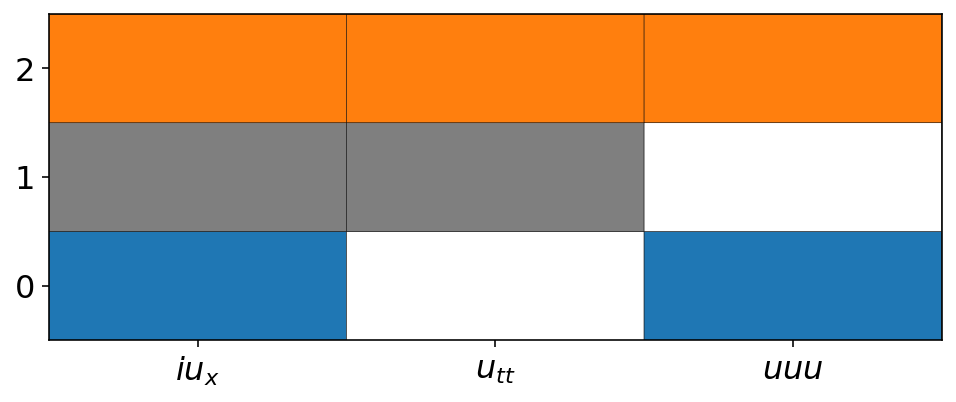

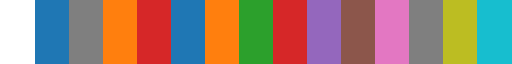

In [46]:
import matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#1f77b4')  # Insert white at zero position
sns_list.insert(2, '#7f7f7f')  # Insert white at zero position
sns_list.insert(3, '#ff7f0e')  # Insert white at zero position
sns_list.insert(4, '#d62728')  # Insert white at zero position

sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,0,1],[1,1,0],[1,1,1]])
nmodels = 3
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

### 2. Output field - frequency domain

(4096,)
[0. 0. 0. ... 0. 0. 0.]


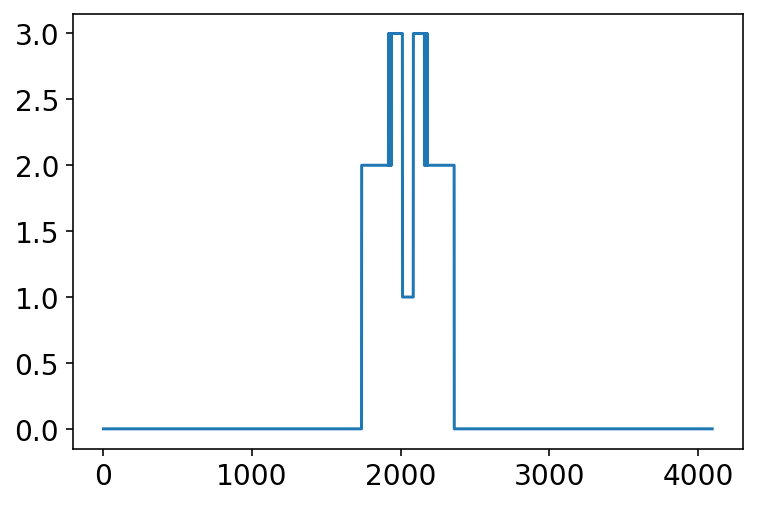

In [47]:
### 2. Output field - frequency domainprint(np.shape(Sbalancemap[-1,:]))
print(Sbalancemap[-1,:])

plt.plot(Sbalancemap[-1,:])
plt.show()


CCC1 = np.where(Sbalancemap[-1,:] == 1)[0]
CCC2 = np.where(Sbalancemap[-1,:] == 2)[0]
CCC3 = np.where(Sbalancemap[-1,:] == 3)[0]

### 3. Recalculating the features with an appropriate normalisation

In [48]:
### 3. Recalculating the features with an appropriate normalisationNpts = 2 * 2048
Tmax = 1e-12
dT = 2 * Tmax / (Npts - 1)
TT = np.arange(-Npts / 2, Npts / 2) * dT

t = TT * np.sqrt(2) / T0
print(max(t))
f = np.arange(-Npts / 2, Npts / 2) / (2 * max(t))
print(max(f))

24.804705457470394
41.26233233266449


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


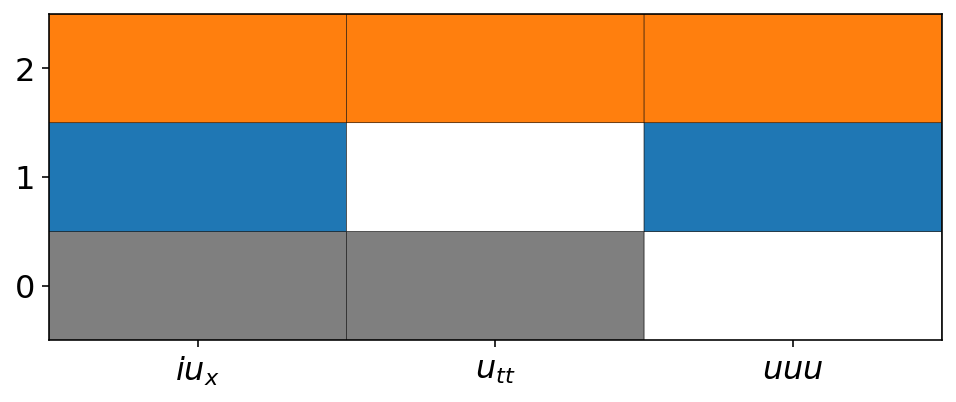

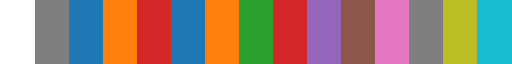

In [49]:
import matplotlib.cm as cm1

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list1 = sns.color_palette(n_colors=10)
sns_list1.insert(0, '#ffffff')  # Insert white at zero position
sns_list1.insert(1, '#7f7f7f')  # Insert white at zero position
sns_list1.insert(2, '#1f77b4')  # Insert white at zero position
sns_list1.insert(3, '#ff7f0e')  # Insert white at zero position
sns_list1.insert(4, '#d62728')  # Insert white at zero position

sns_cmap1 = ListedColormap(sns_list1)

cm1 = sns_cmap1
print(sns.color_palette(n_colors=10).as_hex())



balance_models1 = np.asarray([[1,1,0],[1,0,1],[1,1,1]])
nmodels1 = 3
gridmap1 = balance_models1.copy()
gridmap1 = (gridmap1.T*np.arange(nmodels1)).T  # Scale map so that active terms can be color-coded

gridmap1 = (balance_models1.T*np.arange(1, nmodels1+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap1, vmin=-0.5, vmax=cm1.N-0.5, cmap=cm1, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels1+0.5))
plt.gca().set_yticklabels(range(0, nmodels1), fontsize=16)
plt.show()

cm1

In [50]:
np.sqrt((L_D / L_NL)) ** 3

27028.030847938942

In [51]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux * 30 ** 3 / 10**4
featuremap[:, :, -2] = utt * 30 ** 3 / 10**4
featuremap[:, :, -1] = uuu * 30 ** 3 / 10**4

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))

(1000, 4096, 6)


### 3. Final figure

c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in log10
c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: divide by zero encountered in log10


ValueError: 'c' argument has 16384 elements, which is inconsistent with 'x' and 'y' with size 40960.

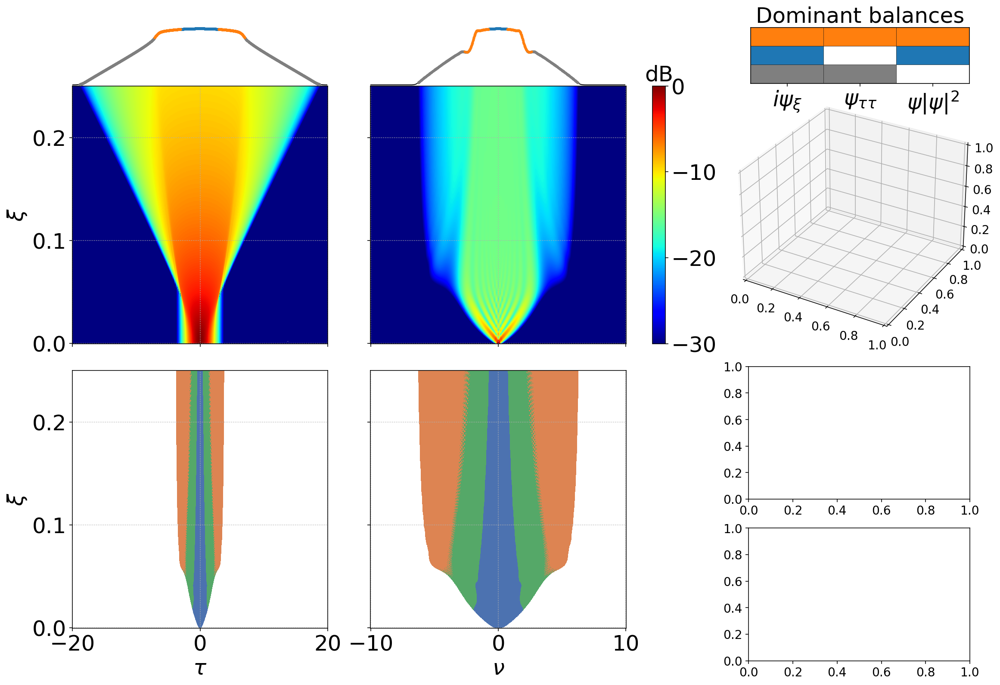

In [75]:
### 3. Final figurefs = 20
K = 1
S = 2
Msize = 2
f_coef = 2 * np.pi * np.sqrt(np.abs(beta2) / (gamma * P0))

x_idx = 999
edge1 = 397
edge2 = 1551

# ext = 1.05
ext = 3

markersize=1
NN = len(features[:, 0])
KK = 0
# col = collections.PolyCollection(<arguments>, rasterized=True)

from mpl_toolkits.axes_grid.inset_locator import inset_axes

# Helper function used for visualization in the following examples
def identify_axes(ax_dict, fontsize=48):
    """
    Helper to identify the Axes in the examples below.

    Draws the label in a large font in the center of the Axes.

    Parameters
    ----------
    ax_dict : dict[str, Axes]
        Mapping between the title / label and the Axes.
    fontsize : int, optional
        How big the label should be.
    """
    kw = dict(ha="center", va="center", fontsize=fontsize, color="darkgrey")
    for k, ax in ax_dict.items():
        ax.text(0.5, 0.5, k, transform=ax.transAxes, **kw)
        
def annotate_axes(ax, text, fontsize=18):
    ax.text(0.5, 0.5, text, transform=ax.transAxes,
            ha="center", va="center", fontsize=fontsize, color="darkgrey")

####################### SETTING UP THE FIGURE LAYOUT #######################

inner = [['innerA'],['innerB']]
outer = [['upper left', 'upper center', 'upper right'],
          ['lower left', 'lower center', inner]]

fig, axd = plt.subplot_mosaic(outer, layout="constrained", gridspec_kw={'wspace': 0.02, 'hspace': 0.02})
axd["upper right"].remove()
axd["upper right"] = fig.add_subplot(2,3,3, projection = '3d')
axd["upper right"].patch.set_alpha(0) 

fig.tight_layout
fig.set_figheight(10)
fig.set_figwidth(16)

####################### FIRST COLUMN FIGURES #######################

ax_ins1 = inset_axes(axd["upper left"], width = '70%', height = 1, loc='upper center',
                   bbox_to_anchor=(-0.214 ,1.2,1.425,0.05), bbox_transform=axd["upper left"].transAxes)
plt.plot(t, np.abs(u[x_idx, :])**2, color = 'black', label='nonlinearity', linewidth= 1)
plt.plot(t[c1], np.abs(u[x_idx, c1])**2, color = '#1f77b4', label='nonlinearity', linestyle='None', marker='o', markersize=Msize)
plt.plot(t[c2], np.abs(u[x_idx, c2])**2, color = '#7f7f7f', label='dispersion', linestyle='None', marker='o', markersize=Msize)
plt.plot(t[c3], np.abs(u[x_idx, c3])**2, color = '#ff7f0e', label='NLSE', linestyle='None', marker='o', markersize=Msize)
# plt.plot(t[c0], np.abs(u[x_idx, c0])**2, 'white', label='zero dynamics', linestyle='None', marker='o', markersize=Msize)
plt.xlim(min(t[edge1:len(t)-edge1 + 1]), max(t[edge1:len(t)-edge1 + 1]))
plt.grid(True, linestyle=':')
plt.axis('off')

it = lambda field: 10*np.log10(abs(field)**2) 
# it = lambda field: abs(field)**2
lIT = it(u); # log scale temporal intensity
mlIT = max(lIT.flatten())     # max value, for scaling plot
im1 = axd["upper left"].pcolormesh(t[edge1:len(t)-edge1 + 1], x * (L_NL/L_D), lIT[:, edge1:len(t)-edge1 + 1],
                                   cmap=colc, vmin=mlIT - TRS, vmax=mlIT, shading='auto')
axd["upper left"].set_xlim(min(t[edge1:len(t)-edge1 + 1]), max(t[edge1:len(t)-edge1 + 1]))
# axd["upper left"].set_ylabel('$\u03BE$', fontsize=fs)
axd["upper left"].set_ylabel('$\u03BE$', fontsize=fs)
axd["upper left"].tick_params(axis='both', labelsize=fs)
axd["upper left"].grid(True, linestyle=':')
axd['upper left'].tick_params(labelbottom=False)


# Extract the relevant portion of the balancemap
subset_balancemap = balancemap[:, edge1:len(t) - edge1 + 1]
im3 = axd['lower left'].pcolormesh(t[edge1:len(t)-edge1 + 1], x * (L_NL/L_D), subset_balancemap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
axd['lower left'].grid(True, linestyle=':')
axd['lower left'].set_xlabel('$\u03C4$', fontsize=fs)
# axd['lower left'].set_ylabel('$\u03BE$', fontsize=fs)
axd['lower left'].set_ylabel('$\u03BE$', fontsize=fs)
axd['lower left'].tick_params(axis='both', labelsize=fs)
axd['lower left'].set_xlim(min(t[edge1:len(t)-edge1 + 1]), max(t[edge1:len(t)-edge1 + 1]))


####################### SECOND COLUMN FIGURES #######################

ax_ins2 = inset_axes(axd["upper center"], width = '70%', height = 1, loc='upper center',
                   bbox_to_anchor=(-0.214 ,1.2,1.425,0.05), bbox_transform=axd["upper center"].transAxes)
plt.plot(f, np.abs(s[x_idx,:])**2, color = 'black', linewidth=1)
plt.plot(f[CCC1], np.abs(s[x_idx, CCC1])**2, color = '#1f77b4', linestyle='None', marker='o', markersize=Msize)
plt.plot(f[CCC2], np.abs(s[x_idx, CCC2])**2, color = '#7f7f7f', linestyle='None', marker='o', markersize=Msize)
plt.plot(f[CCC3], np.abs(s[x_idx, CCC3])**2, color = '#ff7f0e', linestyle='None', marker='o', markersize=Msize)
# plt.plot(f[C0], np.abs(SEc0[C0])**2, 'white', label='zero dynamics', linestyle='None', marker='o', markersize=Msize)
plt.xlim(min(f[edge2:len(f)-edge2 + 1]), max(f[edge2:len(FF)-edge2 + 1]))
plt.grid(True, linestyle=':')
plt.axis('off')

lIT = it1(s); # log scale temporal intensity
# it1 = lambda field: abs(field)**2
mlIT = max(lIT.flatten())     # max value, for scaling plot

im3 = axd['upper center'].pcolormesh(f[edge2:len(f)-edge2 + 1], x * (L_NL/L_D), lIT[:, edge2:len(f)-edge2 + 1],
                                     cmap=colc, vmin=mlIT - 30, vmax=mlIT, shading='auto')
axd['upper center'].grid(True, linestyle=':')
axd['upper center'].tick_params(labelleft=False)
# axd['upper center'].set_xlabel('$(\u03BD - \u03BD_{0})\u03C4_{0}$', fontsize=fs)
axd['upper center'].tick_params(labelbottom=False)
axd['upper center'].tick_params(axis='both', labelsize=fs)
axd['upper center'].set_xlim(min(f[edge2:len(f)-edge2 + 1]), max(f[edge2:len(f)-edge2 + 1]))
# axd['long center'].set_xticks([-10,-5,0,5,10])
cb = fig.colorbar(im3, ax = axd['upper center'], location = 'right')
cb.ax.tick_params(labelsize=fs)
# cb.set_label(label = 'Intensity (dB)', size=fs)
cb.ax.set_title('dB', size=fs)
cb.set_ticks([0,-10,-20,-30])



subset_Sbalancemap = Sbalancemap[:, edge2:len(f)-edge2 + 1]
im2 = axd['lower center'].pcolormesh(f[edge2:len(f)-edge2 + 1], x * (L_NL/L_D), subset_Sbalancemap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
axd['lower center'].grid(True, linestyle=':')
axd['lower center'].set_xlabel('$\u03BD$', fontsize=fs)
axd['lower center'].tick_params(labelleft=False, axis='both', labelsize=fs)
axd['lower center'].set_xlim(min(f[edge2:len(f)-edge2 + 1]), max(f[edge2:len(f)-edge2 + 1]))


# ####################### THIRD COLUMN FIGURES #######################

ax_ins = inset_axes(axd["upper right"], width = '60%', height = 0.9, loc='upper center',
                   bbox_to_anchor=(-0.18,1.2,1.425,0.05), bbox_transform=axd["upper right"].transAxes)
plt.pcolor(gridmap1, vmin=-0.5, vmax=cm1.N-0.5, cmap=cm1, edgecolors='k'); 
plt.title('Dominant balances', fontsize=fs)
plt.xticks([0.5, 1.5, 2.5], ['$i \u03C8_{\u03BE}$','$\u03C8_{\u03C4 \u03C4}$', '$\u03C8|\u03C8|^2$'], fontsize=fs)
# plt.yticks([0.5, 1.5, 2.5], ['C1','C2','C3'], fontsize=fs)
plt.tick_params(labelleft=False, axis='y')  # Disable ticks on the y-axis
plt.yticks([])


axd["upper right"].scatter(features_full[:,:,0].flatten()[::kk], features_full[:,:,1].flatten()[::kk], -features_full[:,:,2].flatten()[::kk], c=MU/255, s=10)
# axd["upper right"].scatter([],[],[])
axd["upper right"].set_xlabel('$Re(i \u03C8_\u03BE)$', fontsize=fs)
axd["upper right"].set_ylabel('$Re(\u03C8_{\u03C4 \u03C4})$', fontsize=fs)
axd["upper right"].set_zlabel('$Re(\u03C8|\u03C8|^2)$', fontsize=fs)
axd["upper right"].view_init(20, 115)
axd["upper right"].tick_params(axis = 'both', labelsize=fs)
axd["upper right"].set_xticks([])
axd["upper right"].set_yticks([])
axd["upper right"].set_zticks([])


scf = axd['innerA'].scatter(features_full[:,:,0].flatten()[idx_1], features_full[:,:,2].flatten()[idx_1], color = '#1f77b4', s = S)
axd['innerA'].scatter(features_full[:,:,0].flatten()[idx_3], features_full[:,:,2].flatten()[idx_3], color = '#ff7f0e', s = S)
axd['innerA'].scatter(features_full[:,:,0].flatten()[idx_2], features_full[:,:,2].flatten()[idx_2], color = '#7f7f7f', s = S)
# axd['innerA'].set_xlabel('$Re(i \u03C8_\u03BE)$', fontsize=fs)
axd['innerA'].set_ylabel('$Re(\u03C8|\u03C8|^2)$', fontsize=fs)
axd['innerA'].set_xlim(-ext, ext)
axd['innerA'].set_ylim(-ext, ext)
axd['innerA'].grid(which='major', linestyle=':')
axd['innerA'].tick_params(labelbottom=False, axis = 'both', labelsize=fs)
scf.set_clim([-0.5, cm.N-0.5])


scd = axd['innerB'].scatter(features_full[:,:,0].flatten()[idx_1], features_full[:,:,1].flatten()[idx_1], color = '#1f77b4', s = S)
axd['innerB'].scatter(features_full[:,:,0].flatten()[idx_3], features_full[:,:,1].flatten()[idx_3], color = '#ff7f0e', s = S)
axd['innerB'].scatter(features_full[:,:,0].flatten()[idx_2], features_full[:,:,1].flatten()[idx_2], color = '#7f7f7f', s = S)
axd['innerB'].set_xlabel('$Re(i \u03C8_\u03BE)$', fontsize=fs)
axd['innerB'].set_ylabel('$Re(\u03C8_{\u03C4 \u03C4})$', fontsize=fs)
axd['innerB'].set_xlim(-ext, ext)
axd['innerB'].set_ylim(-ext, ext)
axd['innerB'].grid(which='major', linestyle=':')
axd['innerB'].tick_params(axis = 'both', labelsize=fs)
scd.set_clim([-0.5, cm.N-0.5])



axd['upper left'].text(0.03, 0.03, '(a)', transform=axd['upper left'].transAxes, size=fs, color = 'white')
axd['upper center'].text(0.03, 0.03, '(b)', transform=axd['upper center'].transAxes, size=fs, color = 'white')
# axd['upper right'].text(0.03, 0.03, '(c)', transform=axd['upper right'].transAxes, size=fs, color = 'black')
axd['innerA'].text(0.04, 0.08, '(ii)', transform=axd['innerA'].transAxes, size=fs, color = 'black')
axd['innerB'].text(0.04, 0.08, '(iii)', transform=axd['innerB'].transAxes, size=fs, color = 'black')
axd['lower left'].text(0.03, 0.03, '(d)', transform=axd['lower left'].transAxes, size=fs, color = 'black')
axd['lower center'].text(0.03, 0.03, '(e)', transform=axd['lower center'].transAxes, size=fs, color = 'black')


plt.savefig('OWB_Final.png', bbox_extra_artists=(ax_ins,), bbox_inches='tight', dpi = 450)
# plt.savefig('OWB_new.pdf', bbox_extra_artists=(ax_ins,), bbox_inches='tight')

plt.show()

# V. Spectrogram and other tools

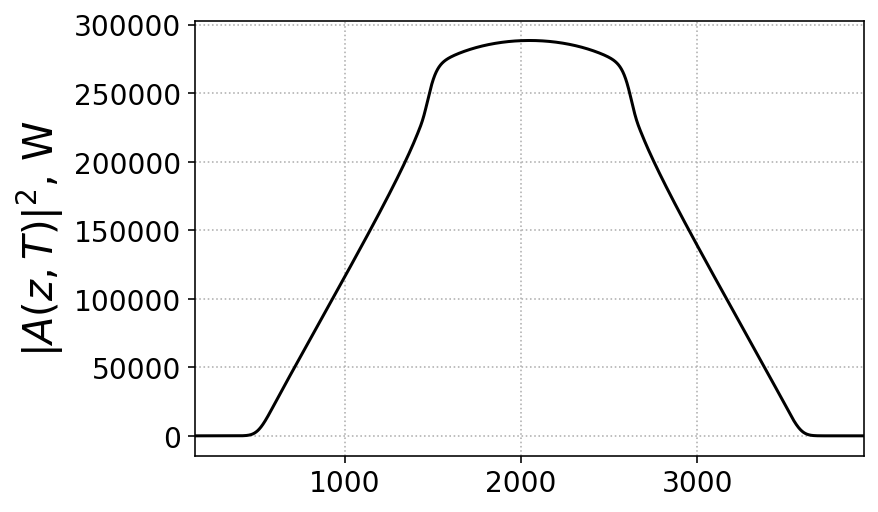

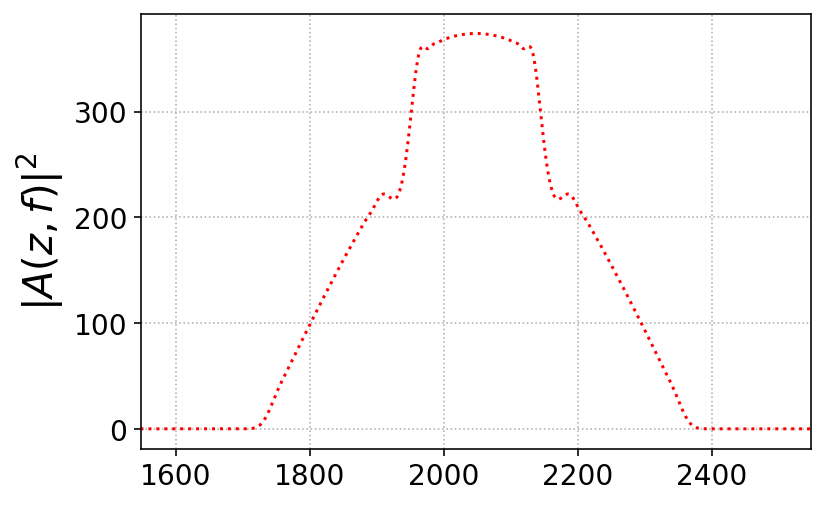

148
158
168
178
188
198
208
218
228
238
248
258
268
278
288
298
308
318
328
338
348
358
368
378
388
398
408
418
428
438
448
458
468
478
488
498
508
518
528
538
548
558
568
578
588
598
608
618
628
638
648
658
668
678
688
698
708
718
728
738
748
758
768
778
788
798
808
818
828
838
848
858
868
878
888
898
908
918
928
938
948
958
968
978
988
998
1008
1018
1028
1038
1048
1058
1068
1078
1088
1098
1108
1118
1128
1138
1148
1158
1168
1178
1188
1198
1208
1218
1228
1238
1248
1258
1268
1278
1288
1298
1308
1318
1328
1338
1348
1358
1368
1378
1388
1398
1408
1418
1428
1438
1448
1458
1468
1478
1488
1498
1508
1518
1528
1538
1548
1558
1568
1578
1588
1598
1608
1618
1628
1638
1648
1658
1668
1678
1688
1698
1708
1718
1728
1738
1748
1758
1768
1778
1788
1798
1808
1818
1828
1838
1848
1858
1868
1878
1888
1898
1908
1918
1928
1938
1948
1958
1968
1978
1988
1998
2008
2018
2028
2038
2048
2058
2068
2078
2088
2098
2108
2118
2128
2138
2148
2158
2168
2178
2188
2198
2208
2218
2228
2238
2248
2258
2268
2278
2288
2298
2308
2

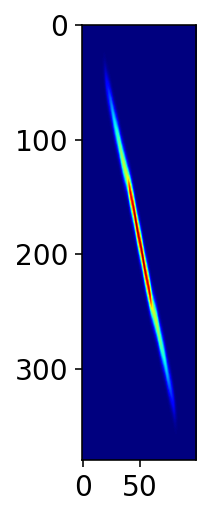

In [236]:
# V. Spectrogram and other tools#Computing the spectrogram
x_idx = 999
t_min = 148
t_max = 3948
f_min = 1548
f_max = 2548

plt.plot(np.abs(AAt[x_idx])**2, 'black', label = 'wavefront')
plt.xlim(t_min, t_max)
# plt.xlabel('T (ps)')
plt.ylabel('$|A(z,T)|^2$, W')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')
plt.show()

plt.plot(np.abs(AAf[x_idx])**2, 'red', linestyle = ':')
plt.xlim(f_min,f_max)
# plt.xlabel('Frequency (THz)')
plt.ylabel('$|A(z,f)|^2$')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')
plt.show()

S = np.zeros((len(TT),len(WW)))
for i in range(t_min, t_max, 10):
    print(i)
    Aref = np.sqrt(P0) * np.exp(-(TT - TT[i])**2 / (2 * T0**2))
    for j in range(f_min, f_max, 10):
        S[i,j] = dT**2 * np.abs(np.sum(AAt[x_idx] * Aref * np.exp(1j * WW[j] * TT)))**2
plt.imshow(S[t_min:t_max:10,f_min:f_max:10], cmap = colc)
plt.show()

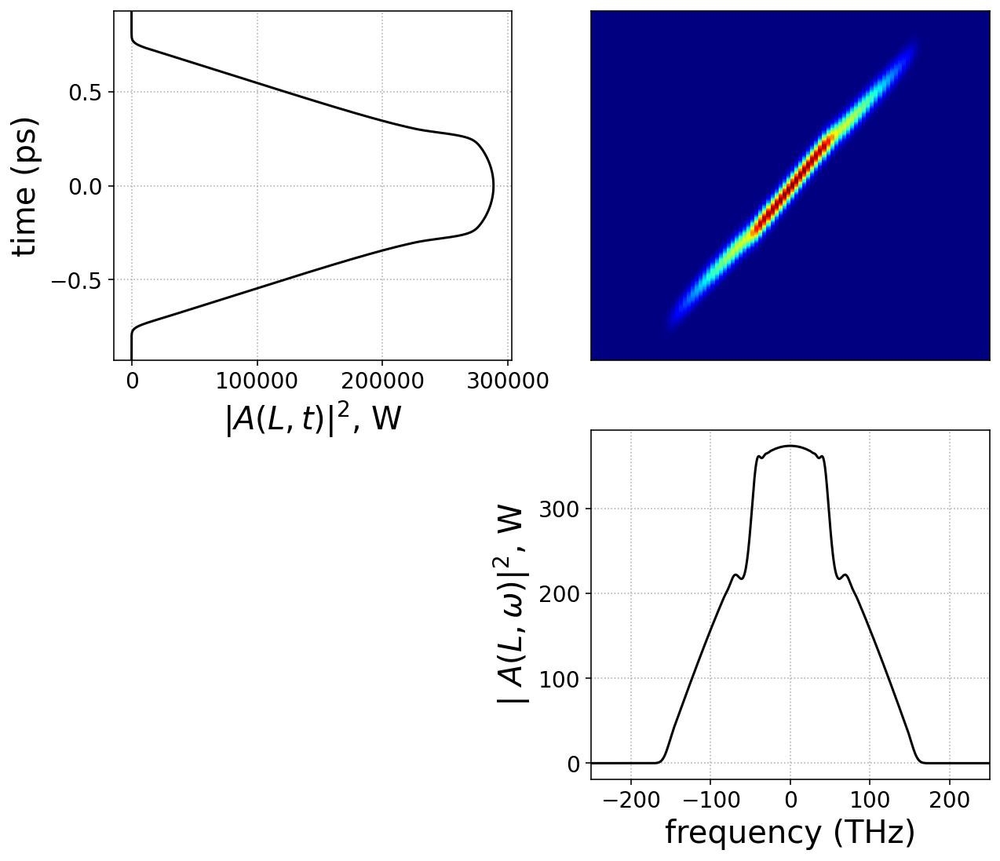

In [238]:
# fid, axs = plt.subplots(2,2, figsize = (10,5))
plt.figure(figsize=(10, 9))
plt.subplot(221)
plt.plot(np.abs(AAt[x_idx])**2, TT * 10**12, 'black', label = 'wavefront')
plt.ylim(TT[t_min] * 10**12, TT[t_max] * 10**12)
plt.ylabel('time (ps)')
plt.xlabel('$|A(L,t)|^2$, W')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')

plt.subplot(222)
# plt.imshow(S[t_min:t_max,f_min:f_max], cmap = colc, aspect = "auto")
plt.pcolormesh(FF[f_min:f_max:10] * 10**(-12), TT[t_min:t_max:10] * 10**12, S[t_min:t_max:10,f_min:f_max:10], shading='auto', cmap='jet')
plt.tick_params( labelleft = False, labelbottom = False, left = False, bottom = False)
# plt.ylim([WW[f_min],WW[f_max]])
# plt.xlim(TT[t_min], TT[t_max])

plt.subplot(224)
plt.plot(FF * 10**(-12), np.abs(AAf[x_idx])**2,'black')
plt.xlim(FF[f_min]* 10**(-12),FF[f_max]* 10**(-12))
plt.xlabel('frequency (THz)')
plt.ylabel('$|~{A(L,\u03C9)}|^2$, W')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')
plt.show()

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


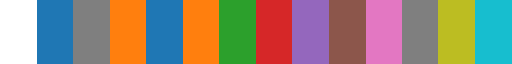

In [206]:
# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#1f77b4')  # Insert white at zero position
sns_list.insert(2, '#7f7f7f')  # Insert white at zero position
sns_list.insert(3, '#ff7f0e')  # Insert white at zero position

sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())
cm

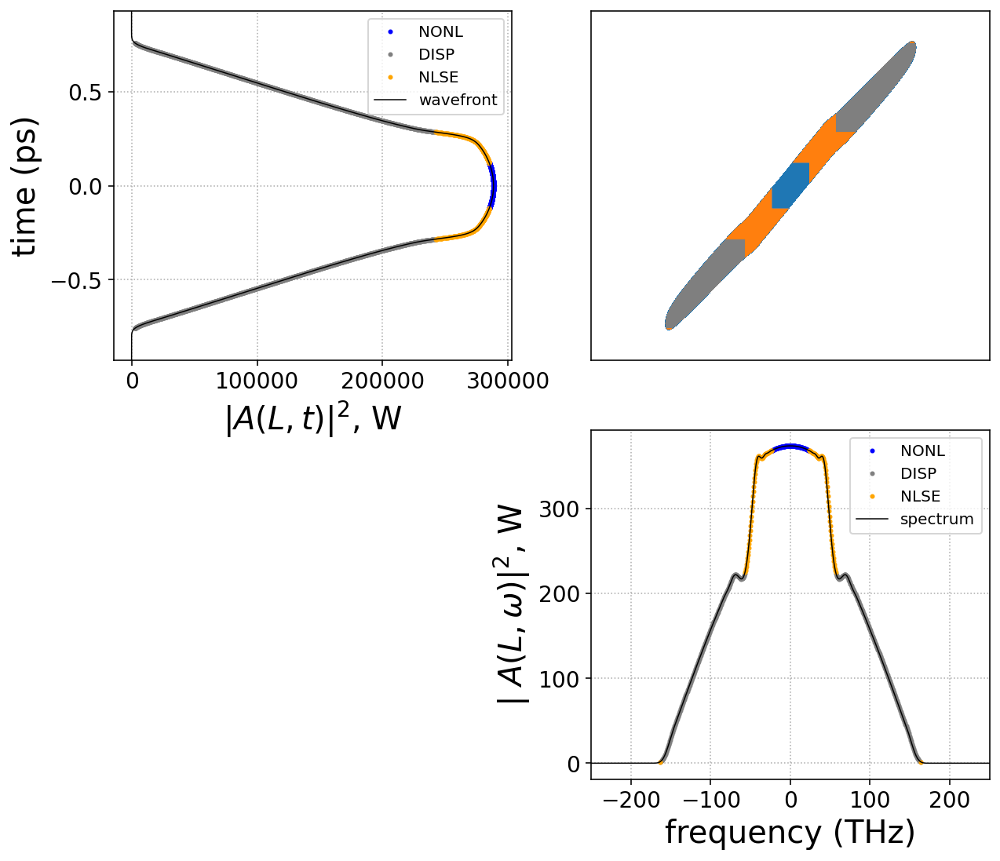

In [224]:
Spectrogram = np.zeros((len(TT),len(WW)))
trs = 10**(-15) / 10
for i in range(t_min, t_max):
    for j in range(f_min, f_max):
        if S[i,j] > trs:
            if balancemap[x_idx, i] == Sbalancemap[x_idx, j]:
                Spectrogram[i,j] = balancemap[x_idx, i]
            else:
                Spectrogram[i,j] = 3

plt.figure(figsize=(10, 9))

ind1 = np.nonzero(np.abs(Ec1)**2)
ind2 = np.nonzero(np.abs(Ec2)**2)
ind3 = np.nonzero(np.abs(Ec3)**2)
ind0 = np.nonzero(np.abs(Ec0)**2)

Ind1 = np.nonzero(np.abs(SEc1)**2)
Ind2 = np.nonzero(np.abs(SEc2)**2)
Ind3 = np.nonzero(np.abs(SEc3)**2)
Ind0 = np.nonzero(np.abs(SEc0)**2)
Msize = 2


plt.subplot(221)
plt.plot(np.abs(AAt[x_idx,c1])**2, TT[c1] * 10**(12), color = 'blue', label = 'NONL', linestyle='None', marker='o', markersize = Msize)
plt.plot(np.abs(AAt[x_idx,c2])**2, TT[c2] * 10**(12), color = 'gray', label = 'DISP', linestyle='None', marker='o', markersize = Msize)
plt.plot(np.abs(AAt[x_idx,c3])**2, TT[c3] * 10**(12), color = 'orange', label = 'NLSE', linestyle='None', marker='o', markersize = Msize)
# plt.plot(np.abs(AAt[x_idx,c0])**2, TT[c0] * 10**(12), color = 'white', label = 'zero dynamics', linestyle='None', marker='o', markersize = Msize)
plt.plot(np.abs(AAt[x_idx])**2, TT * 10**(12), label = 'wavefront', color='black', linewidth=0.75)
plt.ylim(TT[t_min] * 10**12, TT[t_max] * 10**12)
plt.ylabel('time (ps)')
plt.xlabel('$|A(L,t)|^2$, W')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')
plt.legend()

plt.subplot(222)
plt.imshow(Spectrogram[t_min:t_max, f_min:f_max], cmap=cm, aspect='auto', vmin=-0.5, vmax=cm.N-0.5, origin='lower')
plt.tick_params( labelleft = False, labelbottom = False, left = False, bottom = False)


plt.subplot(224)
plt.plot(FF[CCC1] * 10**(-12), np.abs(AAf[x_idx,CCC1])**2, color = 'blue', label = 'NONL', linestyle='None', marker='o', markersize = Msize)
plt.plot(FF[CCC2] * 10**(-12), np.abs(AAf[x_idx,CCC2])**2, color = 'gray', label = 'DISP', linestyle='None', marker='o', markersize = Msize)
plt.plot(FF[CCC3] * 10**(-12), np.abs(AAf[x_idx,CCC3])**2, color = 'orange', label = 'NLSE', linestyle='None', marker='o', markersize = Msize)
# plt.plot(WW[Ind0] * 10**(-12), np.abs(AAf[Ind0])**2, color = 'white', label = 'zero dynamics', linestyle='None', marker='o', markersize = Msize)
plt.plot(FF * 10**(-12), np.abs(AAf[x_idx])**2, label = 'spectrum', color='black', linewidth = 0.75)


# plt.plot(FF * 10**(-12), np.abs(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(Ec0 + Ec1 + Ec2))))**2, 'red', linestyle = ':', label = 'NLSE')

plt.xlabel('frequency (THz)')
plt.ylabel('$|~{A(L,\u03C9)}|^2$, W')
# plt.title(f'z = {10 * x_idx * dz / L_NL} (Nonl. Len.)')
plt.grid('True',linestyle = ':')
plt.xlim(FF[f_min]* 10**(-12),FF[f_max]* 10**(-12))
plt.legend()
plt.show()

In [186]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt
# featuremap[:, :, -2] = uttt
featuremap[:, :, -1] = uuu

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))
labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

(1000, 4096, 6)


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


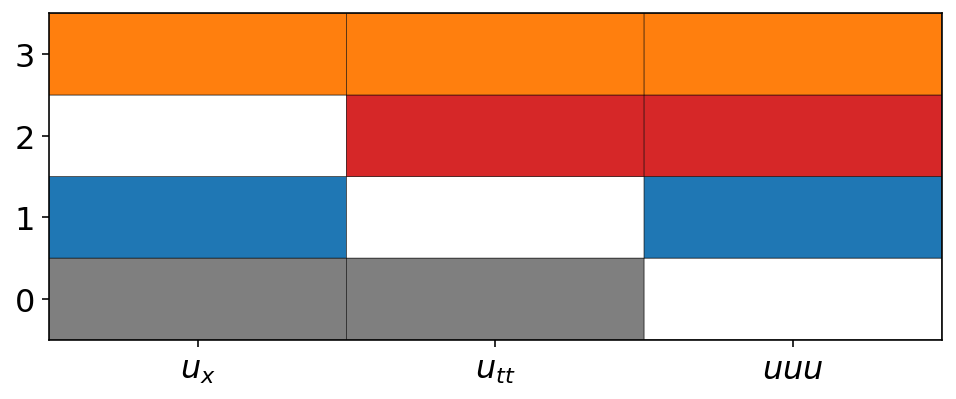

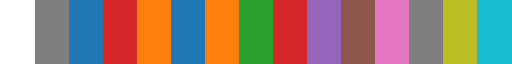

In [187]:
import matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#7f7f7f')  # Insert white at zero position
sns_list.insert(2, '#1f77b4')  # Insert white at zero position
sns_list.insert(3, '#d62728')  # Insert white at zero position
sns_list.insert(4, '#ff7f0e')  # Insert white at zero position
'#1f77b4'
sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,1,0],[1,0,1],[0,1,1],[1,1,1]])

nmodels = 4
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

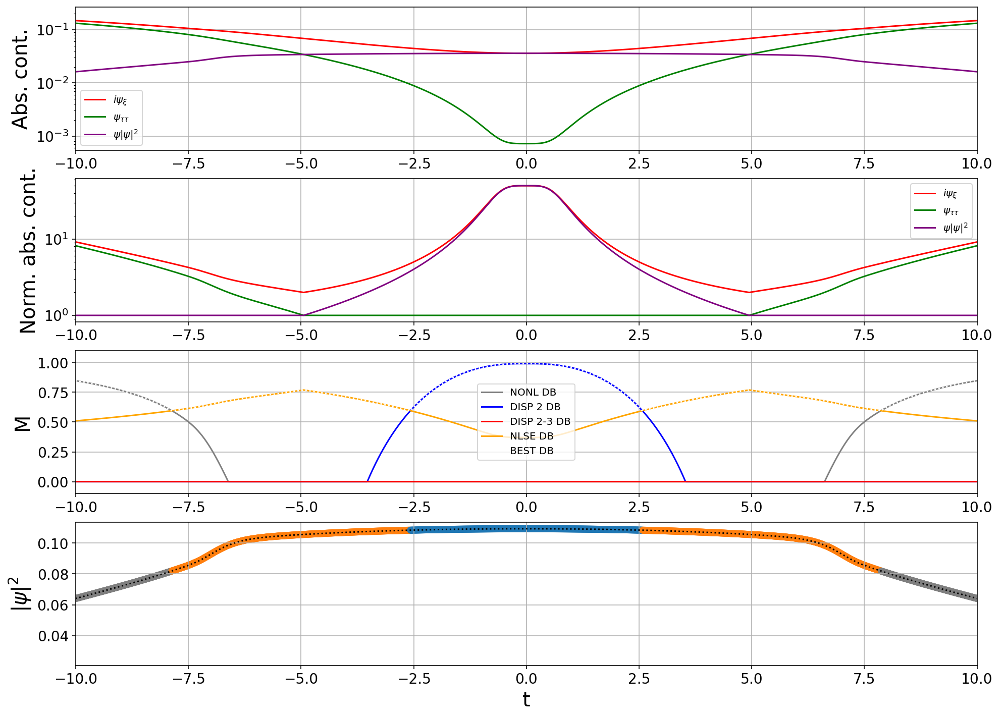

In [188]:
from IPython import display
import time
import math 

S = 5
trs = 0.025 #set up the field threshold value
num_models = len(balance_models) #number of considred dominant balance models
MAP2D = [] #allocating the array for balance_map
MGN2D = [] #allocating the array for M score for each point on the balance_map

for ind in range(0, 1000, 1): #SCAN THROUGH ALL z
    display.clear_output(wait = True)
#     print(ind)

    MAP1D = [] #1d balance_map for the best possible mgn at fixed z
    MGN = [] #array for the best possible mgn at fixed z
    map1d = np.zeros(len(t)) #zero 1d arrays over t to add te non-zero balance_map values
    mgn1d = np.zeros(len(t)) #zero 1d arrays over t to add te non-zero mgn values
    #These arrays serve to store mgn values for all the considered dominant balances:
    MGN1, MGN2, MGN3, MGN4 = [],[],[],[]

    cc = np.where(np.abs(u[ind])**2 > trs) #Find the indices of the spatio-teporal map where the field is above the trs
    
    #Constructing the corresponding matix at given z for the terms in the region where the field > trs:
    M1 =  np.vstack([np.sqrt(features_full[ind,cc, 0]**2 + features_full[ind,cc, 3]**2).flatten(), 
                     np.sqrt(features_full[ind,cc, 1]**2 + features_full[ind,cc, 4]**2).flatten(), 
                     np.sqrt(features_full[ind,cc, 2]**2 + features_full[ind,cc, 5]**2).flatten()])
    M = M1 / M1.min(axis=0) #Normalise the data
    l = np.shape(M)[1] #Length of the 1d array in t at fixed z where the field > trs
        
    #How well a point corresponds to a particular dominant balance?
    for i in range(l):
        MGN_dict = {}
        for model_index in range(num_models-1):
            slc = M[:, i] * balance_models[model_index]
            trc = M[:, i] * (1 - balance_models[model_index])
            maxS = np.max(slc[np.nonzero(slc)])
            minS = np.min(slc[np.nonzero(slc)])
            maxT = np.max(trc[np.nonzero(trc)])

            if minS - maxT < 1:
                gn = 0
            else:
                gn = np.log10(minS - maxT) / np.log10(minS + maxT)
            sigma = np.log10(maxS) - np.log10(minS)
            mgn = gn / (1 + sigma)

            MGN_dict[f'MGN{model_index + 1}'] = np.append(MGN_dict.get(f'MGN{model_index + 1}', []), mgn)
            
        #The full dynamical cluster is computed separately
        gn = 1
        sigma = np.log10(max(M[:,i])) - np.log10(min(M[:,i]))
        mgn4 = gn / (1 + sigma)
        MGN4 = np.append(MGN4, mgn4)

        # Add the following lines to create separate variables for each mgn
        mgn_array = np.append(np.array([float(value) for value in MGN_dict.values()]), mgn4)
        #Add mgn values to the arrays MGN
        MGN1 =  np.append(MGN1, mgn_array[0])
        MGN2 =  np.append(MGN2, mgn_array[1])
        MGN3 =  np.append(MGN3, mgn_array[2])
#         MGN4 =  np.append(MGN4, mgn_array[3])
#         MGN5 =  np.append(MGN5, mgn_array[4])
#         MGN6 =  np.append(MGN6, mgn_array[5])  
        
        #FINDING THE INDEX OF THE HIGHEST mgn in a list and add this to the MGN - the best possible db
        max_index = np.argmax(mgn_array) + 1  # Adding 1 to match index starting from 1
        MAP1D = np.append(MAP1D, max_index)
        MGN = np.append(MGN, mgn_array[max_index - 1])  # Subtracting 1 to get the correct index in the array
        
        
####################### DISPLAY #######################     
            
        
    plt.figure(figsize=(16, 12));
    plt.subplot(4,1,4)
    plt.plot(t[cc], np.abs(u[ind, cc].flatten())**2, color = 'black', linestyle = ':')
    scatter = plt.scatter(t[cc], np.abs(u[ind, cc])**2, c = MAP1D, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
    plt.grid('True')
    plt.ylabel('$|\u03C8|^{2}$')
    plt.xlim(-10,10)
    plt.xlabel('t')
    
    plt.subplot(4,1,1)
    plt.semilogy(t[cc], np.asarray(M1[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
    plt.semilogy(t[cc], np.asarray(M1[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
    plt.semilogy(t[cc], np.asarray(M1[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     plt.ylim((10**(-4), 1))
    plt.xlim(-10,10)
    plt.legend()
    plt.grid('True')
    plt.ylabel('Abs. cont.')

    plt.subplot(4,1,2)
    plt.semilogy(t[cc], np.asarray(M[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
    plt.semilogy(t[cc], np.asarray(M[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
    plt.semilogy(t[cc], np.asarray(M[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     plt.ylim((10**(-4), 1))
    plt.xlim(-10,10)
    plt.legend()
    plt.grid('True')
    plt.ylabel('Norm. abs. cont.')
    
    plt.subplot(4,1,3)
    plt.plot(t[cc], MGN1, color = 'gray', label = 'NONL DB')
    plt.plot(t[cc], MGN2, color = 'blue', label = 'DISP 2 DB')
    plt.plot(t[cc], MGN3, color = 'red', label = 'DISP 2-3 DB')
    plt.plot(t[cc], MGN4, color = 'orange', label = 'NLSE DB')
#     plt.plot(t[cc], MGN5, color = 'aqua', label = 'nonsense#1')
#     plt.plot(t[cc], MGN6, color = 'brown', label = 'nonsense#2')
#     plt.plot(t[cc], MGN7, color = 'red', label = 'FULL DB')
#     plt.plot(t[cc], MGN8, color = 'purple', label = 'nonsense#3')
#     plt.plot(t[cc], MGN9, color = 'black', label = 'nonsense#4')
#     plt.plot(t[cc], MGN10, color = 'black', label = 'nonsense#5')
#     plt.plot(t[cc], MGN11, color = 'black', label = 'nonsense#4')
    plt.plot(t[cc], MGN, color = 'white', linestyle = ':', label = 'BEST DB')
    plt.legend()
    plt.grid('True')
    plt.ylabel('M')
    plt.xlim(-10,10)
    plt.ylim(-0.1,1.1)
    plt.show()
    
    map1d[cc] = MAP1D
    mgn1d[cc] = MGN
    MAP2D = np.append(MAP2D, map1d)
    MGN2D = np.append(MGN2D, mgn1d)

0.8092764329788399


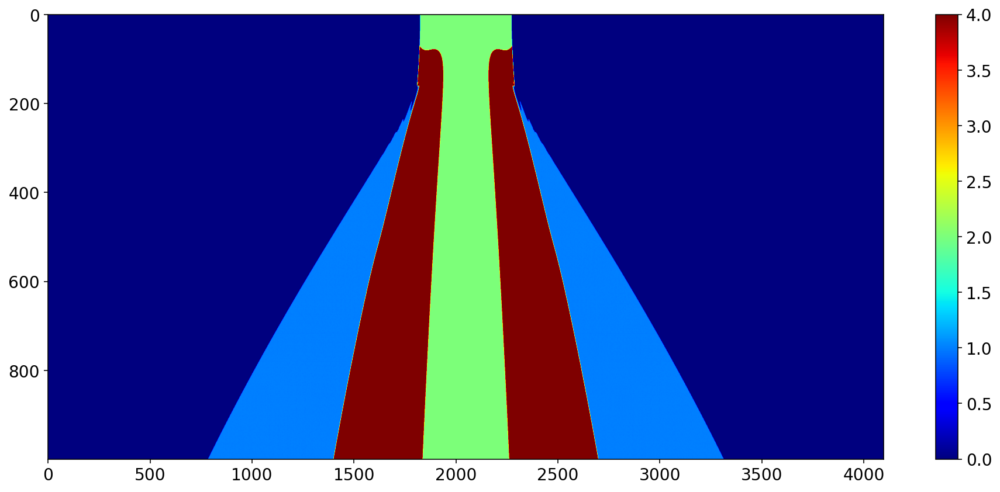

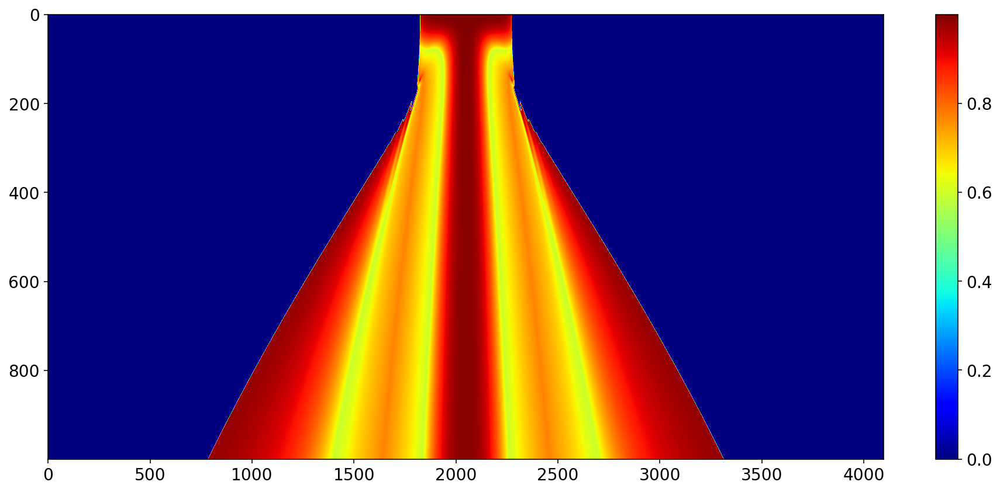

In [190]:
#Computing the total score
print(np.sum(MGN2D[np.nonzero(MGN2D)])/len(MGN2D[np.nonzero(MGN2D)]))
# print(len(MGN2D))
MGN3D = np.reshape(MGN2D, (1000, 2 * 2048))
MAP3D = np.reshape(MAP2D, (1000, 2 * 2048))


plt.figure(figsize=(16, 7));
plt.imshow(MAP3D, cmap = 'jet', aspect = 'auto')
plt.colorbar()
plt.show()

plt.figure(figsize=(16, 7));
plt.imshow(MGN3D, cmap = 'jet', aspect = 'auto')
plt.colorbar()
plt.show()

In [230]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in list(
                          locals().items())), key= lambda x: -x[1])[:30]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                    featuremap: 93.8 MiB
                 features_full: 93.8 MiB
                           AAt: 62.5 MiB
                           AAf: 62.5 MiB
                             u: 62.5 MiB
                             s: 62.5 MiB
                            ux: 62.5 MiB
                           utt: 62.5 MiB
                           uuu: 62.5 MiB
                             U: 62.5 MiB
                            Ux: 62.5 MiB
                           Utt: 62.5 MiB
                           UUU: 62.5 MiB
                      features: 35.9 MiB
                            Ip: 31.3 MiB
                         Ip_TF: 31.3 MiB
                           lIT: 31.3 MiB
                    balancemap: 31.3 MiB
                    CLUSTERMAP: 31.3 MiB
                   Sbalancemap: 31.3 MiB
                   balance_idx: 31.3 MiB
                   cluster_idx: 12.0 MiB
                         idx_2:  5.8 MiB
                          mask:  3.9 MiB
                

In [231]:
del featuremap

# EXPERIMENTS WITH CLUSTERING

## Really simple 2D example

In [193]:
# Generate some data
from sklearn.datasets import make_blobs
X, y_true = make_blobs(n_samples=1000, centers=10, cluster_std=5, random_state=0)
X = X[:, ::-1] # flip axes for better plotting

<IPython.core.display.Javascript object>


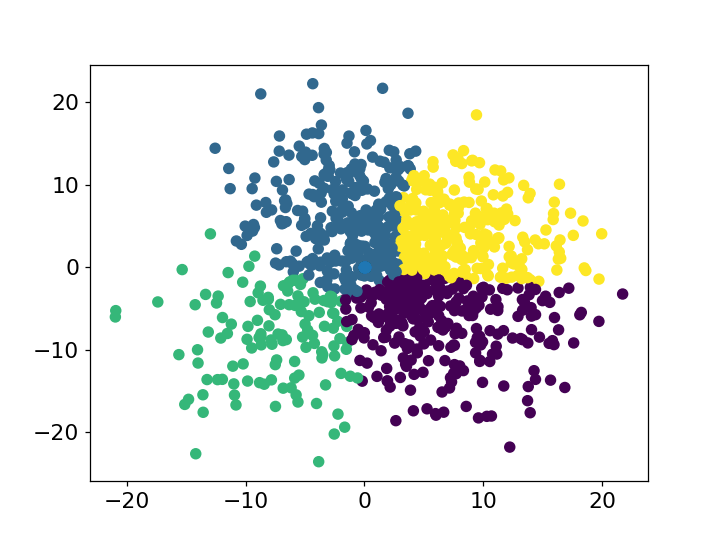

In [195]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=4).fit(X)
labels = gmm.predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis')
plt.show()

In [263]:
# Build feature library
nfeatures = 2 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

# featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt# Performing the dominant balance analysis in time domain### 1. Constructing the feature matrix 
featuremap[:, :, -1] = uuu

labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

# Downsample for building model
shift_x, shift_t = 10, 10
tmin = 0

x0 = np.arange(0, len(x), shift_x)
t0 = np.arange(tmin, len(t), shift_t)
featuremap = featuremap[x0, :, :]
featuremap = featuremap[:, t0, :]

# Leave out near-zero field values (numerical noise and essentially zero dynamics)
lIT = it(u)
lIT = lIT[x0, :]
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT - TRS

features = np.reshape(featuremap, [len(x0)*len(t0), nfeatures], order='F')
features = features[mask.flatten('F'), :]

# Treat real/imag as separate features
# features = np.hstack((np.real(features), np.imag(features)))
features = np.real(features)

print(np.shape(features))

# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5

(15563, 2)


c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


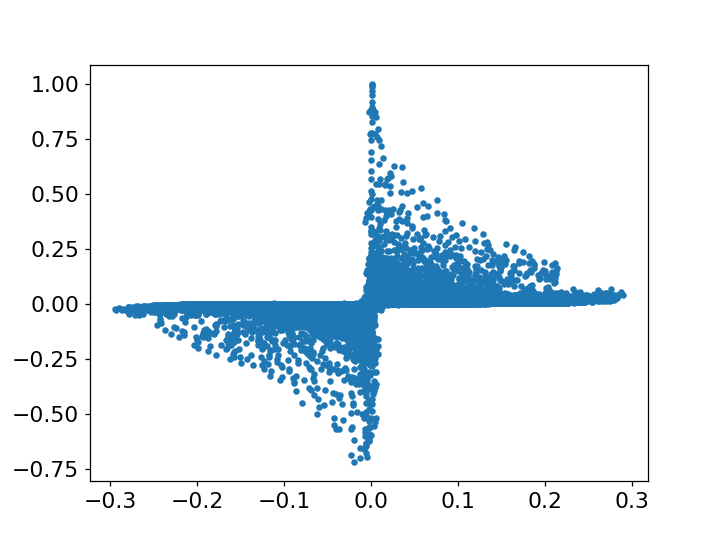

In [264]:
plt.scatter(features[:, 0], features[:, 1], s=10)
plt.show()

<IPython.core.display.Javascript object>


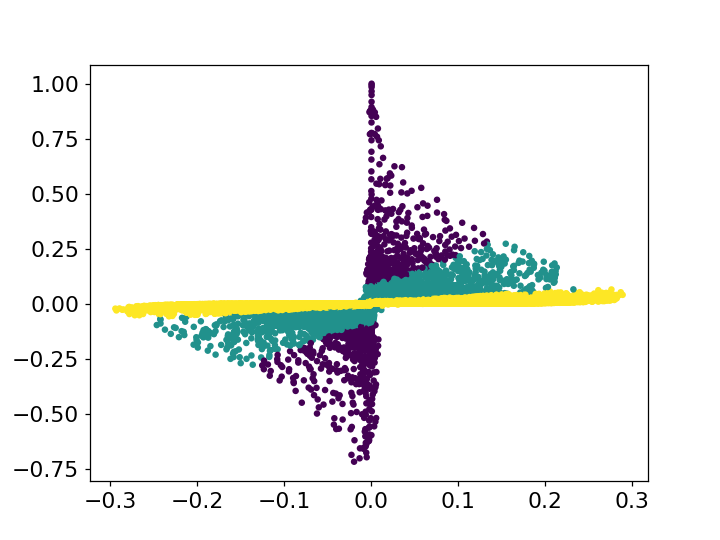

In [265]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3).fit(features)
labels = gmm.predict(features)
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()

In [266]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=1, cmap='viridis', zorder=2)
#         print('haha')
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
#     ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

<IPython.core.display.Javascript object>


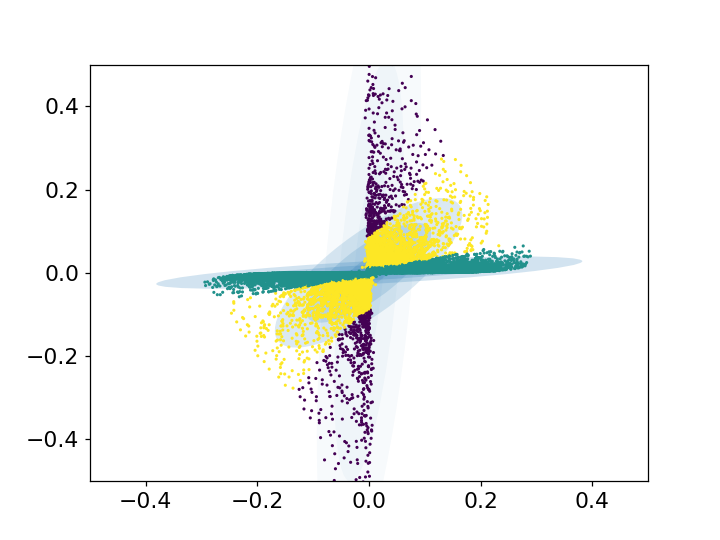

In [267]:
ext = 0.5
gmm = GaussianMixture(n_components=3, random_state=42)
plot_gmm(gmm, features)
plt.xlim(-ext,ext)
plt.ylim(-ext,ext)
plt.show()

<IPython.core.display.Javascript object>


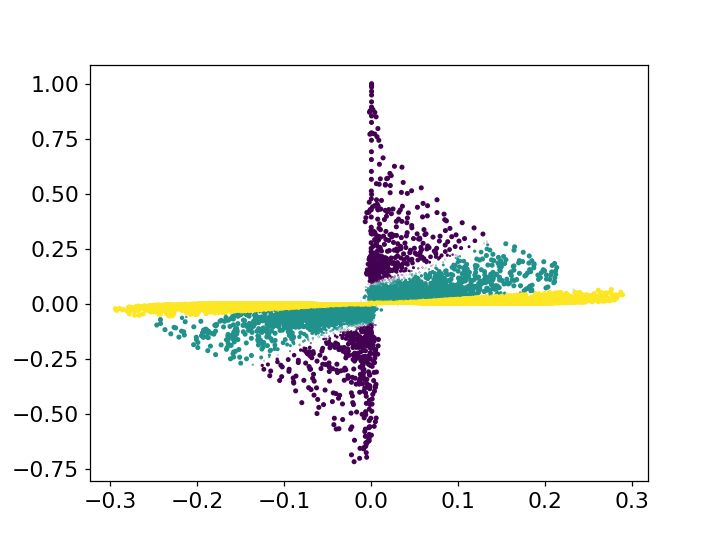

In [290]:
probs = gmm.predict_proba(features)
size = 5 * probs.max(1) ** 10  # square emphasizes differences
plt.scatter(features[:, 0], features[:, 1], c=labels, cmap='viridis', s=size)
plt.show()

In [282]:
print(probs)
print(max(probs.flatten()))
print(min(probs.flatten()))
print(size)

[[2.03755455e-02 6.87030148e-01 2.92594307e-01]
 [1.23636174e-03 9.16991579e-01 8.17720593e-02]
 [7.78854594e-03 7.98595646e-01 1.93615808e-01]
 ...
 [1.53814450e-02 7.24260003e-01 2.60358552e-01]
 [8.33555920e-04 9.30948232e-01 6.82182118e-02]
 [1.62984847e-02 7.16212988e-01 2.67488528e-01]]
1.0
0.0
[0.02342923 0.42039106 0.10550411 ... 0.03971413 0.48893972 0.03551583]


<IPython.core.display.Javascript object>


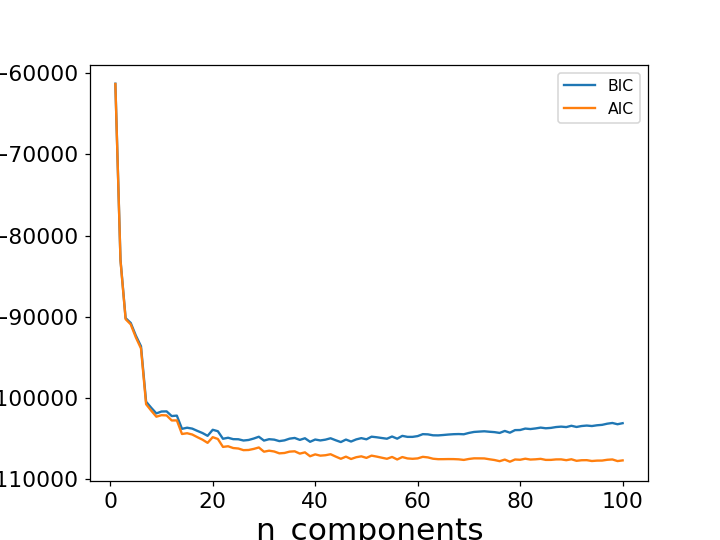

In [293]:
n_components = np.arange(1, 101)
models = [GaussianMixture(n).fit(features) for n in n_components]

plt.plot(n_components, [m.bic(features) for m in models], label='BIC')
plt.plot(n_components, [m.aic(features) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

## Try different clustering methods 

<IPython.core.display.Javascript object>


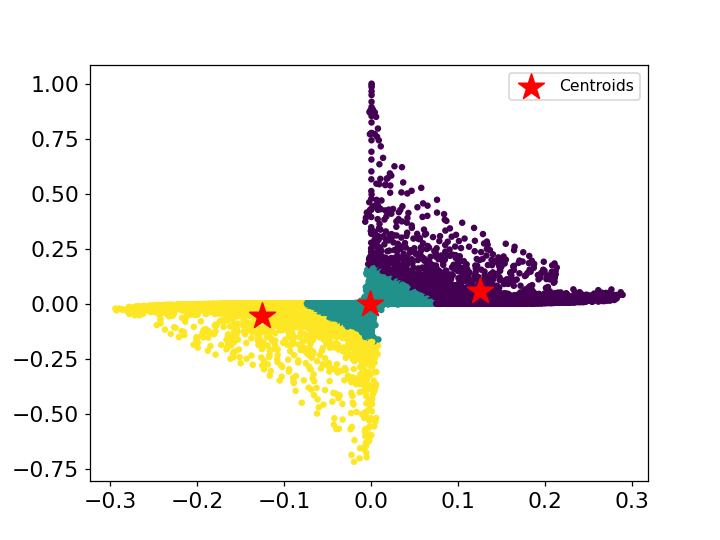

In [255]:
from sklearn.cluster import KMeans  # Import KMeans from scikit-learn
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Assuming 'features' is your feature matrix

# Instantiate KMeans with specified number of clusters
kmeans = KMeans(n_clusters=3)

# Fit the KMeans model to the data and predict cluster labels
labels = kmeans.fit_predict(features)

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', marker='*', label='Centroids')
plt.legend()
plt.show()  # Show the plot

<IPython.core.display.Javascript object>


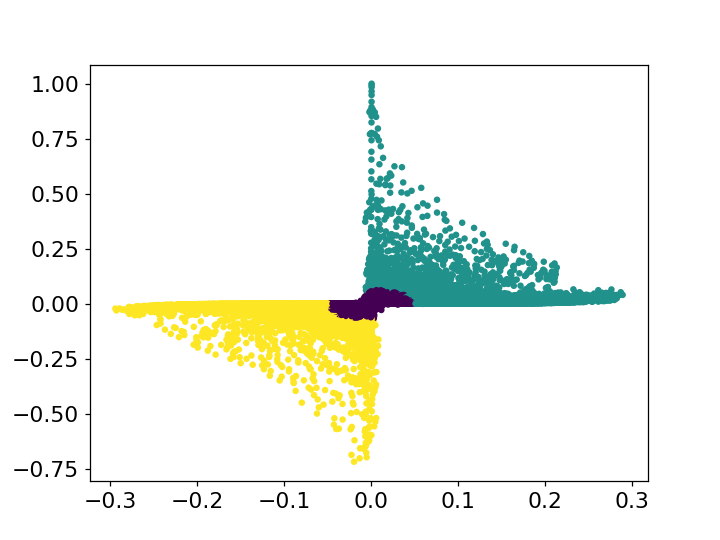

In [256]:
from sklearn.cluster import SpectralClustering  # Import SpectralClustering from scikit-learn
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Assuming 'features' is your feature matrix

# Instantiate SpectralClustering with specified number of clusters
spectral_clustering = SpectralClustering(n_clusters=3, affinity='nearest_neighbors', n_neighbors=10)

# Fit the SpectralClustering model to the data and predict cluster labels
labels = spectral_clustering.fit_predict(features)

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()  # Show the plot

<IPython.core.display.Javascript object>


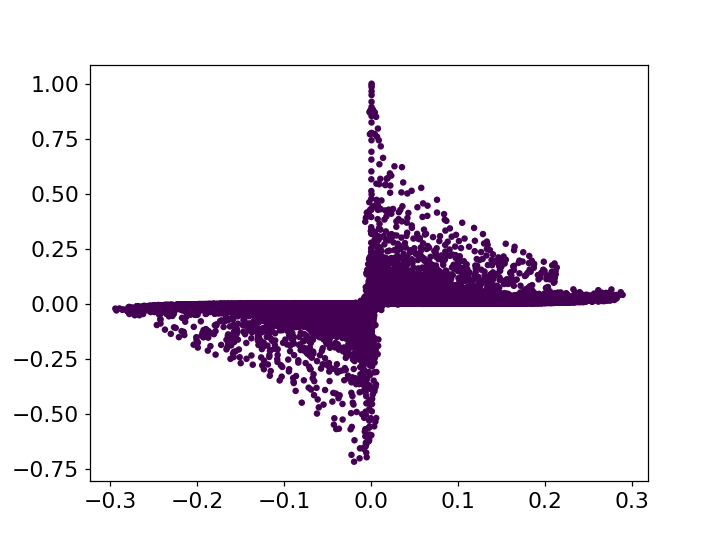

In [257]:
from sklearn.cluster import DBSCAN  # Import DBSCAN from scikit-learn
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Instantiate DBSCAN with specified parameters
dbscan = DBSCAN(eps=0.5, min_samples=5)

# Fit the DBSCAN model to the data and predict cluster labels
labels = dbscan.fit_predict(features)

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()  # Show the plot

<IPython.core.display.Javascript object>


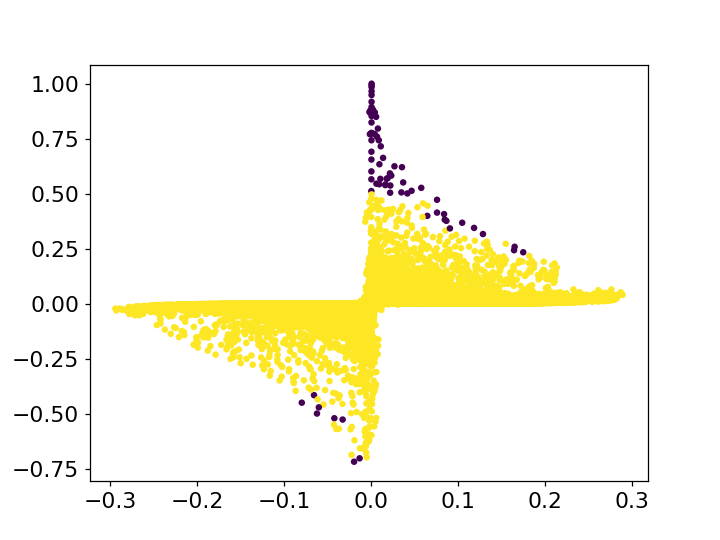

In [261]:
from sklearn.cluster import OPTICS  # Import OPTICS clustering algorithm
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Assuming 'features' is your feature matrix

# Instantiate OPTICS with specified parameters
optics_clusterer = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.1)

# Fit the OPTICS model to the data and predict cluster labels
optics_clusterer.fit(features)
labels = optics_clusterer.labels_

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()  # Show the plot

<IPython.core.display.Javascript object>


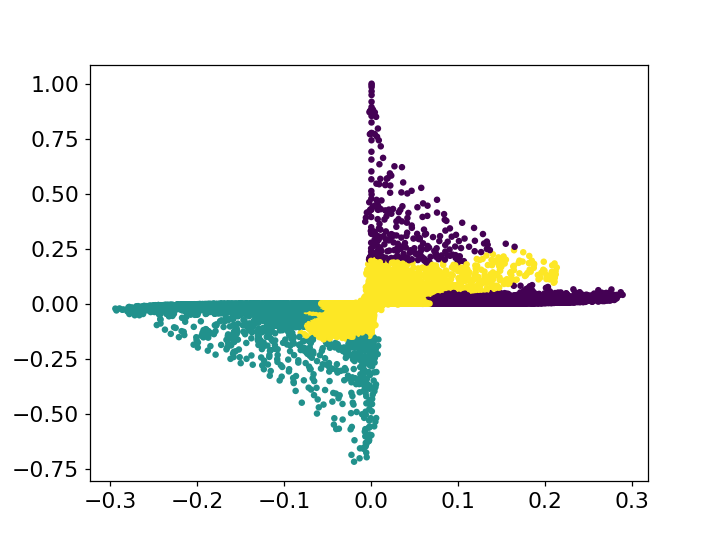

In [294]:
from sklearn.cluster import AgglomerativeClustering  # Import AgglomerativeClustering from scikit-learn
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Assuming 'features' is your feature matrix

# Instantiate AgglomerativeClustering with specified number of clusters
agglomerative_clusterer = AgglomerativeClustering(n_clusters=3)

# Fit the AgglomerativeClustering model to the data and predict cluster labels
labels = agglomerative_clusterer.fit_predict(features)

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()  # Show the plot

<IPython.core.display.Javascript object>


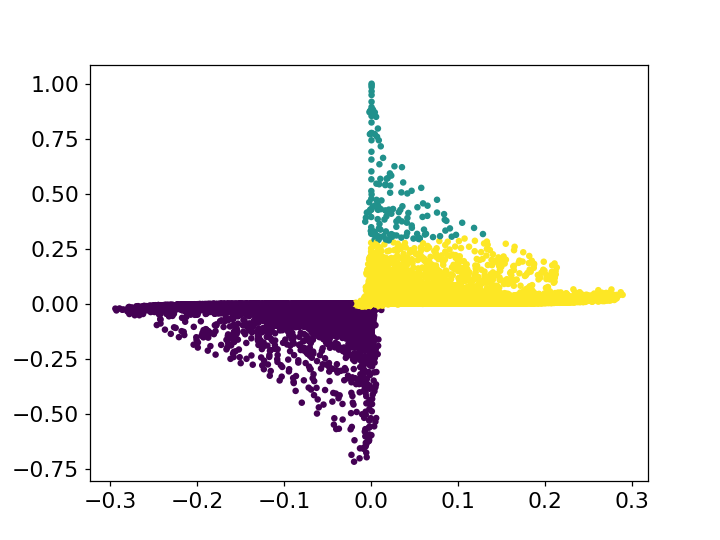

In [298]:
from sklearn.cluster import Birch  # Import BIRCH from scikit-learn
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Assuming 'features' is your feature matrix

# Instantiate BIRCH with specified parameters
birch_clusterer = Birch(n_clusters=3, threshold = 0.01)

# Fit the BIRCH model to the data and predict cluster labels
labels = birch_clusterer.fit_predict(features)

# Plot the clusters using a scatter plot
plt.scatter(features[:, 0], features[:, 1], c=labels, s=10, cmap='viridis')
plt.show()  # Show the plot

## Going for 3D example - With only the real part

In [311]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt# Performing the dominant balance analysis in time domain### 1. Constructing the feature matrix 
featuremap[:, :, -1] = uuu

labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

# Downsample for building model
shift_x, shift_t = 10, 10
tmin = 0

x0 = np.arange(0, len(x), shift_x)
t0 = np.arange(tmin, len(t), shift_t)
featuremap = featuremap[x0, :, :]
featuremap = featuremap[:, t0, :]

# Leave out near-zero field values (numerical noise and essentially zero dynamics)
lIT = it(u)
lIT = lIT[x0, :]
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT - TRS

features = np.reshape(featuremap, [len(x0)*len(t0), nfeatures], order='F')
features = features[mask.flatten('F'), :]

# Treat real/imag as separate features
# features = np.hstack((np.real(features), np.imag(features)))
features = np.real(features)

print(np.shape(features))

# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5

(15563, 3)


c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


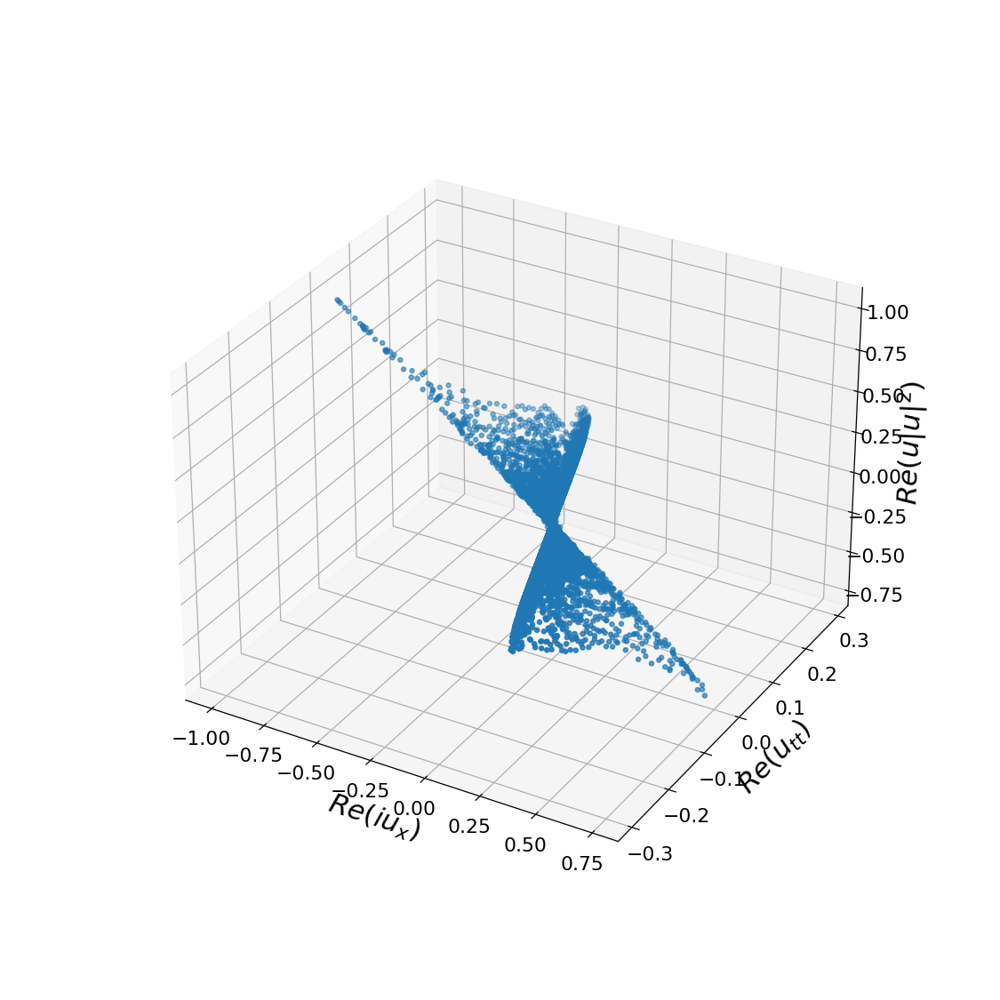

In [314]:
kk = 1
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features[:,0].flatten()[::kk], features[:,1].flatten()[::kk], features[:,2].flatten()[::kk], s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

In [315]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3).fit(features)
labels = gmm.predict(features)

<IPython.core.display.Javascript object>


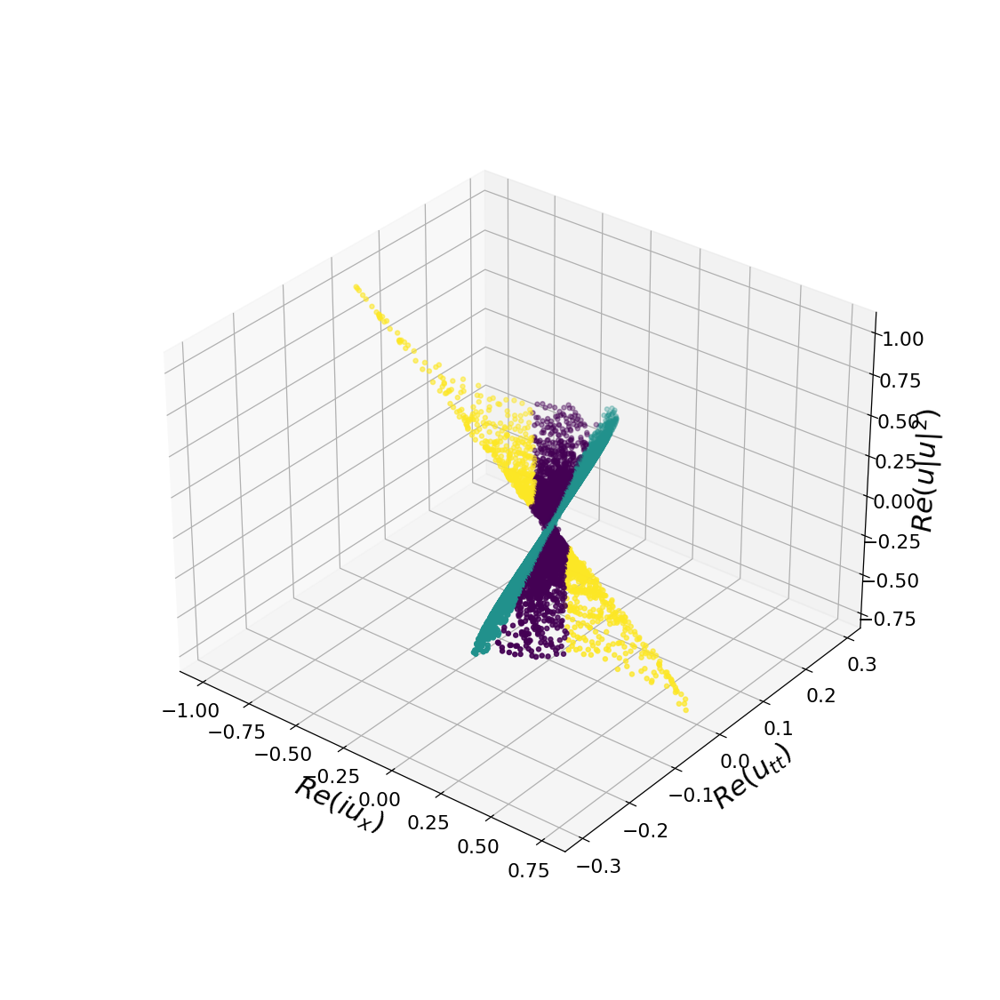

In [320]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features[:,0].flatten()[::kk], features[:,1].flatten()[::kk], features[:,2].flatten()[::kk], c=labels, s=10, cmap='viridis')
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

In [321]:
gmm

GaussianMixture(n_components=3)

## Going for 3D example - Real and Imaginary parts

In [347]:
# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = np.abs(ux)
featuremap[:, :, -2] = np.abs(utt)
featuremap[:, :, -1] = np.abs(uuu)

labels = ['$u_{x}$', '$u_{tt}$', '$uuu$']

# Downsample for building model
shift_x, shift_t = 10, 10
tmin = 0

x0 = np.arange(0, len(x), shift_x)
t0 = np.arange(tmin, len(t), shift_t)
featuremap = featuremap[x0, :, :]
featuremap = featuremap[:, t0, :]

# Leave out near-zero field values (numerical noise and essentially zero dynamics)
lIT = it(u)
lIT = lIT[x0, :]
lIT = lIT[:, t0]
mlIT = max(lIT.flatten())
mask = lIT > mlIT - TRS

features = np.reshape(featuremap, [len(x0)*len(t0), nfeatures], order='F')
features = features[mask.flatten('F'), :]

# Treat real/imag as separate features
features = np.hstack((np.real(features), np.imag(features)))
# features = np.real(features)

print(np.shape(features))

# features = np.hstack((np.real(features), np.imag(features))) / (L_D / L_NL)**1.5 * 0.5

(15563, 6)


c:\users\ermol\pysindy-master\examples\venv\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


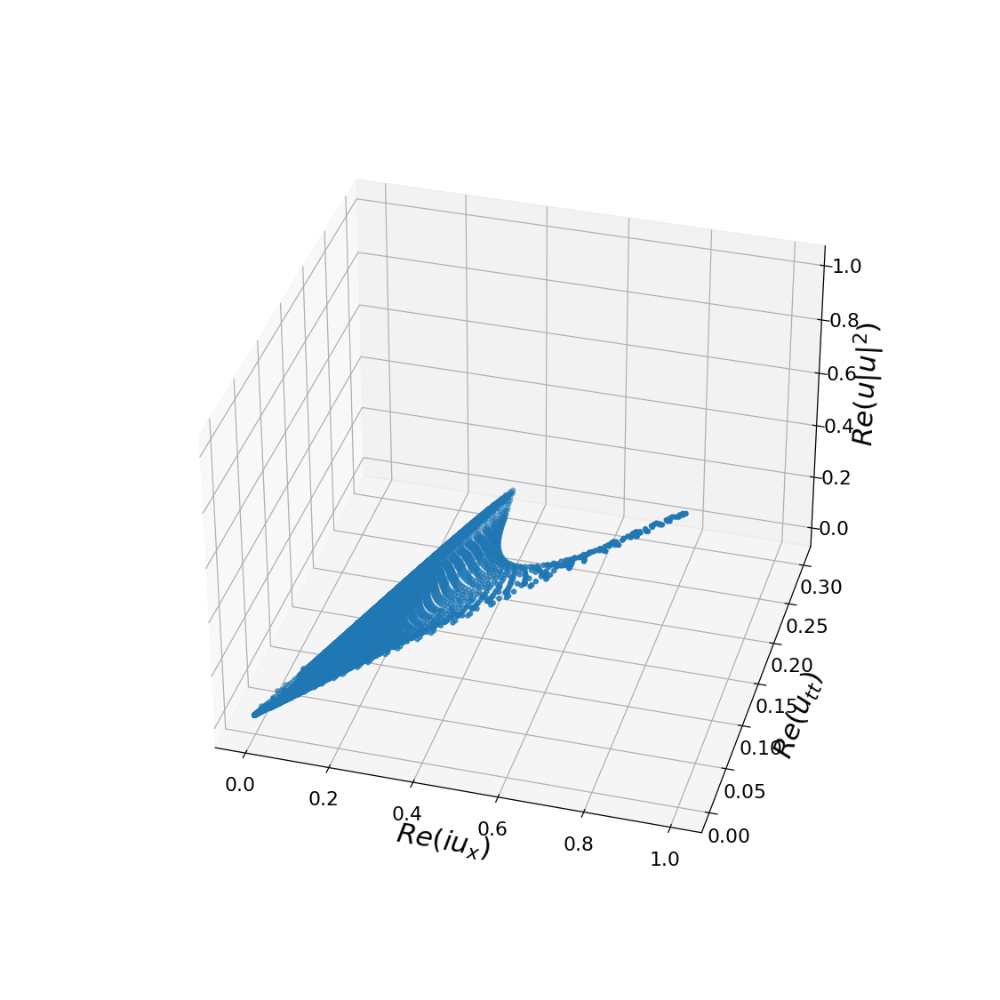

In [348]:
kk = 1
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features[:,0].flatten()[::kk], features[:,1].flatten()[::kk], features[:,2].flatten()[::kk], s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

In [349]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=11).fit(features)
labels = gmm.predict(features)

<IPython.core.display.Javascript object>


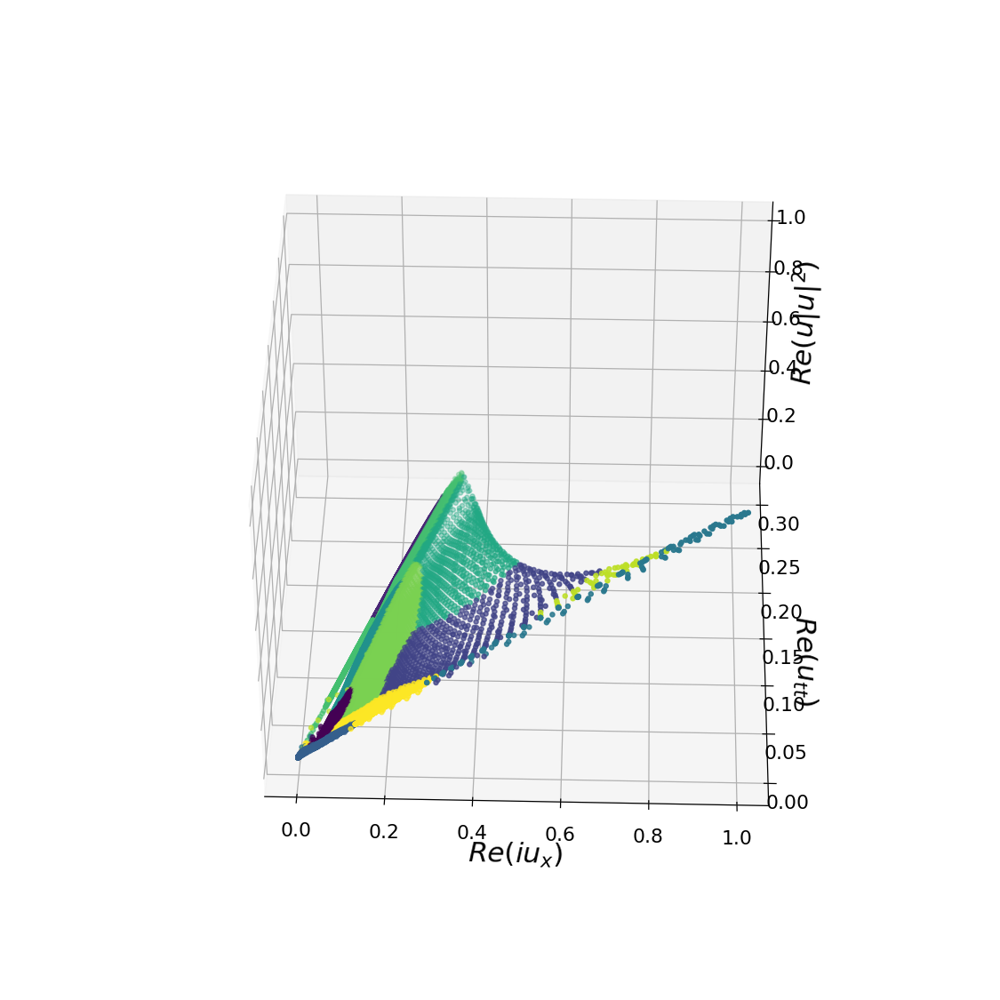

In [350]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features[:,0].flatten()[::kk], features[:,1].flatten()[::kk], features[:,2].flatten()[::kk], c=labels, s=10, cmap='viridis')
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
# ax.set_view(0,0,90)
plt.show()

In [351]:
## Hypothesis seletion procedure ### 1. Building the full feature matrix# Build feature library
nfeatures = 3 # features
featuremap = np.zeros([len(x), len(t), nfeatures], dtype='complex64');

featuremap[:, :, -3] = ux
featuremap[:, :, -2] = utt
featuremap[:, :, -1] = uuu

features_full = np.dstack((np.real(featuremap), np.imag(featuremap)))
print(np.shape(features_full))

(1000, 4096, 6)


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


<IPython.core.display.Javascript object>


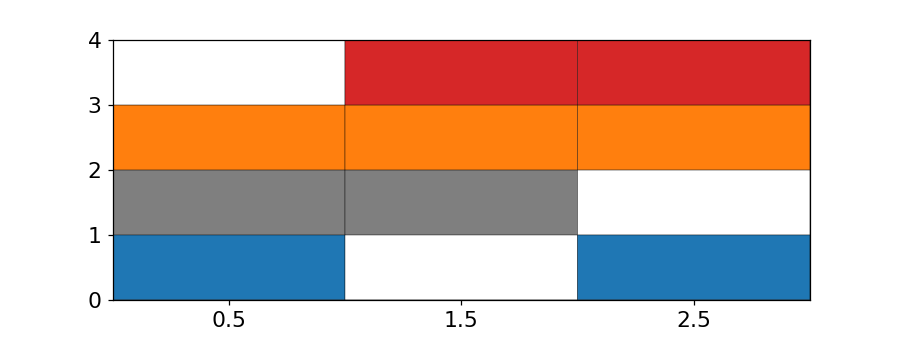

ValueError: The number of FixedLocator locations (3), usually from a call to set_ticks, does not match the number of ticklabels (15563).

In [352]:
### 2. Evaluate the best possible DB and display itimport matplotlib.cm as cm

# Seaborn colormap
import seaborn as sns
from matplotlib.colors import ListedColormap
sns_list = sns.color_palette(n_colors=10)
sns_list.insert(0, '#ffffff')  # Insert white at zero position
sns_list.insert(1, '#1f77b4')  # Insert white at zero position
sns_list.insert(2, '#7f7f7f')  # Insert white at zero position
sns_list.insert(3, '#ff7f0e')  # Insert white at zero position
sns_list.insert(4, '#d62728')  # Insert white at zero position

sns_cmap = ListedColormap(sns_list)

cm = sns_cmap
print(sns.color_palette(n_colors=10).as_hex())



balance_models = np.asarray([[1,0,1],[1,1,0],[1,1,1],[0,1,1]])
nmodels = 4
gridmap = balance_models.copy()
gridmap = (gridmap.T*np.arange(nmodels)).T  # Scale map so that active terms can be color-coded

gridmap = (balance_models.T*np.arange(1, nmodels+1)).T

plt.figure(figsize=(8, 3))
plt.pcolor(gridmap, vmin=-0.5, vmax=cm.N-0.5, cmap=cm, edgecolors='k')
plt.gca().set_xticks(np.arange(0.5, nfeatures+0.5))
plt.gca().set_xticklabels(labels, fontsize=16)
plt.gca().set_yticks(np.arange(0.5, nmodels+0.5))
plt.gca().set_yticklabels(range(0, nmodels), fontsize=16)
plt.show()

cm

idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 150
idx_empty = 170
idx_empty = 180
idx_empty = 190
idx_empty = 200
idx_empty = 210
idx_empty = 220
idx_empty = 230
idx_empty = 240
idx_empty = 250
idx_empty = 260
idx_empty = 270
idx_empty = 280
idx_empty = 290
idx_empty = 300
idx_empty = 310
total score for NLSE DB= 0.6808919356005554
total score for DISP DB= 0.0
total score for NONL DB= 0.09992218097253915
total score for LAST DB= 0.0
Best possble score (pointwise)= 0.6808919356005554
total score for the selected DB= 0.6808919356005554
idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 100
idx_empty = 110
idx_empty = 120
idx_empty = 130
idx_empty = 140
total score for NLSE DB= 0.5735414053764949
total score for DISP DB= 0.6611780175532649
total score for NONL DB= 0.0

idx_empty = 0
idx_empty = 10
idx_empty = 20
idx_empty = 30
idx_empty = 40
idx_empty = 50
idx_empty = 60
idx_empty = 70
idx_empty = 80
idx_empty = 90
idx_empty = 100
idx_empty = 110
idx_empty = 120
idx_empty = 130
idx_empty = 140
idx_empty = 490
idx_empty = 500
idx_empty = 510
idx_empty = 520
idx_empty = 530
idx_empty = 540
idx_empty = 550
idx_empty = 560
idx_empty = 570
idx_empty = 580
idx_empty = 590
idx_empty = 600
idx_empty = 610
idx_empty = 620
idx_empty = 630
idx_empty = 640
idx_empty = 650
idx_empty = 660
idx_empty = 670
idx_empty = 680
idx_empty = 690
idx_empty = 700
idx_empty = 710
idx_empty = 720
idx_empty = 730
idx_empty = 740
idx_empty = 750
idx_empty = 760
idx_empty = 770
idx_empty = 780
idx_empty = 790
idx_empty = 800
idx_empty = 810
idx_empty = 820
idx_empty = 830
idx_empty = 840
idx_empty = 850
idx_empty = 860
idx_empty = 870
idx_empty = 880
idx_empty = 890
idx_empty = 900
idx_empty = 910
idx_empty = 920
idx_empty = 930
idx_empty = 940
idx_empty = 950
idx_empty = 960
idx

<IPython.core.display.Javascript object>


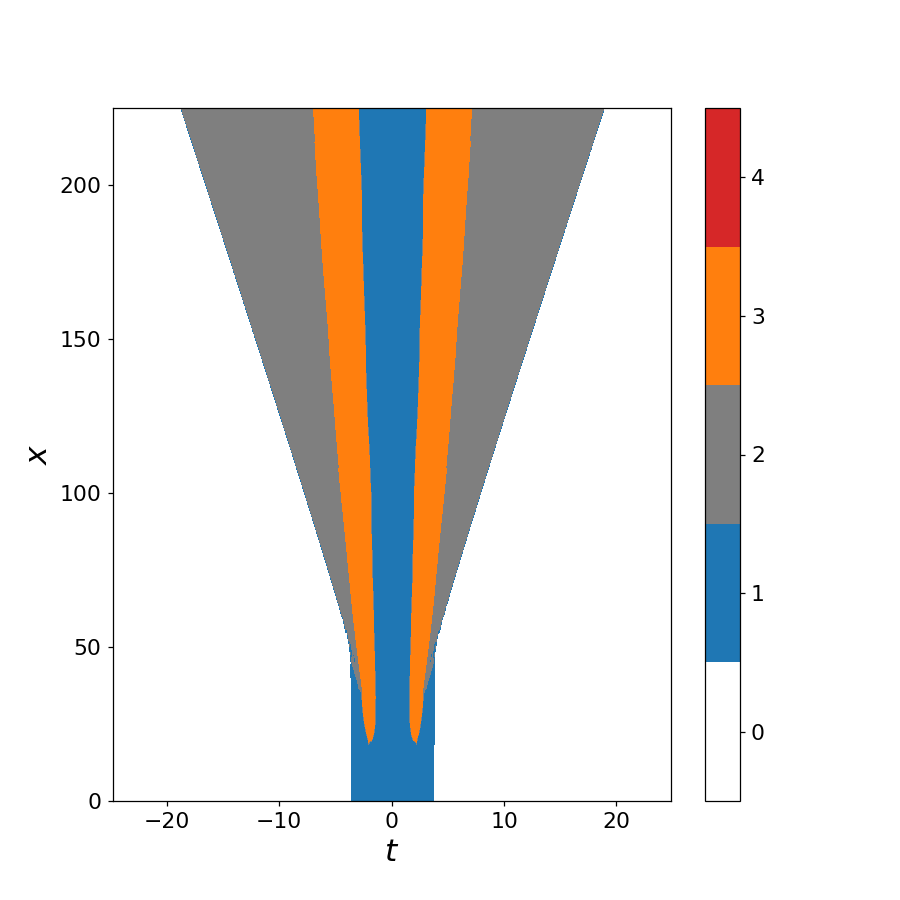

OBTAINED SCORE = 0.8142019473601454
MAXIMUM POSSIBLE SCORE = 0.8320725717172375


In [353]:
### DisplayS = 5
balancemap = np.empty_like(clustermap)
M_BEST_POITWISE = []
M_SEL = []

for cluster_ind in range(1, nc+1, 1):
#     print(cluster_ind)
    CLUSTERMAP = clustermap * 0
    for i in range(len(t)):
        for j in range(len(x)):
            if clustermap[j,i] == cluster_ind:
                CLUSTERMAP[j,i] = cluster_ind
            else:
                CLUSTERMAP[j,i] = 0

#     # CLUSTERMAP = clustermap
#     plt.figure(figsize=(8, 8))
#     plt.imshow(CLUSTERMAP, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
#               extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
#     plt.xlabel('$t$')
#     plt.ylabel('$x$')
#     plt.show()

    MAP2D = []
    MGN2D = []

    M_NLSE = []
    M_DISP = []
    M_NONL = []
    M_LAST = []

    #Check the first cluster
    for ind in range(0, 1000, 10): #SCAN THROUGH ALL X
#         print(ind)
#         display.clear_output(wait = True)
    #     time.sleep(0)
    #     print(ind)
        MAP1D = []
        MGN = []
        map1d = np.zeros(len(t))
        mgn1d = np.zeros(len(t))



        MGN1 = []
        SIGMA1 = []
        GN1 = []

        MGN2 = []
        SIGMA2 = []
        GN2 = []

        MGN3 = []
        SIGMA3 = []
        GN3 = []

        MGN4 = []
        SIGMA4 = []
        GN4 = []

        cc = np.where(clustermap[ind, :]==cluster_ind)
        if np.shape(cc)[1] == 0:
            print('idx_empty =', ind)

        #Constructing the corresponding matix at given x
        M1 =  np.vstack([np.sqrt(features_full[ind,cc, 0]**2 + features_full[ind,cc, 3]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 1]**2 + features_full[ind,cc, 4]**2).flatten(), 
                        np.sqrt(features_full[ind,cc, 2]**2 + features_full[ind,cc, 5]**2).flatten()])
        #Normalise the data
    #     minval = np.min(M1[np.nonzero(M1)])
    #     M = M1 / minval
        M = M1 / M1.min(axis=0)
        l = np.shape(M)[1]

        #How well a point corresponds to a particular dynamics?
        for i in range(l):
            #FULL
            gn = 1
            sigma = np.log10(max(M[:,i])) - np.log10(min(M[:,i]))
            mgn1 = gn / (1 + sigma)
            MGN1 = np.append(MGN1, mgn1)
            SIGMA1 = np.append(SIGMA1, sigma)
            GN1 = np.append(GN1, gn)

            #DISP
            if min(M[0:2:1,i]) - M[2,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:2:1,i])-M[2,i])/np.log10(min(M[0:2:1,i])+M[2,i])
    #             gn = math.log(min(M1[0:2:1,i])-M1[2,i] , min(M1[0:2:1,i])+M1[2,i])
            sigma = np.log10(max(M[0:2,i]))-np.log10(min(M[0:2,i]))
            sigma = np.log10(max(M1[0:2,i]))-np.log10(min(M1[0:2,i]))
            mgn2 = gn / (1 + sigma)
            MGN2 =  np.append(MGN2, mgn2)
            SIGMA2 = np.append(SIGMA2, sigma)
            GN2 = np.append(GN2, gn)

            #NONL
            if min(M[0:3:2,i]) - M[1,i] < 1:
                gn = 0
            else:
                gn = np.log10(min(M[0:3:2,i]) - M[1,i]) / np.log10(min(M[0:3:2,i]) + M[1,i])
            sigma = np.log10(max(M[0:3:2,i])) - np.log10(min(M[0:3:2,i]))
            mgn3 = gn / (1 + sigma)
            MGN3 =  np.append(MGN3, mgn3)
            SIGMA3 = np.append(SIGMA3, sigma)
            GN3 = np.append(GN3, gn)

            #LAST
            if min(M[1:3:1,i]) - M[0,i] < 1:
                gn = 0
            else:
                 gn = np.log10(min(M[1:3:1,i]) - M[0,i]) / np.log10(min(M[1:3:1,i]) + M[0,i])
            sigma = np.log10(max(M[1:3:1,i])) - np.log10(min(M[1:3:1,i]))
            mgn4 = gn / (1 + sigma)
            MGN4 =  np.append(MGN4, mgn4)
            SIGMA4 = np.append(SIGMA4, sigma)
            GN4 = np.append(GN4, gn)

            if mgn1 > mgn2 and mgn1 > mgn3 and mgn1 > mgn4:
                MAP1D = np.append(MAP1D, 3)
                MGN = np.append(MGN, mgn1)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn1)

            if mgn2 > mgn1 and mgn2 > mgn3 and mgn2 > mgn4:
                MAP1D = np.append(MAP1D, 2)
                MGN = np.append(MGN, mgn2)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn2)

            if mgn3 > mgn1 and mgn3 > mgn2 and mgn3 > mgn4:
                MAP1D = np.append(MAP1D, 1)
                MGN = np.append(MGN, mgn3)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn3)

            if mgn4 > mgn1 and mgn4 > mgn2 and mgn4 > mgn3:
                MAP1D = np.append(MAP1D, 4)
                MGN = np.append(MGN, mgn4)
                M_BEST_POITWISE = np.append(M_BEST_POITWISE, mgn4)

        M_NLSE = np.append(M_NLSE, MGN1)
        M_DISP = np.append(M_DISP, MGN2)
        M_NONL = np.append(M_NONL, MGN3)
        M_LAST = np.append(M_LAST, MGN4)
        
        map1d[cc] = MAP1D
        mgn1d[cc] = MGN
        MAP2D = np.append(MAP2D, map1d)
        MGN2D = np.append(MGN2D, mgn1d)
        
        


#         plt.figure(figsize=(12, 12));
#         plt.subplot(3,1,3)
#         plt.plot(t[cc], np.abs(u[ind, cc].flatten())**2, color = 'black', linestyle = ':')
#         scatter = plt.scatter(t[cc], np.abs(u[ind, cc])**2, c = MAP1D, cmap=cm, vmin=-0.5, vmax=cm.N-0.5)
#         plt.grid('True')
#         plt.ylabel('$|\u03C8|^{2}$')
#         plt.xlim(-5,20)
#         plt.xlabel('t')
#     #     plt.legend(handles=scatter.legend_elements()[0], labels=classes)

#         plt.subplot(3,1,1)
#         plt.semilogy(t[cc], np.asarray(M[0,:]), label = '$i \u03C8_{\u03BE}$', color = 'red')
#         plt.semilogy(t[cc], np.asarray(M[1,:]), label = '$\u03C8_{\u03C4 \u03C4}$',color = 'green')
#         plt.semilogy(t[cc], np.asarray(M[2,:]), label = '$\u03C8|\u03C8|^2$', color = 'purple')
#     #     plt.ylim((10**(-4), 1))
#         plt.xlim(-5,20)
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('Abs individual contributions')

#         plt.subplot(3,1,2)
#         plt.plot(t[cc], MGN1, color = 'orange', label = 'NLSE DB')
#         plt.plot(t[cc], MGN2, color = 'gray', label = 'DISP DB')
#         plt.plot(t[cc], MGN3, color = 'blue', label = 'NONL DB')
#         plt.plot(t[cc], MGN4, color = 'red', label = '- DB')
#         plt.plot(t[cc], MGN, color = 'black', linestyle = ':', label = 'BEST DB')
#         plt.legend()
#         plt.grid('True')
#         plt.ylabel('M')
#         plt.xlim(-5,20)
#         plt.show()

        
        
    n_total = len(M_NLSE)
    SCORE_NLSE = np.sum(M_NLSE) / n_total
    SCORE_DISP = np.sum(M_DISP) / n_total
    SCORE_NONL = np.sum(M_NONL) / n_total
    SCORE_LAST = np.sum(M_LAST) / n_total
    SCORE_BEST = np.sum(MGN2D[np.nonzero(MGN2D)])/len(MGN2D[np.nonzero(MGN2D)])

    print('total score for NLSE DB=',SCORE_NLSE)
    print('total score for DISP DB=',SCORE_DISP)
    print('total score for NONL DB=',SCORE_NONL)
    print('total score for LAST DB=',SCORE_LAST)
    print('Best possble score (pointwise)=',SCORE_BEST)

    if SCORE_NLSE >= SCORE_DISP and SCORE_NLSE >= SCORE_NONL and SCORE_NLSE >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NLSE)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 3

    if SCORE_DISP > SCORE_NLSE and SCORE_DISP >= SCORE_NONL and SCORE_DISP >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_DISP)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 2

    if SCORE_NONL > SCORE_NLSE and SCORE_NONL > SCORE_DISP and SCORE_NONL >= SCORE_LAST:
        M_SEL = np.append(M_SEL, M_NONL)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 1

    if SCORE_LAST > SCORE_NLSE and SCORE_LAST > SCORE_DISP and SCORE_LAST > SCORE_NONL:
        M_SEL = np.append(M_SEL, M_LAST)
        MASK = (clustermap == cluster_ind)
        balancemap[MASK] = 4

    print('total score for the selected DB=', np.sum(M_SEL) / len(M_SEL))
    
plt.figure(figsize=(8, 8))
plt.imshow(balancemap, cmap=cm, vmin=-0.5, vmax=cm.N-0.5, origin='lower',
          extent=[min(t), max(t), min(x), max(x)], aspect='auto'); 
plt.xlabel('$t$')
plt.ylabel('$x$')
plt.colorbar(boundaries=np.arange(-0.5, 5.5), ticks=np.arange(0, 5))
plt.show()

print('OBTAINED SCORE =', np.sum(M_SEL) / len(M_SEL))
print('MAXIMUM POSSIBLE SCORE =', np.sum(M_BEST_POITWISE) / len(M_BEST_POITWISE))

In [345]:
balance_idx = balancemap.flatten()

<IPython.core.display.Javascript object>


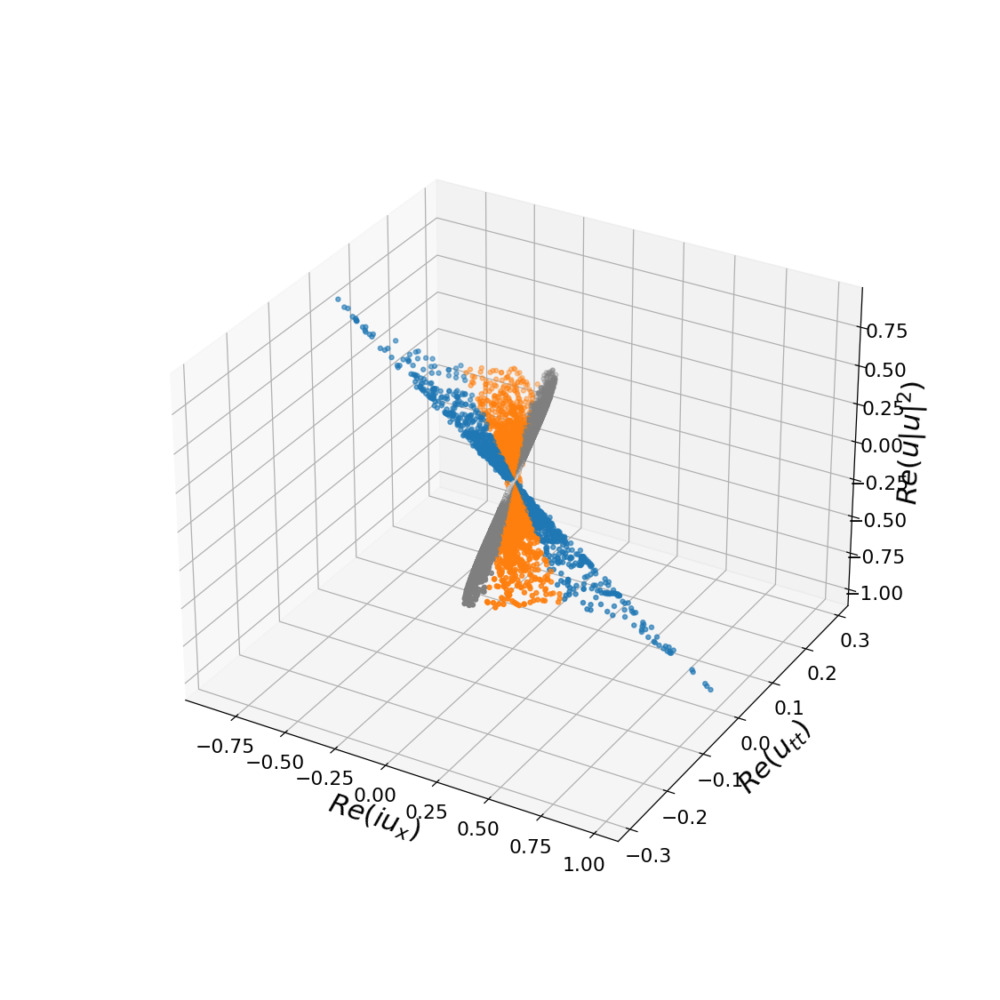

In [346]:
# %matplotlib notebook
# from mpl_toolkits.mplot3d import axes3d

import random
kk = 100

# mu = np.vstack((np.tile([255, 0, 0], (50, 1)), np.tile([255, 1, 255], (50, 1))))
mu = []
MU = []
for i in range(0, int(len(balance_idx)/kk)):
    if balance_idx[kk * i]==0:
        mu = np.array([255, 255, 255])
    if balance_idx[kk * i]==1:
        mu = np.array([31, 119, 180])
    if balance_idx[kk * i]==2:
        mu = np.array([127, 127, 127])
    if balance_idx[kk * i]==3:
        mu = np.array([255, 127, 14])
    MU = np.append(MU,mu)
MU = np.reshape(MU, (int(len(MU)/3) , 3))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(features_full[:,:,0].flatten()[::kk], features_full[:,:,1].flatten()[::kk], features_full[:,:,2].flatten()[::kk], c=MU/255, s=10)
ax.set_xlabel('$Re(iu_x)$')
ax.set_ylabel('$Re(u_{tt})$')
ax.set_zlabel('$Re(u|u|^2)$')
plt.show()